## COMPARACIÓN DE MÉTODOS HÍBRIDOS DE MACHINE LEARNING PARA CATEGORIZAR RECURSOS MINERALES EN UN DEPÓSITO CUPRÍFERO EN EL PERÚ
##### Elaborado por el Ing. de minas Jairo Marquina


#### ANÁLISIS ESTADISTICO DE DATOS (EDA)

In [1]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt


In [2]:
bd=pd.read_csv("comp15.csv")

In [3]:
bd.head()

,X,Y,Z,Cu,Mo,Rock
0,374826.686,8716699.217,4902.138,0.034,0.009,2
1,374826.686,8716699.217,4887.138,0.018,0.000,3
2,374826.686,8716699.217,4872.138,0.007,0.007,3
3,374826.686,8716699.217,4857.138,0.027,0.003,3
4,374826.686,8716699.217,4842.138,0.008,0.004,3


In [4]:
pd.set_option('display.float_format', '{:.2f}'.format)
bd.describe()

,X,Y,Z,Cu,Mo,Rock
count,5654.00,5654.00,5654.00,5654.00,5654.00,5654.00
mean,375606.25,8717015.68,4473.54,0.43,0.01,2.16
std,307.24,393.54,169.54,0.29,0.01,0.78
min,374821.06,8716003.08,4050.35,0.00,0.00,1.00
25%,375393.42,8716738.40,4340.07,0.23,0.00,2.00
50%,375602.29,8716995.80,4462.81,0.38,0.01,2.00
75%,375824.99,8717271.73,4607.49,0.58,0.02,3.00
max,376414.81,8718153.15,4902.14,2.95,0.09,5.00


In [5]:
import pandas as pd

# Configurar pandas para mostrar los números con dos decimales
pd.set_option('display.float_format', '{:.2f}'.format)

# Calcular estadísticas descriptivas
stats_summary = bd.describe().T

# Calcular métricas adicionales
stats_summary["variance"] = bd.var()  # Varianza
stats_summary["std_dev"] = bd.std()  # Desviación estándar
stats_summary["skewness"] = bd.skew()  # Asimetría
stats_summary["kurtosis"] = bd.kurtosis()  # Curtosis

# Mostrar el resultado
print(stats_summary)


       count       mean    std        min        25%        50%        75%  \
X    5654.00  375606.25 307.24  374821.06  375393.42  375602.29  375824.99   
Y    5654.00 8717015.68 393.54 8716003.08 8716738.40 8716995.80 8717271.73   
Z    5654.00    4473.54 169.54    4050.35    4340.07    4462.81    4607.49   
Cu   5654.00       0.43   0.29       0.00       0.23       0.38       0.58   
Mo   5654.00       0.01   0.01       0.00       0.00       0.01       0.02   
Rock 5654.00       2.16   0.78       1.00       2.00       2.00       3.00   

            max  variance  std_dev  skewness  kurtosis  
X     376414.81  94394.22   307.24      0.01     -0.45  
Y    8718153.15 154875.70   393.54      0.19     -0.23  
Z       4902.14  28743.49   169.54      0.07     -0.81  
Cu         2.95      0.08     0.29      1.21      2.73  
Mo         0.09      0.00     0.01      1.44      2.28  
Rock       5.00      0.61     0.78      0.78      1.05  


In [6]:
# Obtener estadísticas descriptivas de la columna 'Rock'
rock_stats = bd['Rock'].describe()
# Mostrar estadísticas descriptivas
print("\nEstadísticas descriptivas de la columna 'Rock':")
print(rock_stats)


Estadísticas descriptivas de la columna 'Rock':
count   5654.00
mean       2.16
std        0.78
min        1.00
25%        2.00
50%        2.00
75%        3.00
max        5.00
Name: Rock, dtype: float64


In [7]:
X=np.array(bd['X'])
Y=np.array(bd['Y'])
Z=np.array(bd['Z'])
CU=np.array(bd['Cu'])
MO=np.array(bd['Mo'])
ROCK=np.array(bd['Rock'])

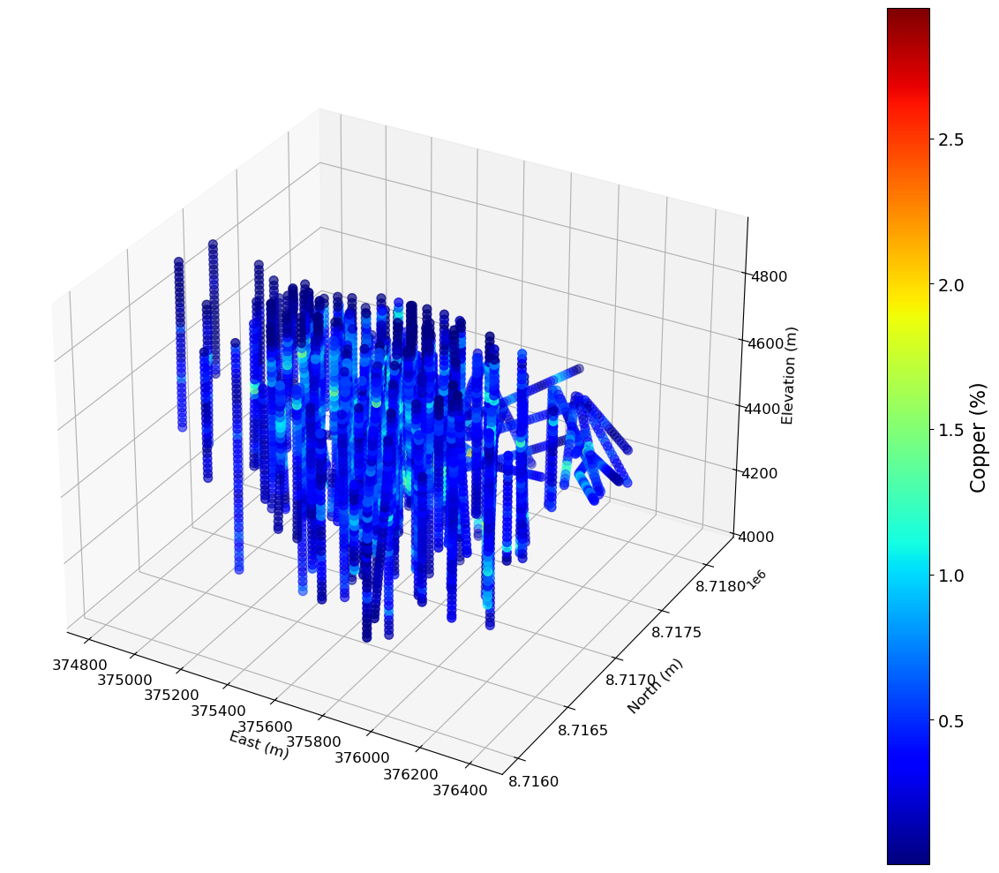

In [8]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D

# Configuración de parámetros
marker_size = 50
cmap = cm.jet

# Crear gráfico 3D
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot para ley de cobre
sc = ax.scatter(bd["X"], bd["Y"], bd["Z"], c=bd["Cu"], s=marker_size, cmap=cmap)

# Configuración de los ejes
ax.set_title("", fontsize=14)
ax.set_xlabel("East (m)", fontsize=12)
ax.set_ylabel("North (m)", fontsize=12)
ax.set_zlabel("Elevation (m)", fontsize=12)

# Aumentar el tamaño de los valores de los ticks en los ejes X, Y y Z
ax.tick_params(axis='x', labelsize=12)  # Aumentar tamaño de los ticks en X
ax.tick_params(axis='y', labelsize=12)  # Aumentar tamaño de los ticks en Y
ax.tick_params(axis='z', labelsize=12)  # Aumentar tamaño de los ticks en Z

# Agregar barra de colores
cbar = fig.colorbar(sc, ax=ax, pad=0.1)
cbar.set_label("Copper (%)", fontsize=16)  # Tamaño del nombre de la leyenda
cbar.ax.tick_params(labelsize=14)  # Tamaño de los valores de la leyenda

# Ajustes finales
plt.tight_layout()
#plt.savefig('3dCobre.jpg', dpi=800)
plt.show()


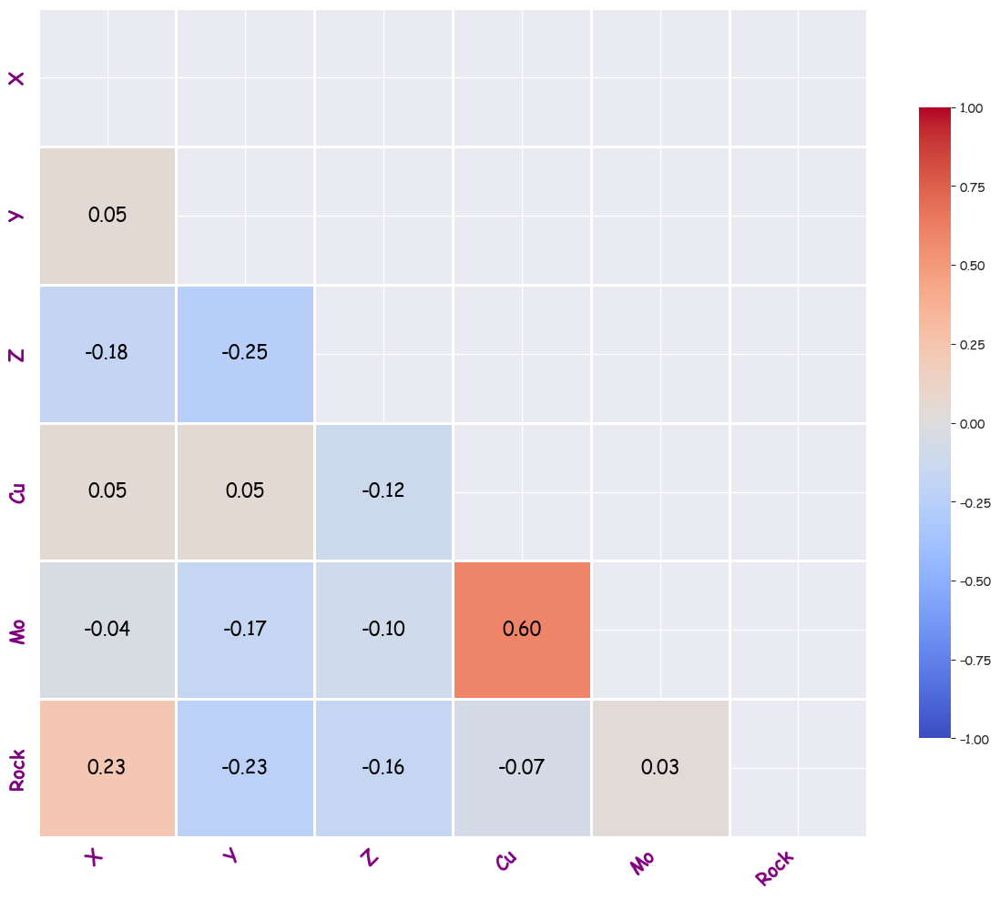

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set the style and font
sns.set_style("darkgrid")  # Cambiado a 'darkgrid' para un estilo más oscuro
plt.rcParams['font.family'] = 'Comic Sans MS'  # Fuente diferente

# Calculate the correlation
correlation = bd.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlation, dtype=bool))

# Create a figure and an axis with a specific size
fig, ax = plt.subplots(figsize=(12, 10))  # Tamaño ajustado

# Define the color map (viridis for a vibrant look)
cmap = sns.color_palette("coolwarm", as_cmap=True)  # Cambiado a 'coolwarm'

# Create the heat map of the correlation
sns.heatmap(correlation, mask=mask, cmap=cmap, vmin=-1, vmax=1, center=0, annot=True, fmt=".2f",
            square=True, linewidths=1, cbar_kws={"shrink": .75}, annot_kws={"size": 15, "color": "black"})  # Ajustes de anotación

# Add a title
#ax.set_title('Correlation Matrix', fontsize=20, fontweight='bold', pad=20, color='darkblue')  # Título estilizado

# Adjust the x and y axis ticks to make them more readable and styled
ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=15, fontweight='bold', rotation=45, ha='right', color='purple')
ax.set_yticklabels(ax.get_ymajorticklabels(), fontsize=15, fontweight='bold', color='purple')

# Adjust spacing to prevent clipping in the y-axis label
plt.tight_layout()

# Save in PNG format with 600 dpi
#plt.savefig('orrelación.jpg', dpi=800, bbox_inches='tight')

plt.show()


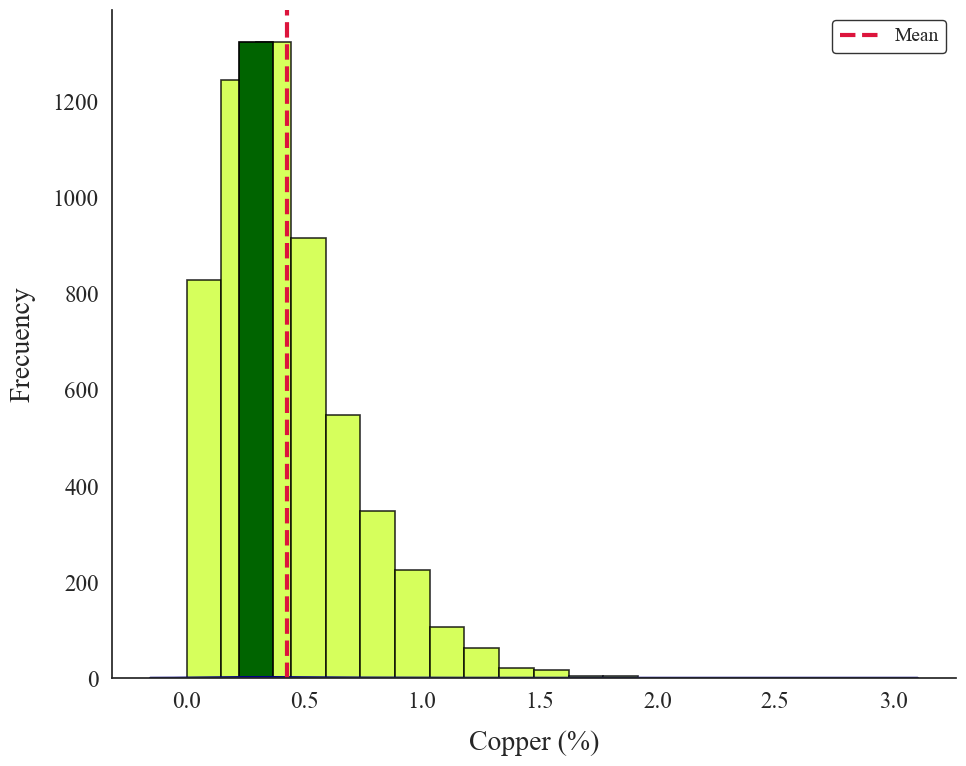

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Configuración del tema y parámetros para figuras profesionales
sns.set_theme(style="white", font_scale=1.5)  # Tema minimalista y escala de fuente mejorada
plt.rcParams['font.family'] = 'Times New Roman'  # Fuente clásica para artículos científicos

# Crear figura con un solo gráfico
fig, ax = plt.subplots(1, 1, figsize=(10, 8))

# Colores para los histogramas
color_cu = '#CCFF33'  # Color base para Cu
highlight_cu = '#006400'  # Color oscuro para resaltar

# Datos de histograma
cu_counts, cu_bins, _ = ax.hist(bd.Cu, bins=20, color=color_cu, alpha=0.8, edgecolor='black', linewidth=1.2)

# Resaltar bins con mayor frecuencia
ax.bar(cu_bins[:-1][cu_counts == cu_counts.max()], cu_counts.max(), width=np.diff(cu_bins)[0], color=highlight_cu, edgecolor='black', linewidth=1.2)

# Añadir KDE y línea de la media
sns.kdeplot(bd.Cu, color="navy", lw=2, ax=ax)
ax.axvline(np.mean(bd.Cu), color='crimson', linestyle='--', lw=3, label='Mean')
ax.set_title('', fontsize=20, fontweight='bold', pad=15)
ax.set_xlabel('Copper (%)', fontsize=20, labelpad=12)
ax.set_ylabel('Frecuency', fontsize=20, labelpad=12)
ax.legend(fontsize=14, loc='upper right', frameon=True, edgecolor='black')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Ajustar diseño y mostrar
plt.tight_layout()
#plt.savefig('histograma_cobre_resaltado.jpg', dpi=800, bbox_inches='tight')

plt.show()


#### CODIFICAR LAS COORDENADAS

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes
import kmodes.util 
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import PowerTransformer
import pandas as pd
import seaborn as sns
import plotly.express as px

plt.style.use("_classic_test_patch")

df = pd.read_csv("Bdfinal.csv", sep=",")
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN


In [12]:
grid_x = np.linspace(374780,376430, num=55, endpoint=False) #Coord. de origen x, coord. de termino x, nª de celdas x.
grid_y = np.linspace(8715970,8718190, num=74, endpoint=False) #Coord. de origen y, coord. de termino y, nª de celdas y.
grid_z = np.linspace(4010,4940, num=31, endpoint=False) #Coord. de origen x, coord. de termino y, nª de celdas z.

zg, yg, xg = np.meshgrid(grid_z, grid_y, grid_x, indexing='ij')

z_g = zg.ravel()
x_g = xg.ravel()
y_g = yg.ravel()

d = {'X': x_g, 'Y': y_g, "Z": z_g}
df1 = pd.DataFrame(data=d) #Creación del dataframe 
       
df["X"] = df1["X"]
df["Y"] = df1["Y"]
df["Z"] = df1["Z"]

df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z
0,NaN,NaN,NaN,NaN,NaN,374780.00,8715970.00,4010.00
1,NaN,NaN,NaN,NaN,NaN,374810.00,8715970.00,4010.00
2,NaN,NaN,NaN,NaN,NaN,374840.00,8715970.00,4010.00
3,NaN,NaN,NaN,NaN,NaN,374870.00,8715970.00,4010.00
4,NaN,NaN,NaN,NaN,NaN,374900.00,8715970.00,4010.00


In [13]:
df.loc[df["OK"] < 0.00, "OK"] = -99
df.replace(-99, np.nan, inplace=True)
df= df.dropna()
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00


In [14]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00


In [15]:
import pandas as pd

# Configurar pandas para mostrar los números con dos decimales
pd.set_option('display.float_format', '{:.2f}'.format)

# Calcular estadísticas descriptivas
stats_summary = df.describe().T

# Calcular métricas adicionales
stats_summary["variance"] = df.var()  # Varianza
stats_summary["std_dev"] = df.std()  # Desviación estándar
stats_summary["skewness"] = df.skew()  # Asimetría
stats_summary["kurtosis"] = df.kurtosis()  # Curtosis

# Mostrar el resultado
print(stats_summary)

                               count       mean    std        min        25%  \
OK                         101048.00       0.33   0.16       0.00       0.23   
OK_Lagrangian              101048.00      -0.01   0.02      -0.08      -0.01   
OK_average_sample_distance 101048.00     234.48  57.05     104.39     197.24   
OK_krig_var                101048.00       0.08   0.03       0.00       0.05   
OK_n_samples               101048.00     111.84  77.42       1.00      34.00   
X                          101048.00  375610.77 437.86  374780.00  375260.00   
Y                          101048.00 8716993.07 577.79 8715970.00 8716510.00   
Z                          101048.00    4441.52 249.08    4010.00    4250.00   

                                  50%        75%        max  variance  \
OK                               0.32       0.41       2.03      0.03   
OK_Lagrangian                   -0.00      -0.00       0.00      0.00   
OK_average_sample_distance     229.43     266.28     442.94 

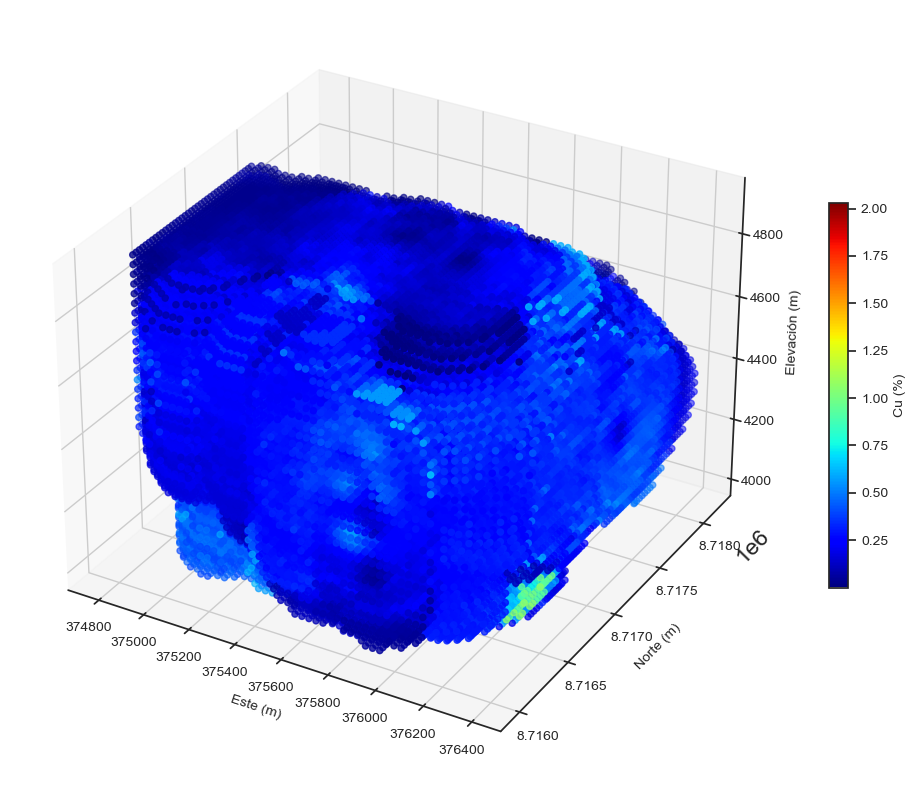

In [16]:
import matplotlib.pyplot as plt
from matplotlib import rcParams

# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'  # Cambiar a sans-serif
rcParams['font.size'] = 10             # Tamaño de fuente más pequeño

# Extraer las columnas X, Y, Z y OK para graficar
X = df['X']
Y = df['Y']
Z = df['Z']
OK = df['OK']

# Crear la figura 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crear una dispersión 3D
sc = ax.scatter(X, Y, Z, c=OK, cmap='jet', marker='o')

# Añadir la barra de color
cbar = fig.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label('Cu (%)', fontsize=10)  # Etiqueta de la barra de color con tamaño ajustado
cbar.ax.tick_params(labelsize=10)       # Tamaño más pequeño para los números de la barra de color

# Etiquetas de los ejes
ax.set_xlabel('Este (m)', fontsize=10)  # Etiqueta con fuente sans-serif y tamaño ajustado
ax.set_ylabel('Norte (m)', fontsize=10)
ax.set_zlabel('Elevación (m)', fontsize=10)
# Tamaño más pequeño para los números de los ejes
ax.tick_params(axis='x', labelsize=10)  # Reducir tamaño de las marcas en el eje X
ax.tick_params(axis='y', labelsize=10)  # Reducir tamaño de las marcas en el eje Y
ax.tick_params(axis='z', labelsize=10)  # Reducir tamaño de las marcas en el eje Z


# Mostrar gráfico con un diseño ajustado
plt.tight_layout()
#plt.savefig('Image/3d modelo ok.jpg', dpi=600)
# Mostrar la gráfica
plt.show()

In [17]:
valores_unicos_Z = df["Z"].unique()
print(valores_unicos_Z)

[4010. 4040. 4070. 4100. 4130. 4160. 4190. 4220. 4250. 4280. 4310. 4340.
 4370. 4400. 4430. 4460. 4490. 4520. 4550. 4580. 4610. 4640. 4670. 4700.
 4730. 4760. 4790. 4820. 4850. 4880. 4910.]


In [18]:
valores_unicos_Y = df["Y"].unique()
print(valores_unicos_Y)

[8715970. 8716000. 8716030. 8716060. 8716090. 8716120. 8716150. 8716180.
 8716210. 8716240. 8716270. 8716300. 8716330. 8716360. 8716390. 8716420.
 8716450. 8716480. 8716510. 8716540. 8716570. 8716600. 8716630. 8716660.
 8716690. 8716720. 8716750. 8716780. 8716810. 8716840. 8716870. 8716900.
 8716930. 8716960. 8716990. 8717020. 8717050. 8717080. 8717110. 8717140.
 8717170. 8717200. 8717230. 8717260. 8717290. 8717320. 8717350. 8717380.
 8717410. 8717440. 8717470. 8717500. 8717530. 8717560. 8717590. 8717620.
 8717650. 8717680. 8717710. 8717740. 8717770. 8717800. 8717830. 8717860.
 8717890. 8717920. 8717950. 8717980. 8718010. 8718040. 8718070. 8718100.
 8718130. 8718160.]


##### Modelo lagrangiano OK

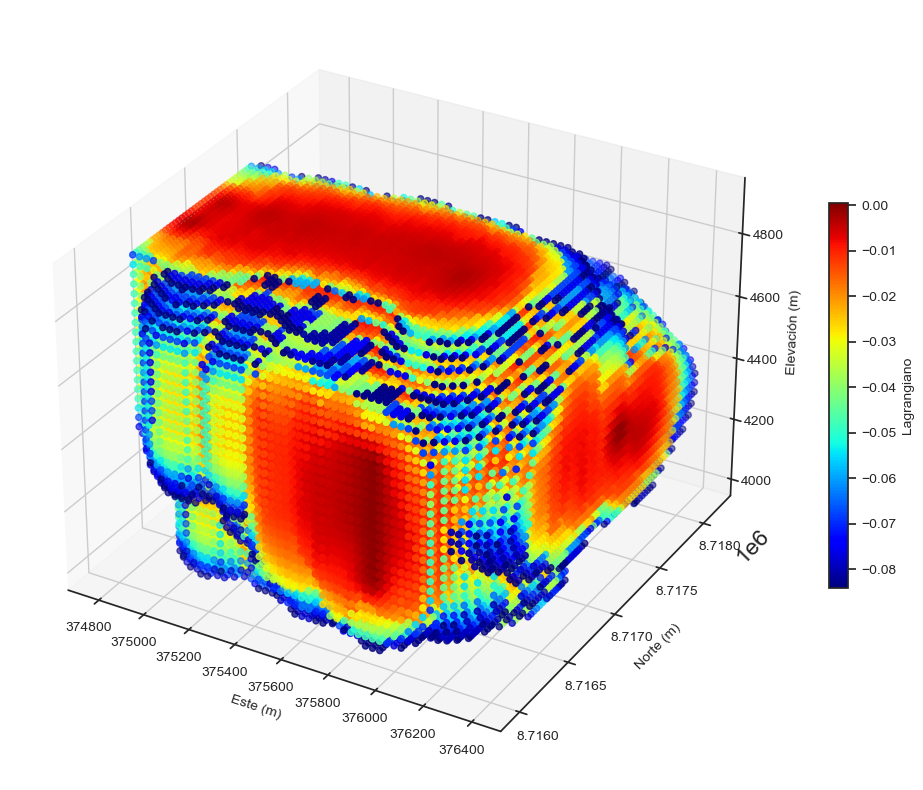

In [19]:
# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'  # Cambiar a sans-serif
rcParams['font.size'] = 10             # Tamaño de fuente más pequeño
# Extraer las columnas X, Y, Z y OK para graficar
X = df['X']
Y = df['Y']
Z = df['Z']
LG = df['OK_Lagrangian']

# Crear la figura 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crear una dispersión 3D
sc = ax.scatter(X, Y, Z, c=LG, cmap='jet', marker='o')

# Añadir la barra de color
cbar = fig.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label('Lagrangiano', fontsize=10)
cbar.ax.tick_params(labelsize=10)       # Tamaño más pequeño para los números de la barra de color
# Etiquetas
ax.set_xlabel('Este (m)', fontsize=10)  # Etiqueta con fuente sans-serif y tamaño ajustado
ax.set_ylabel('Norte (m)', fontsize=10)
ax.set_zlabel('Elevación (m)', fontsize=10)
# Tamaño más pequeño para los números de los ejes
ax.tick_params(axis='x', labelsize=10)  # Reducir tamaño de las marcas en el eje X
ax.tick_params(axis='y', labelsize=10)  # Reducir tamaño de las marcas en el eje Y
ax.tick_params(axis='z', labelsize=10)  # Reducir tamaño de las marcas en el eje Z

# Mostrar gráfico con un diseño ajustado
plt.tight_layout()
#plt.savefig('Image/3d modelo lagrangiano.jpg', dpi=600)
# Mostrar la gráfica
plt.show()

##### Distancia promedio

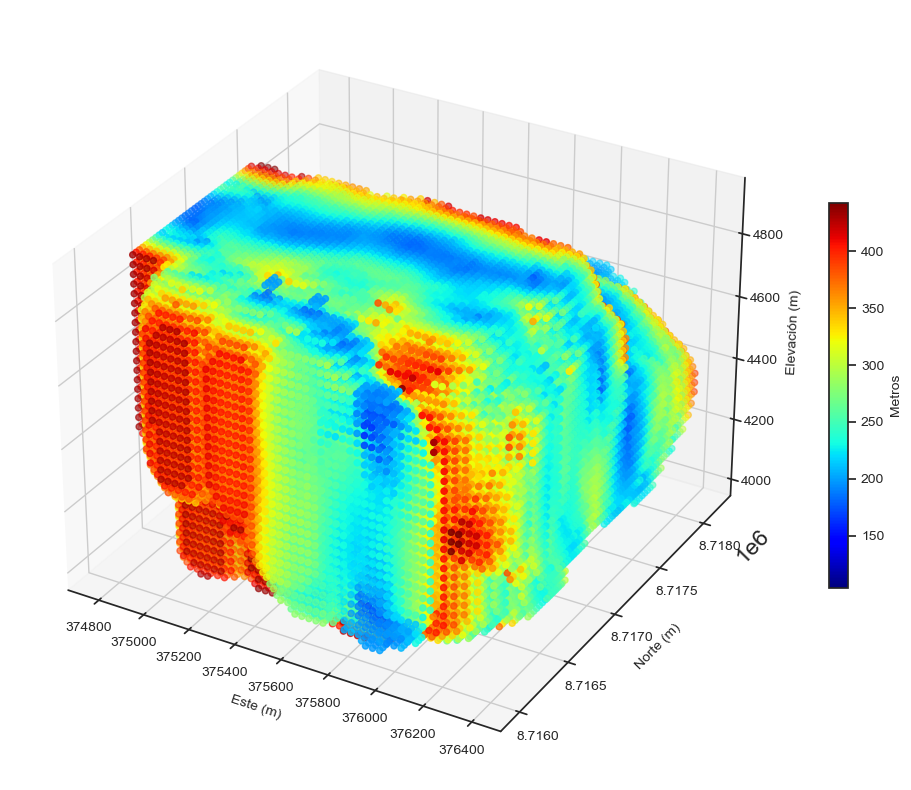

In [20]:
# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'  # Cambiar a sans-serif
rcParams['font.size'] = 10             # Tamaño de fuente más pequeño
# Extraer las columnas X, Y, Z y OK para graficar
X = df['X']
Y = df['Y']
Z = df['Z']
AS = df['OK_average_sample_distance']

# Crear la figura 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crear una dispersión 3D
sc = ax.scatter(X, Y, Z, c=AS, cmap='jet', marker='o')

# Añadir la barra de color
cbar = fig.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label('Metros', fontsize=10)
cbar.ax.tick_params(labelsize=10)       # Tamaño más pequeño para los números de la barra de color
# Etiquetas
ax.set_xlabel('Este (m)', fontsize=10)  # Etiqueta con fuente sans-serif y tamaño ajustado
ax.set_ylabel('Norte (m)', fontsize=10)
ax.set_zlabel('Elevación (m)', fontsize=10)
# Tamaño más pequeño para los números de los ejes
ax.tick_params(axis='x', labelsize=10)  # Reducir tamaño de las marcas en el eje X
ax.tick_params(axis='y', labelsize=10)  # Reducir tamaño de las marcas en el eje Y
ax.tick_params(axis='z', labelsize=10)  # Reducir tamaño de las marcas en el eje Z

# Mostrar gráfico con un diseño ajustado
plt.tight_layout()
#plt.savefig('Image/3d modelo distances.jpg', dpi=600)
# Mostrar la gráfica
plt.show()

##### Varianza de Kriging

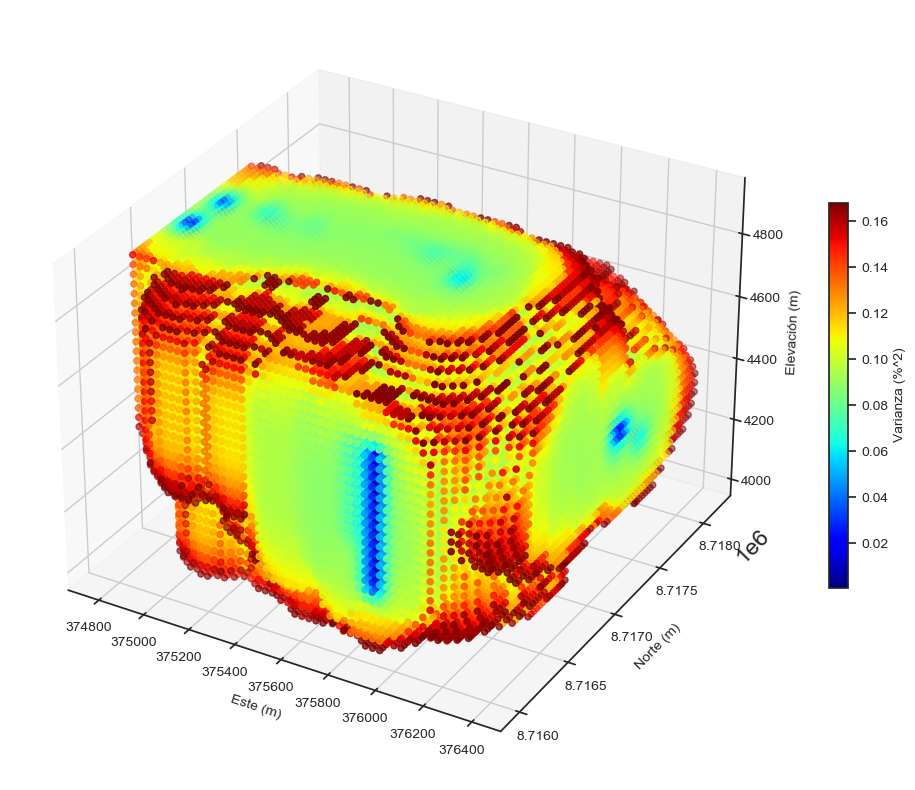

In [21]:
# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'  # Cambiar a sans-serif
rcParams['font.size'] = 10             # Tamaño de fuente más pequeño
# Extraer las columnas X, Y, Z y OK para graficar
X = df['X']
Y = df['Y']
Z = df['Z']
VK = df['OK_krig_var']

# Crear la figura 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crear una dispersión 3D
sc = ax.scatter(X, Y, Z, c=VK, cmap='jet', marker='o')

# Añadir la barra de color
cbar = fig.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label('Varianza (%^2)', fontsize=10)
cbar.ax.tick_params(labelsize=10)       # Tamaño más pequeño para los números de la barra de color
# Etiquetas
ax.set_xlabel('Este (m)', fontsize=10)  # Etiqueta con fuente sans-serif y tamaño ajustado
ax.set_ylabel('Norte (m)', fontsize=10)
ax.set_zlabel('Elevación (m)', fontsize=10)
# Tamaño más pequeño para los números de los ejes
ax.tick_params(axis='x', labelsize=10)  # Reducir tamaño de las marcas en el eje X
ax.tick_params(axis='y', labelsize=10)  # Reducir tamaño de las marcas en el eje Y
ax.tick_params(axis='z', labelsize=10)  # Reducir tamaño de las marcas en el eje Z
# Mostrar gráfico con un diseño ajustado
plt.tight_layout()
#plt.savefig('Image/3d modelo variance.jpg', dpi=600)
# Mostrar la gráfica
plt.show()

##### Número de muestras

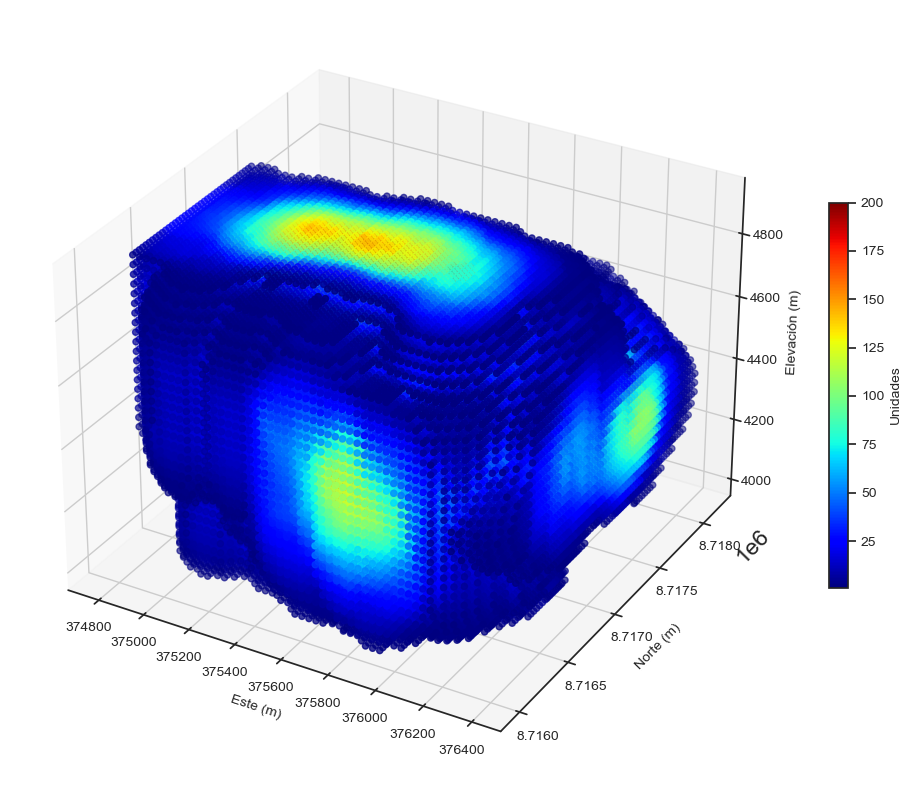

In [22]:
# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'  # Cambiar a sans-serif
rcParams['font.size'] = 10             # Tamaño de fuente más pequeño
# Extraer las columnas X, Y, Z y OK para graficar
X = df['X']
Y = df['Y']
Z = df['Z']
NS = df['OK_n_samples']

# Crear la figura 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crear una dispersión 3D
sc = ax.scatter(X, Y, Z, c=NS, cmap='jet', marker='o')

# Añadir la barra de color
cbar = fig.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label('Unidades', fontsize=10)
cbar.ax.tick_params(labelsize=10)       # Tamaño más pequeño para los números de la barra de color
# Etiquetas
ax.set_xlabel('Este (m)', fontsize=10)  # Etiqueta con fuente sans-serif y tamaño ajustado
ax.set_ylabel('Norte (m)', fontsize=10)
ax.set_zlabel('Elevación (m)', fontsize=10)
# Tamaño más pequeño para los números de los ejes
ax.tick_params(axis='x', labelsize=10)  # Reducir tamaño de las marcas en el eje X
ax.tick_params(axis='y', labelsize=10)  # Reducir tamaño de las marcas en el eje Y
ax.tick_params(axis='z', labelsize=10)  # Reducir tamaño de las marcas en el eje Z

# Mostrar gráfico con un diseño ajustado
plt.tight_layout()
#plt.savefig('Image/3d modelo samples.jpg', dpi=600)
# Mostrar la gráfica
plt.show()

##### Confianza geológica

In [23]:
# Crear la columna 'calidad_code' basada en 'OK_krig_var'
df['calidad_code'] = df['OK_krig_var'].apply(lambda x: 1 if x < 0.04 else 0)

# Calcular la columna 'cov' basada en 'OK_krig_var' y 'OK'
df["cov"] = np.sqrt(df["OK_krig_var"]) / df["OK"]

# Mostrar las primeras filas del DataFrame resultante
print(df.head())

     OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
37 0.05          -0.08                      199.18         0.17          1.00   
38 0.05          -0.08                      197.46         0.17          1.00   
39 0.05          -0.08                      200.27         0.17          1.00   
91 0.05          -0.08                      202.67         0.17          1.00   
92 0.05          -0.08                      196.45         0.17          1.00   

           X          Y       Z  calidad_code  cov  
37 375890.00 8715970.00 4010.00             0 7.88  
38 375920.00 8715970.00 4010.00             0 7.88  
39 375950.00 8715970.00 4010.00             0 7.88  
91 375860.00 8716000.00 4010.00             0 7.88  
92 375890.00 8716000.00 4010.00             0 7.88  


In [24]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


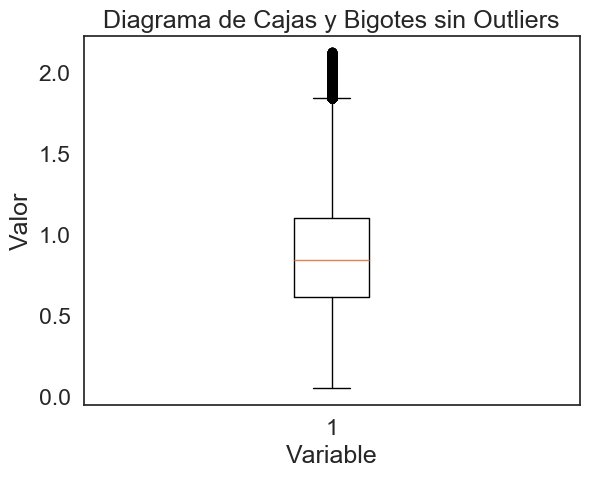

In [25]:
import matplotlib.pyplot as plt

# Supongamos que df es tu DataFrame y "cov" es la columna que deseas visualizar
data = df["cov"]

# Calcular los cuantiles
q1 = data.quantile(0.25)
q3 = data.quantile(0.75)

# Calcular el rango intercuartílico (IQR)
iqr = q3 - q1

# Definir los límites para identificar outliers
lower_limit = q1 - 1.5 * iqr
upper_limit = q3 + 1.5 * iqr

# Filtrar los datos para excluir outliers
filtered_data = data[(data >= lower_limit) & (data <= upper_limit)]

# Crear un diagrama de cajas y bigotes sin outliers
plt.boxplot(filtered_data)

# Configuración de etiquetas y título
plt.xlabel("Variable")
plt.ylabel("Valor")
plt.title("Diagrama de Cajas y Bigotes sin Outliers")

# Mostrar el gráfico
plt.show()

In [26]:
valores_unicos_Z = df["Z"].unique()
print(valores_unicos_Z)

[4010. 4040. 4070. 4100. 4130. 4160. 4190. 4220. 4250. 4280. 4310. 4340.
 4370. 4400. 4430. 4460. 4490. 4520. 4550. 4580. 4610. 4640. 4670. 4700.
 4730. 4760. 4790. 4820. 4850. 4880. 4910.]


In [27]:
valores_unicos_Y = df["Y"].unique()
print(valores_unicos_Y)

[8715970. 8716000. 8716030. 8716060. 8716090. 8716120. 8716150. 8716180.
 8716210. 8716240. 8716270. 8716300. 8716330. 8716360. 8716390. 8716420.
 8716450. 8716480. 8716510. 8716540. 8716570. 8716600. 8716630. 8716660.
 8716690. 8716720. 8716750. 8716780. 8716810. 8716840. 8716870. 8716900.
 8716930. 8716960. 8716990. 8717020. 8717050. 8717080. 8717110. 8717140.
 8717170. 8717200. 8717230. 8717260. 8717290. 8717320. 8717350. 8717380.
 8717410. 8717440. 8717470. 8717500. 8717530. 8717560. 8717590. 8717620.
 8717650. 8717680. 8717710. 8717740. 8717770. 8717800. 8717830. 8717860.
 8717890. 8717920. 8717950. 8717980. 8718010. 8718040. 8718070. 8718100.
 8718130. 8718160.]


In [28]:
corte = 8716540

df_nueva = df[df['Y'] == corte] 
df_nueva.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov
1049,0.44,-0.08,241.48,0.16,2.00,374900.00,8716540.00,4010.00,0,0.91
1050,0.40,-0.06,218.79,0.15,4.00,374930.00,8716540.00,4010.00,0,0.97
1051,0.41,-0.05,199.52,0.13,6.00,374960.00,8716540.00,4010.00,0,0.90
1052,0.39,-0.04,179.24,0.13,7.00,374990.00,8716540.00,4010.00,0,0.93
1053,0.47,-0.04,162.08,0.12,8.00,375020.00,8716540.00,4010.00,0,0.75


In [29]:
import pandas as pd
import numpy as np
from scipy.spatial import cKDTree

# Definir la función para actualizar la calidad en 3D con KDTree de manera más optimizada
def actualizar_calidad_3d_kdtree_numpy(df):
    df_actualizado = df.copy()
    h = 20  # Tamaño de los bloques
    coords = df[['X', 'Y', 'Z']].values
    kdtree = cKDTree(coords)  # Usar cKDTree que es más rápido

    # Buscar todos los vecinos en una sola llamada
    vecinos_indices = kdtree.query_ball_tree(kdtree, h * np.sqrt(3))

    # Convertir calidad_code a un array de numpy para operaciones rápidas
    calidad_codes = df['calidad_code'].values
    nuevas_categorias = calidad_codes.copy()

    # Recorrer usando numpy para realizar las actualizaciones
    for index, indices_circundantes in enumerate(vecinos_indices):
        indices_circundantes = np.array(indices_circundantes)  # Convertir a numpy array
        indices_circundantes = indices_circundantes[indices_circundantes != index]  # Excluir el índice actual
        
        if indices_circundantes.size > 0:
            # Calcular el porcentaje de otras categorías alrededor
            porcentaje_otras_categorias = np.mean(calidad_codes[indices_circundantes] != calidad_codes[index])
            if porcentaje_otras_categorias > 0.51:
                # Encontrar la nueva categoría usando numpy
                valores, conteos = np.unique(calidad_codes[indices_circundantes], return_counts=True)
                nueva_categoria = valores[np.argmax(conteos)]
                nuevas_categorias[index] = nueva_categoria

    # Actualizar las categorías en el DataFrame
    df_actualizado['calidad_code'] = nuevas_categorias
    return df_actualizado

# Actualizar el DataFrame varias veces
df_calidad = actualizar_calidad_3d_kdtree_numpy(df)
df_calidad2 = actualizar_calidad_3d_kdtree_numpy(df_calidad)
df_calidad3 = actualizar_calidad_3d_kdtree_numpy(df_calidad2)

# Asignar el valor final de calidad al DataFrame original
df["confianza"] = df_calidad3["calidad_code"]
df['confianza_geo'] = df['confianza'].map({0: 'baja', 1: 'alta'})

# Mostrar las primeras filas del DataFrame resultante
print(df.head())

     OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
37 0.05          -0.08                      199.18         0.17          1.00   
38 0.05          -0.08                      197.46         0.17          1.00   
39 0.05          -0.08                      200.27         0.17          1.00   
91 0.05          -0.08                      202.67         0.17          1.00   
92 0.05          -0.08                      196.45         0.17          1.00   

           X          Y       Z  calidad_code  cov  confianza confianza_geo  
37 375890.00 8715970.00 4010.00             0 7.88          0          baja  
38 375920.00 8715970.00 4010.00             0 7.88          0          baja  
39 375950.00 8715970.00 4010.00             0 7.88          0          baja  
91 375860.00 8716000.00 4010.00             0 7.88          0          baja  
92 375890.00 8716000.00 4010.00             0 7.88          0          baja  


In [30]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


In [31]:
import pandas as pd

# Configurar pandas para mostrar los números con dos decimales
pd.set_option('display.float_format', '{:.2f}'.format)

# Excluir la columna 'confianza_geo' antes de calcular las estadísticas
df_filtered = df.drop(columns=["confianza_geo"])

# Calcular estadísticas descriptivas
stats_summary = df_filtered.describe().T

# Calcular métricas adicionales
stats_summary["variance"] = df_filtered.var()  # Varianza
stats_summary["std_dev"] = df_filtered.std()  # Desviación estándar
stats_summary["skewness"] = df_filtered.skew()  # Asimetría
stats_summary["kurtosis"] = df_filtered.kurtosis()  # Curtosis

# Mostrar el resultado
print(stats_summary)


                               count       mean    std        min        25%  \
OK                         101048.00       0.33   0.16       0.00       0.23   
OK_Lagrangian              101048.00      -0.01   0.02      -0.08      -0.01   
OK_average_sample_distance 101048.00     234.48  57.05     104.39     197.24   
OK_krig_var                101048.00       0.08   0.03       0.00       0.05   
OK_n_samples               101048.00     111.84  77.42       1.00      34.00   
X                          101048.00  375610.77 437.86  374780.00  375260.00   
Y                          101048.00 8716993.07 577.79 8715970.00 8716510.00   
Z                          101048.00    4441.52 249.08    4010.00    4250.00   
calidad_code               101048.00       0.19   0.39       0.00       0.00   
cov                        101048.00       1.34   5.55       0.05       0.64   
confianza                  101048.00       0.19   0.39       0.00       0.00   

                                  50%  

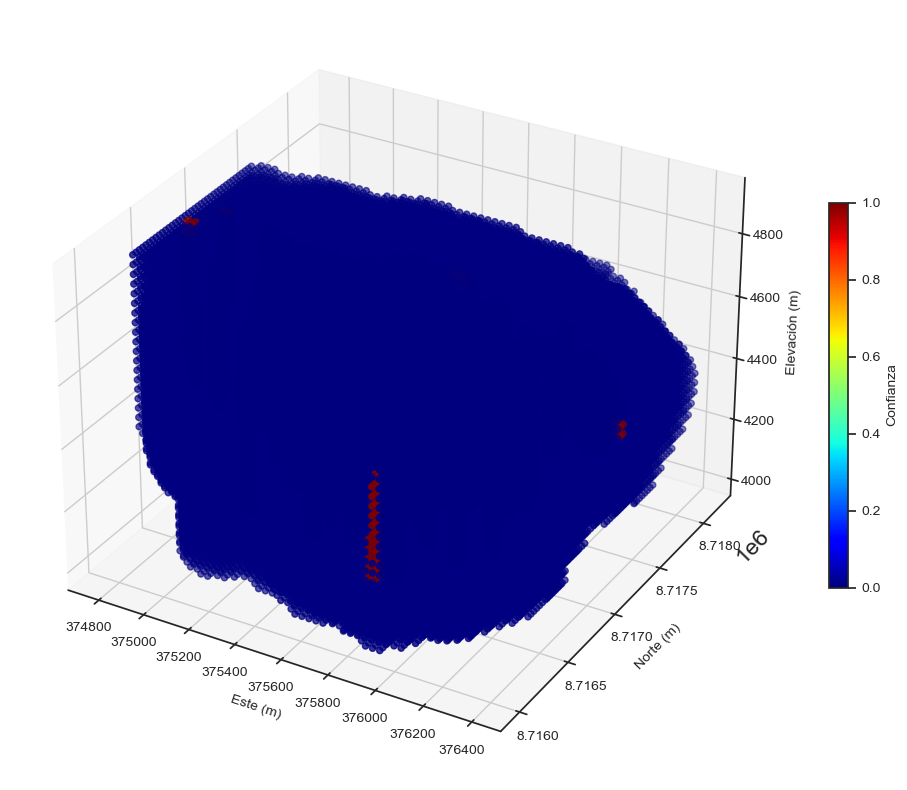

In [32]:
# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'  # Cambiar a sans-serif
rcParams['font.size'] = 10             # Tamaño de fuente más pequeño
# Extraer las columnas X, Y, Z y OK para graficar
X = df['X']
Y = df['Y']
Z = df['Z']
C = df['confianza']

# Crear la figura 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Crear una dispersión 3D
sc = ax.scatter(X, Y, Z, c=C, cmap='jet', marker='o')

# Añadir la barra de color
cbar = fig.colorbar(sc, ax=ax, shrink=0.5)
cbar.set_label('Confianza', fontsize=10)
cbar.ax.tick_params(labelsize=10)       # Tamaño más pequeño para los números de la barra de color
# Etiquetas
ax.set_xlabel('Este (m)', fontsize=10)  # Etiqueta con fuente sans-serif y tamaño ajustado
ax.set_ylabel('Norte (m)', fontsize=10)
ax.set_zlabel('Elevación (m)', fontsize=10)
# Tamaño más pequeño para los números de los ejes
ax.tick_params(axis='x', labelsize=10)  # Reducir tamaño de las marcas en el eje X
ax.tick_params(axis='y', labelsize=10)  # Reducir tamaño de las marcas en el eje Y
ax.tick_params(axis='z', labelsize=10)  # Reducir tamaño de las marcas en el eje Z

# Mostrar gráfico con un diseño ajustado
plt.tight_layout()
#plt.savefig('Image/3d modelo confidence.jpg', dpi=600)
# Mostrar la gráfica
plt.show()

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [34]:
# Crear una copia del dataframe original
df00 = df.copy()


In [35]:
# Extraer la varianza del kriging ordinario
kriging_var = df00["OK_krig_var"]

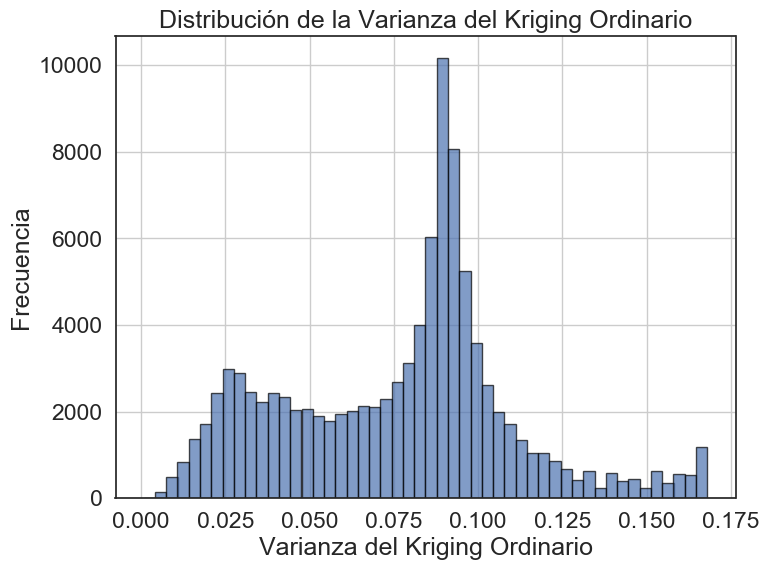

In [36]:
# Graficar la distribución de la varianza para identificar umbrales
plt.figure(figsize=(8,6))
plt.hist(kriging_var, bins=50, edgecolor='black', alpha=0.7)
plt.xlabel("Varianza del Kriging Ordinario")
plt.ylabel("Frecuencia")
plt.title("Distribución de la Varianza del Kriging Ordinario")
plt.grid(True)
plt.show()


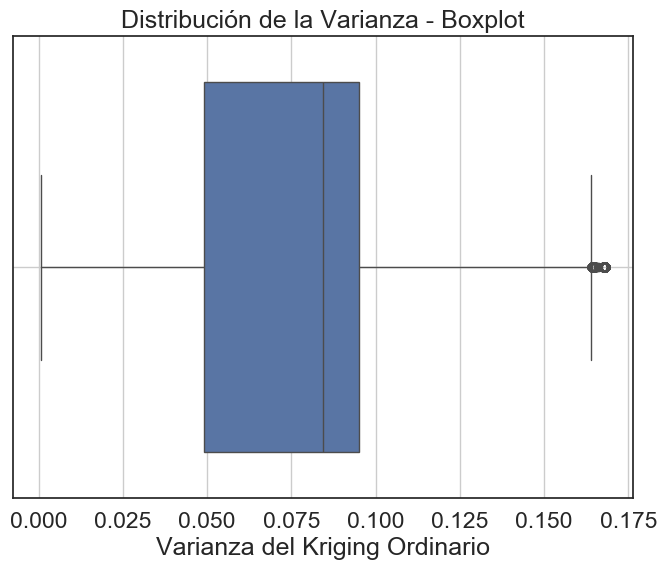

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
sns.boxplot(x=df["OK_krig_var"])
plt.xlabel("Varianza del Kriging Ordinario")
plt.title("Distribución de la Varianza - Boxplot")
plt.grid(True)
plt.show()


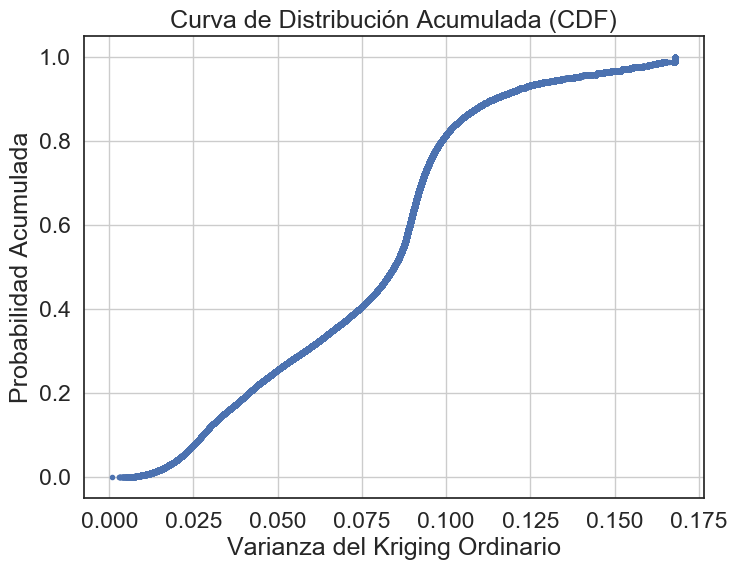

In [38]:
import numpy as np

plt.figure(figsize=(8,6))
sorted_var = np.sort(df["OK_krig_var"])
cdf = np.arange(len(sorted_var)) / float(len(sorted_var))

plt.plot(sorted_var, cdf, marker='.', linestyle='none')
plt.xlabel("Varianza del Kriging Ordinario")
plt.ylabel("Probabilidad Acumulada")
plt.title("Curva de Distribución Acumulada (CDF)")
plt.grid(True)
plt.show()


In [39]:
# Definir umbrales basados en la distribución (ajustar según el análisis de la curva)
umbral_medido = np.percentile(kriging_var, 10)  # Cuartil inferior
umbral_indicado = np.percentile(kriging_var, 30)  # Mediana
umbral_inferido = np.percentile(kriging_var, 65)  # Cuartil superior

# Aplicar la categorización
cat_ko = np.where(kriging_var > umbral_inferido, 0,  # Inferido
                  np.where(kriging_var > umbral_indicado, 2,  # Indicado
                           1))  # Medido

df00["Categoria"] = cat_ko

# Mostrar las primeras filas del dataframe categorizado
df00.head()


,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0


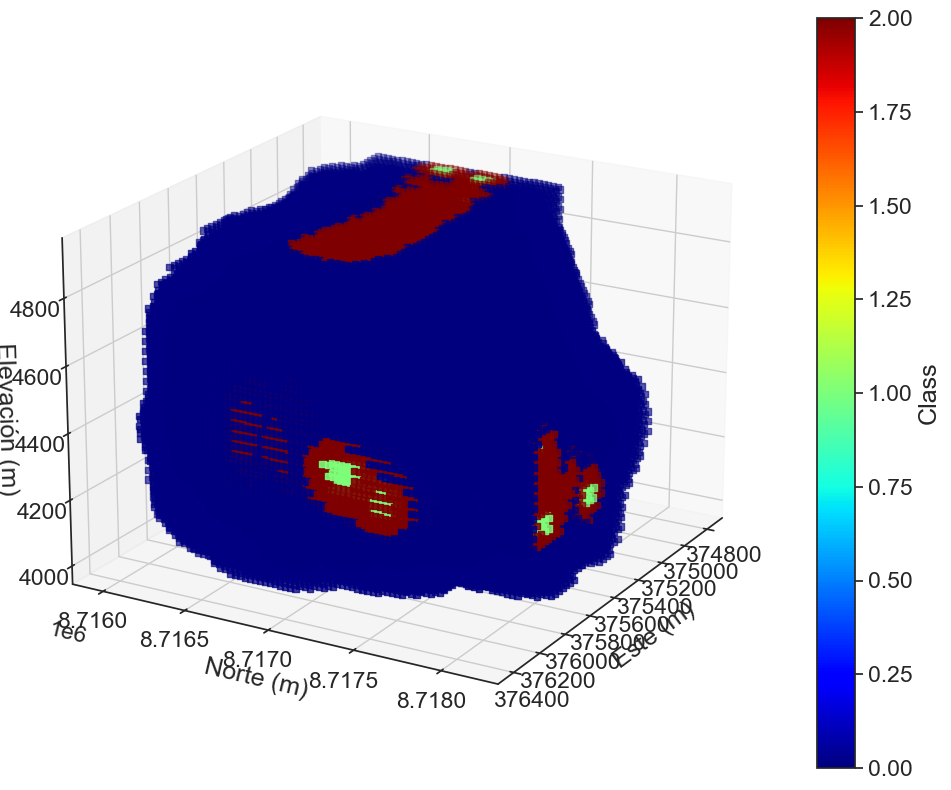

In [40]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df00['X'], df00['Y'], df00['Z'], c=df00['Categoria'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoria.jpg", dpi=600)

plt.show()

In [41]:
bd=pd.read_csv('sondajesA.csv')

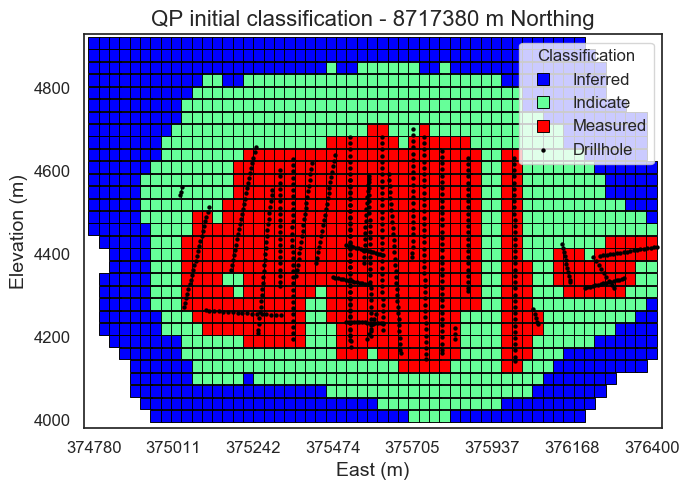

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicate"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df00['Categoria_label'] = df00['Categoria'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df00_corte_y = df00[df00['Y'] == corte_y]

# Verificar si hay datos para el corte
if df00_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 70  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df00_corte_y["X"], 
        y=df00_corte_y["Z"], 
        hue=df00_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

    # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'QP initial classification - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("QP_Inicial.jpg", dpi=800)
    plt.show()


In [44]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df00["Categoria"].value_counts()

# Mostrar los resultados
print(categoria_counts)


Categoria
0    35367
2    35366
1    30315
Name: count, dtype: int64


### XGBOOST QP

In [45]:
df01=df00.copy()

In [46]:
df01.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


In [47]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Configuración de datos
X = df01[['X', 'Y', 'Z']]  # Variables independientes
y = df01['Categoria']      # Variable dependiente (Categoría)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos con StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Configuración del modelo XGBoost
xgb_model = XGBClassifier(
    objective='multi:softmax',    # Clasificación multicategoría
    num_class=3,                 # Tres categorías: Medido, Indicado, Inferido
    random_state=42,             # Semilla aleatoria para reproducibilidad
    use_label_encoder=False,     # No usar codificador de etiquetas obsoleto
    eval_metric='mlogloss',      # Métrica de pérdida logarítmica multicategoría
    max_depth=20,                 # Mayor profundidad para capturar patrones
    learning_rate=0.1,          # Tasa de aprendizaje ajustada
    n_estimators=200,            # Número de árboles para mejorar el ajuste
    min_child_weight=5,          # Permitir más divisiones en nodos
    subsample=0.7,               # Submuestreo para cada árbol
    colsample_bytree=0.7,        # Submuestreo de características por árbol
    gamma=10                   # Regularización para evitar sobreajuste
)
# Entrenar el modelo con los datos de entrenamiento
xgb_model.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred_test = xgb_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"Exactitud en el conjunto de prueba: {test_accuracy:.2f}")

# Predicciones suavizadas en el conjunto original
X_original = df01[['X', 'Y', 'Z']]
X_original = scaler.transform(X_original)  # Normalizar el conjunto original
df01['Categoria_suavizada'] = xgb_model.predict(X_original)

# Mostrar las primeras filas del DataFrame con predicciones suavizadas
print(df01.head())

Exactitud en el conjunto de prueba: 0.88
     OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
37 0.05          -0.08                      199.18         0.17          1.00   
38 0.05          -0.08                      197.46         0.17          1.00   
39 0.05          -0.08                      200.27         0.17          1.00   
91 0.05          -0.08                      202.67         0.17          1.00   
92 0.05          -0.08                      196.45         0.17          1.00   

           X          Y       Z  calidad_code  cov  confianza confianza_geo  \
37 375890.00 8715970.00 4010.00             0 7.88          0          baja   
38 375920.00 8715970.00 4010.00             0 7.88          0          baja   
39 375950.00 8715970.00 4010.00             0 7.88          0          baja   
91 375860.00 8716000.00 4010.00             0 7.88          0          baja   
92 375890.00 8716000.00 4010.00             0 7.88          0          baja  

In [48]:
df01.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


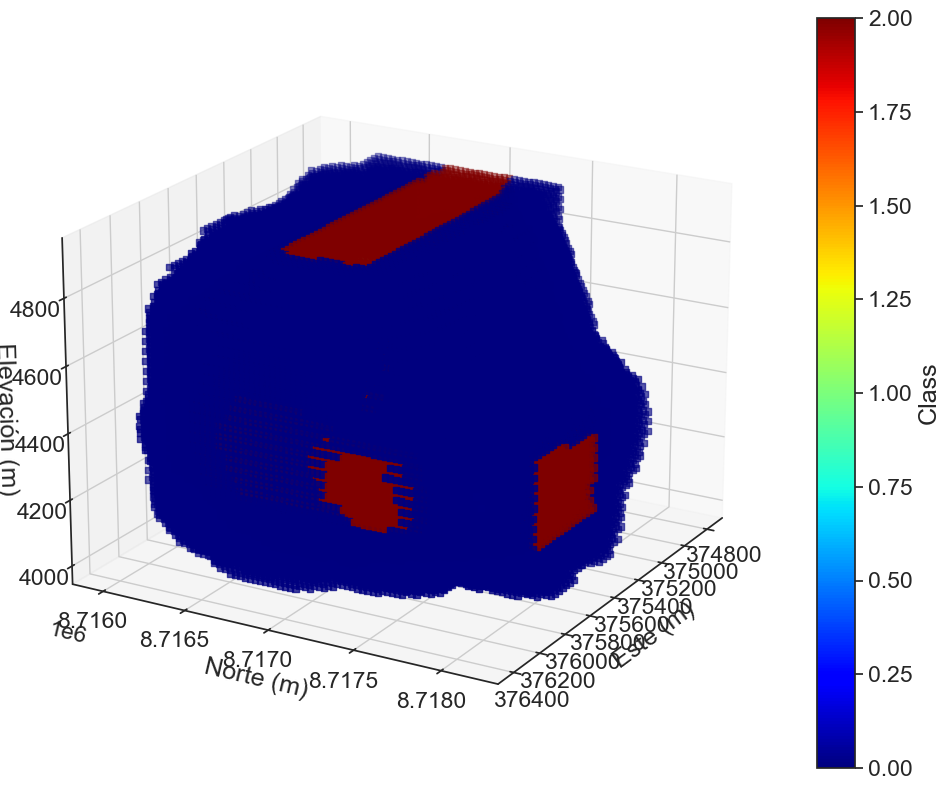

In [49]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df01['X'], df01['Y'], df01['Z'], c=df01['Categoria_suavizada'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoriaS_AMM.jpg", dpi=600)

plt.show()

In [50]:
bd=pd.read_csv('sondajesA.csv')

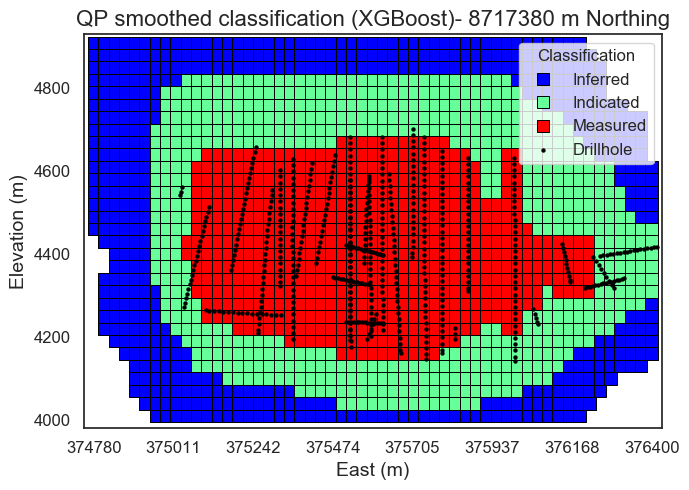

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicated"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df01['Categoria_label'] = df01['Categoria_suavizada'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df01_corte_y = df01[df01['Y'] == corte_y]

# Verificar si hay datos para el corte
if df01_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 80  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df01_corte_y["X"], 
        y=df01_corte_y["Z"], 
        hue=df01_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

   # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'QP smoothed classification (XGBoost)- {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("QP_XGboost suavizado.jpg", dpi=800)
    plt.show()


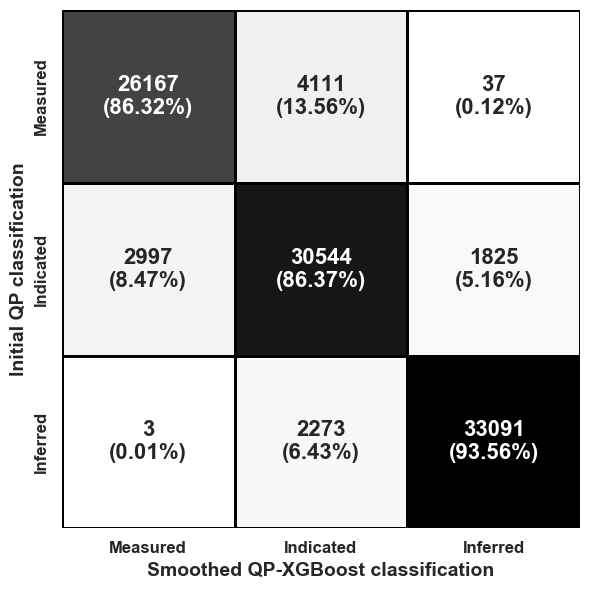

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df01["Categoria"], df01["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-XGBoost classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial QP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("QP_XGboost suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()


In [53]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df01["Categoria_suavizada"].value_counts()

# Mostrar los resultados
print(categoria_counts)


Categoria_suavizada
2    36928
0    34953
1    29167
Name: count, dtype: int64


In [54]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Tomar una muestra de 10,000 registros de df01 para optimizar tiempo de cómputo
df_sample = df01.iloc[:10000]

# Asegurar que la columna 'Categoria' y 'Categoria_suavizada' no tengan valores nulos
df_sample = df_sample[df_sample["Categoria"].notnull() & df_sample["Categoria_suavizada"].notnull()]

# Normalizar las coordenadas espaciales
scaler = StandardScaler()
X_sample_scaled = scaler.fit_transform(df_sample[["X", "Y", "Z"]])

# Aplicar PCA para reducir dimensiones a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sample_scaled)

# Calcular el Silhouette Score antes del suavizado
silhouette_before = silhouette_score(X_pca, df_sample["Categoria"])

# Calcular el Silhouette Score después del suavizado
silhouette_after = silhouette_score(X_pca, df_sample["Categoria_suavizada"])

# Crear una tabla de comparación
silhouette_comparison = pd.DataFrame({
    "Método": ["Antes del Suavizado", "Después del Suavizado"],
    "Silhouette Score": [silhouette_before, silhouette_after]
})

# Mostrar la tabla
print(silhouette_comparison)


                  Método  Silhouette Score
0    Antes del Suavizado             -0.08
1  Después del Suavizado              0.03


In [55]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluar el modelo en el conjunto de prueba
y_pred = xgb_model.predict(X_test)

# Calcular la precisión
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba: {accuracy:.2f}")

# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=["Inferidos", "Medidos", "Indicados"]))

# Matriz de confusión
print("Matriz de confusión:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

Precisión en el conjunto de prueba: 0.88
Reporte de clasificación:
              precision    recall  f1-score   support

   Inferidos       0.94      0.93      0.93      7059
     Medidos       0.89      0.86      0.88      6114
   Indicados       0.82      0.85      0.83      7037

    accuracy                           0.88     20210
   macro avg       0.88      0.88      0.88     20210
weighted avg       0.88      0.88      0.88     20210

Matriz de confusión:
[[6556    1  502]
 [   7 5252  855]
 [ 424  616 5997]]


In [56]:
df01.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,0.19,1.34,0.19,1.00,1.02
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.39,5.55,0.39,0.84,0.84
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.05,0.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.64,0.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,0.00,0.88,0.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,0.00,1.23,0.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,1.00,950.16,1.00,2.00,2.00


In [57]:
df01[df01["Categoria_suavizada"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,29167.00,0.41,0.21,0.00,0.27,0.39,0.52,2.03
OK_Lagrangian,29167.00,-0.00,0.00,-0.01,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,29167.00,177.84,30.77,116.75,154.24,176.63,199.91,279.30
OK_krig_var,29167.00,0.04,0.02,0.00,0.03,0.03,0.05,0.09
OK_n_samples,29167.00,195.82,19.10,25.00,200.00,200.00,200.00,200.00
X,29167.00,375617.57,320.13,374810.00,375380.00,375620.00,375860.00,376280.00
Y,29167.00,8716980.34,371.91,8715970.00,8716690.00,8716960.00,8717230.00,8718010.00
Z,29167.00,4470.55,167.71,4160.00,4340.00,4460.00,4610.00,4850.00
calidad_code,29167.00,0.62,0.49,0.00,0.00,1.00,1.00,1.00
cov,29167.00,0.91,6.99,0.05,0.33,0.49,0.72,663.62


In [58]:
df01[df01["Categoria_suavizada"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,36928.00,0.31,0.12,0.00,0.24,0.31,0.38,1.14
OK_Lagrangian,36928.00,-0.00,0.00,-0.02,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,36928.00,238.52,29.38,135.80,217.42,235.46,257.95,358.27
OK_krig_var,36928.00,0.08,0.02,0.00,0.07,0.08,0.09,0.11
OK_n_samples,36928.00,127.51,52.78,14.00,83.00,124.00,180.00,200.00
X,36928.00,375619.16,428.80,374780.00,375260.00,375650.00,375980.00,376400.00
Y,36928.00,8716993.95,572.37,8715970.00,8716480.00,8716960.00,8717470.00,8718160.00
Z,36928.00,4441.33,251.08,4040.00,4220.00,4430.00,4640.00,4910.00
calidad_code,36928.00,0.04,0.19,0.00,0.00,0.00,0.00,1.00
cov,36928.00,1.23,2.43,0.07,0.74,0.90,1.17,314.19


In [59]:
df01[df01["Categoria_suavizada"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,34953.00,0.29,0.12,0.00,0.21,0.29,0.37,1.06
OK_Lagrangian,34953.00,-0.03,0.02,-0.08,-0.03,-0.02,-0.01,-0.00
OK_average_sample_distance,34953.00,277.47,56.25,104.39,234.70,271.21,315.44,442.94
OK_krig_var,34953.00,0.11,0.02,0.02,0.09,0.10,0.12,0.17
OK_n_samples,34953.00,25.21,20.81,1.00,8.00,20.00,37.00,122.00
X,34953.00,375596.24,523.61,374780.00,375110.00,375530.00,376130.00,376400.00
Y,34953.00,8717002.77,709.48,8715970.00,8716300.00,8717020.00,8717650.00,8718160.00
Z,34953.00,4417.49,296.67,4010.00,4130.00,4400.00,4700.00,4910.00
calidad_code,34953.00,0.00,0.02,0.00,0.00,0.00,0.00,1.00
cov,34953.00,1.83,6.46,0.38,0.88,1.12,1.56,950.16


### Calcular tonelaje para cada bloque: 30x30x30= 27 000 m3
#27 000 m3 * 2.3 =62 100 t por cada bloque
### en medidos (1): 29167 bloques *62 100 t = 1811270700; ley=0.41
### en indicados (2): 36928 bloques * 62 100 t= 2293228800; ley=0.31
### en inferidos (0): 34953 bloques* 62 100 t=2170581300; ley=0.29

In [60]:
metal_medido = 1811270700 * (0.41/100) * 0.9
metal_indicado = 2293228800 * (0.31/100) * 0.9
metal_inferido = 2170581300 * (0.29/100) * 0.9

In [61]:
metal_medido

6683588.882999999

In [62]:
metal_indicado

6398108.352

In [63]:
metal_inferido

5665217.193

In [64]:
print(df01['Categoria'].unique())

[0 2 1]


In [65]:
df_0 = df01[df01['Categoria_suavizada']==1]
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
22574,0.35,-0.00,219.30,0.05,200.00,375500.00,8717170.00,4160.00,0,0.66,0,baja,1,Measured,1
22575,0.23,-0.00,214.30,0.02,200.00,375530.00,8717170.00,4160.00,1,0.59,1,alta,1,Measured,1
22576,0.23,-0.00,209.00,0.03,200.00,375560.00,8717170.00,4160.00,1,0.72,1,alta,1,Measured,1
22577,0.30,-0.00,208.97,0.05,200.00,375590.00,8717170.00,4160.00,0,0.75,0,baja,1,Measured,1
22578,0.39,-0.00,206.36,0.07,200.00,375620.00,8717170.00,4160.00,0,0.66,0,baja,2,Measured,1


In [66]:
# Contar la cantidad de filas por cada valor único en 'Categoria_s_original'
conteo_por_categoria = df01.groupby('Categoria_suavizada').size()

# Mostrar el resultado
print(conteo_por_categoria)

Categoria_suavizada
0    34953
1    29167
2    36928
dtype: int64


In [67]:
# Calcular el promedio de la variable 'ko' por cada valor único en 'Categoria_s_original'
promedio_por_categoria = df01.groupby('Categoria_suavizada')['OK'].mean()

# Mostrar el resultado
print(promedio_por_categoria)

Categoria_suavizada
0   0.29
1   0.41
2   0.31
Name: OK, dtype: float64


In [68]:
# Crear una nueva columna 'Categoria_n' basada en la columna 'Categoria'
df01['Categoria_n'] = df01['Categoria'].replace({'Inferido': 0, 'Medido': 1, 'Indicado': 2})

# Mostrar las primeras filas para verificar el resultado
df01[['Categoria', 'Categoria_n']].head()


,Categoria,Categoria_n
37,0,0
38,0,0
39,0,0
91,0,0
92,0,0


In [69]:
# Crear tres nuevos DataFrames según los valores de Categoria_s_original
df_medido = df01[df01['Categoria_n'] == 1].copy()
df_inferido = df01[df01['Categoria_n'] == 0].copy()
df_indicado = df01[df01['Categoria_n'] == 2].copy()

In [70]:
df_medido2 = df01[df01['Categoria_suavizada'] == 1].copy()
df_inferido2 = df01[df01['Categoria_suavizada'] == 0].copy()
df_indicado2 = df01[df01['Categoria_suavizada'] == 2].copy()

In [71]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos11 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos11.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido[df_medido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos11.loc[index, 'Tonelaje'] = tonnage
    intervalos11.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos11['Tonelaje'] = (intervalos11['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos11)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1771961.40    0.42
1           0.20 1584419.40    0.46
2           0.30 1256531.40    0.51
3           0.40  852819.30    0.59
4           0.50  518038.20    0.68
5           0.60  295099.20    0.77
6           0.70  171954.90    0.87
7           0.80  100229.40    0.95
8           0.90   55393.20    1.04
9           1.00   29311.20    1.12


In [72]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos00 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos00.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido[df_inferido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos00.loc[index, 'Tonelaje'] = tonnage
    intervalos00.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos00['Tonelaje'] = (intervalos00['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos00)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2053771.20    0.31
1           0.20 1730913.30    0.33
2           0.30 1026140.40    0.39
3           0.40  367818.30    0.47
4           0.50   62596.80    0.59
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [73]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos22 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos22.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado[df_indicado['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos22.loc[index, 'Tonelaje'] = tonnage
    intervalos22.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos22['Tonelaje'] = (intervalos22['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos22)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2086497.90    0.32
1           0.20 1836172.80    0.35
2           0.30 1249576.20    0.39
3           0.40  428800.50    0.47
4           0.50   89424.00    0.58
5           0.60   28379.70    0.68
6           0.70    8631.90    0.77
7           0.80    2049.30    0.88
8           0.90     683.10    0.95
9           1.00       0.00     NaN


In [74]:
intervalos00.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,527278.68,790661.92,621.00,5402.70,39216.15,861559.88,2053771.20
Cu (%),10.00,0.67,0.28,0.31,0.41,0.67,0.92,1.05


In [75]:
df_medido2 = df01[df01['Categoria_suavizada'] == 1].copy()
df_inferido2 = df01[df01['Categoria_suavizada'] == 0].copy()
df_indicado2 = df01[df01['Categoria_suavizada'] == 2].copy()

In [76]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos0 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos0.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido2[df_inferido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos0.loc[index, 'Tonelaje'] = tonnage
    intervalos0.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos0['Tonelaje'] = (intervalos0['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos0)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2030980.50    0.31
1           0.20 1705824.90    0.33
2           0.30 1012788.90    0.39
3           0.40  366203.70    0.47
4           0.50   62783.10    0.59
5           0.60   15897.60    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [77]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos1 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos1.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido2[df_medido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos1.loc[index, 'Tonelaje'] = tonnage
    intervalos1.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos1['Tonelaje'] = (intervalos1['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos1)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1717686.00    0.43
1           0.20 1558151.10    0.46
2           0.30 1265846.40    0.51
3           0.40  856855.80    0.58
4           0.50  514622.70    0.67
5           0.60  291000.60    0.77
6           0.70  167111.10    0.87
7           0.80   97434.90    0.95
8           0.90   54027.00    1.04
9           1.00   28752.30    1.12


In [78]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos2 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos2.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado2[df_indicado2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos2.loc[index, 'Tonelaje'] = tonnage
    intervalos2.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos2['Tonelaje'] = (intervalos2['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos2)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2163564.00    0.32
1           0.20 1887529.50    0.34
2           0.30 1253612.70    0.39
3           0.40  426378.60    0.47
4           0.50   92653.20    0.60
5           0.60   32416.20    0.71
6           0.70   13475.70    0.80
7           0.80    4843.80    0.90
8           0.90    2049.30    0.98
9           1.00     558.90    1.08


In [79]:
intervalos0.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,521019.00,780614.95,621.00,5402.70,39340.35,851142.60,2030980.50
Cu (%),10.00,0.67,0.28,0.31,0.41,0.67,0.92,1.05


In [80]:
intervalos1.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,655148.79,650925.22,28752.30,114853.95,402811.65,1163598.75,1717686.00
Cu (%),10.00,0.74,0.25,0.43,0.53,0.72,0.93,1.12


In [81]:
intervalos2.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,587708.19,853291.41,558.90,7001.77,62534.70,1046804.17,2163564.00
Cu (%),10.00,0.66,0.28,0.32,0.41,0.65,0.87,1.08


## RF-QP

In [82]:
df02=df00.copy()

In [83]:
df02.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


In [84]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Configuración de datos
X = df02[['X', 'Y', 'Z']]  # Variables independientes
y = df02['Categoria']      # Variable dependiente (Categoría)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos con StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Configuración del modelo Random Forest
rf_model = RandomForestClassifier(
    n_estimators=300,        # Número de árboles en el bosque
    max_depth=15,             # Máxima profundidad de los árboles
    random_state=42,         # Semilla para reproducibilidad
    min_samples_split=15,     # Mínimo número de muestras para dividir un nodo
    min_samples_leaf=4,      # Mínimo número de muestras en una hoja
    max_features='sqrt',     # Máximo número de características por división
    bootstrap=True           # Submuestreo con reemplazo
)

# Entrenar el modelo con los datos de entrenamiento
rf_model.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred_test = rf_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"Exactitud en el conjunto de prueba: {test_accuracy:.2f}")

# Predicciones suavizadas en el conjunto original
X_original = df02[['X', 'Y', 'Z']]
X_original = scaler.transform(X_original)  # Normalizar el conjunto original
df02['Categoria_suavizada'] = rf_model.predict(X_original)

# Mostrar las primeras filas del DataFrame con predicciones suavizadas
print(df02.head())



Exactitud en el conjunto de prueba: 0.92
     OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
37 0.05          -0.08                      199.18         0.17          1.00   
38 0.05          -0.08                      197.46         0.17          1.00   
39 0.05          -0.08                      200.27         0.17          1.00   
91 0.05          -0.08                      202.67         0.17          1.00   
92 0.05          -0.08                      196.45         0.17          1.00   

           X          Y       Z  calidad_code  cov  confianza confianza_geo  \
37 375890.00 8715970.00 4010.00             0 7.88          0          baja   
38 375920.00 8715970.00 4010.00             0 7.88          0          baja   
39 375950.00 8715970.00 4010.00             0 7.88          0          baja   
91 375860.00 8716000.00 4010.00             0 7.88          0          baja   
92 375890.00 8716000.00 4010.00             0 7.88          0          baja  

In [85]:
df02.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [86]:
df02.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


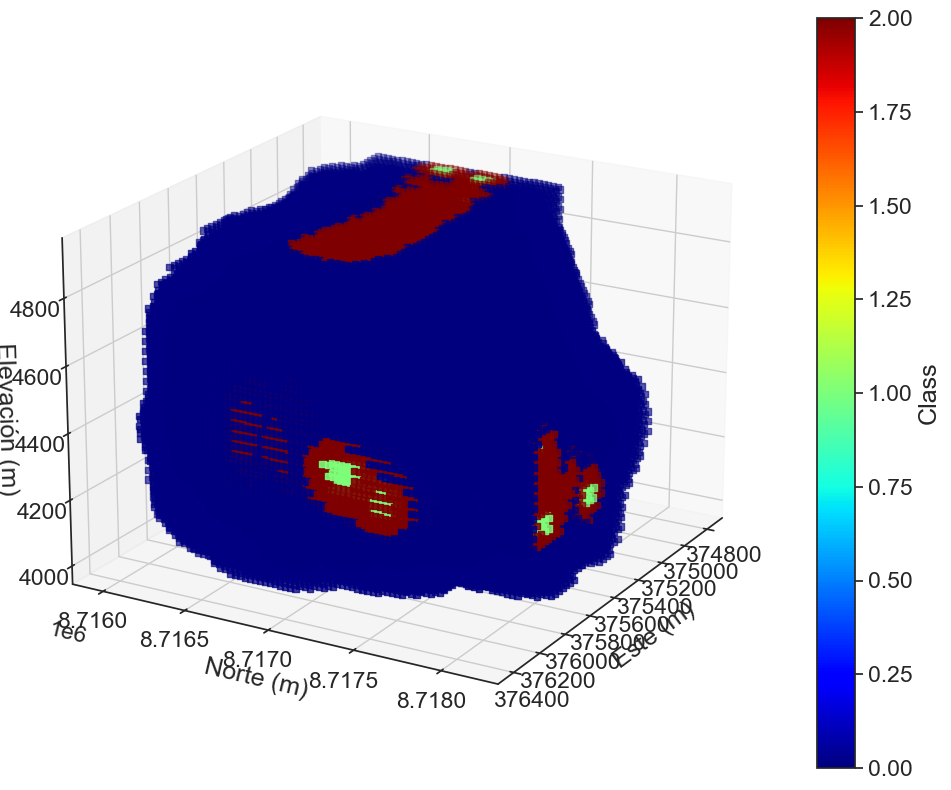

In [87]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df02['X'], df02['Y'], df02['Z'], c=df02['Categoria'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoriaS_AMM.jpg", dpi=600)

plt.show()

In [88]:
bd=pd.read_csv('sondajesA.csv')

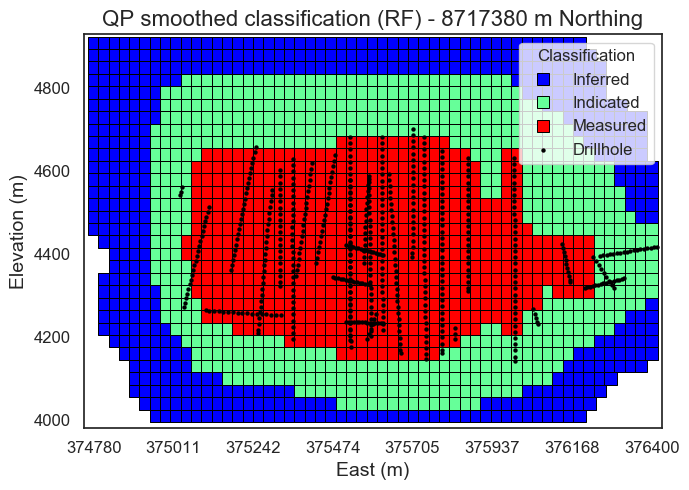

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicated"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df02['Categoria_label'] = df02['Categoria_suavizada'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df02_corte_y = df01[df01['Y'] == corte_y]

# Verificar si hay datos para el corte
if df02_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 80  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df02_corte_y["X"], 
        y=df02_corte_y["Z"], 
        hue=df02_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

   # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'QP smoothed classification (RF) - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("QP_RF suavizado.jpg", dpi=800)
    plt.show()


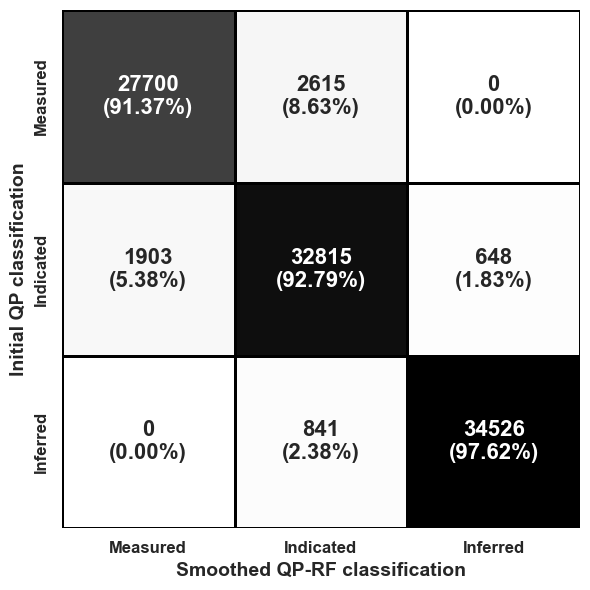

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df01["Categoria"], df02["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial QP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("QP_RF suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [91]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df02["Categoria_suavizada"].value_counts()

# Mostrar los resultados
print(categoria_counts)


Categoria_suavizada
2    36271
0    35174
1    29603
Name: count, dtype: int64


In [92]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Tomar una muestra de 10,000 registros de df01 para optimizar tiempo de cómputo
df_sample = df02.iloc[:10000]

# Asegurar que la columna 'Categoria' y 'Categoria_suavizada' no tengan valores nulos
df_sample = df_sample[df_sample["Categoria"].notnull() & df_sample["Categoria_suavizada"].notnull()]

# Normalizar las coordenadas espaciales
scaler = StandardScaler()
X_sample_scaled = scaler.fit_transform(df_sample[["X", "Y", "Z"]])

# Aplicar PCA para reducir dimensiones a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sample_scaled)

# Calcular el Silhouette Score antes del suavizado
silhouette_before = silhouette_score(X_pca, df_sample["Categoria"])

# Calcular el Silhouette Score después del suavizado
silhouette_after = silhouette_score(X_pca, df_sample["Categoria_suavizada"])

# Crear una tabla de comparación
silhouette_comparison = pd.DataFrame({
    "Método": ["Antes del Suavizado", "Después del Suavizado"],
    "Silhouette Score": [silhouette_before, silhouette_after]
})

# Mostrar la tabla
print(silhouette_comparison)

                  Método  Silhouette Score
0    Antes del Suavizado             -0.08
1  Después del Suavizado             -0.05


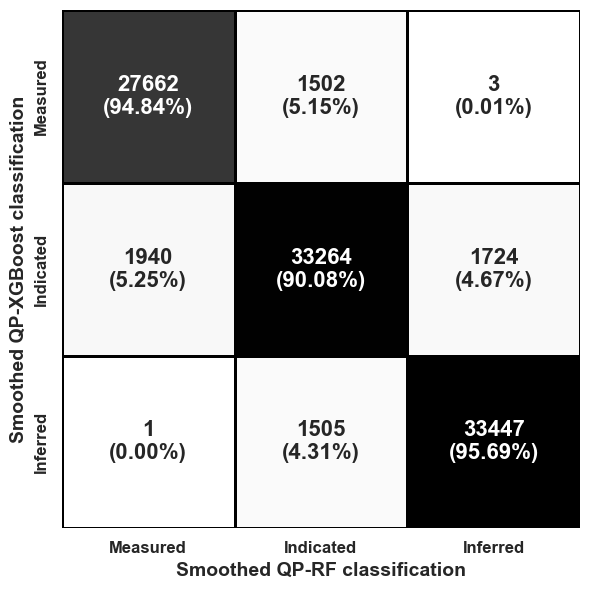

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df01["Categoria_suavizada"], df02["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed QP-XGBoost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("XGBOOST VS RF suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [94]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluar el modelo en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Calcular la precisión
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba: {accuracy:.2f}")

# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=["Inferidos", "Medidos", "Indicados"]))

# Matriz de confusión
print("Matriz de confusión:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

Precisión en el conjunto de prueba: 0.92
Reporte de clasificación:
              precision    recall  f1-score   support

   Inferidos       0.97      0.96      0.96      7059
     Medidos       0.93      0.90      0.91      6114
   Indicados       0.87      0.91      0.89      7037

    accuracy                           0.92     20210
   macro avg       0.92      0.92      0.92     20210
weighted avg       0.92      0.92      0.92     20210

Matriz de confusión:
[[6776    0  283]
 [   0 5485  629]
 [ 236  424 6377]]


In [95]:
df02.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,0.19,1.34,0.19,1.00,1.01
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.39,5.55,0.39,0.84,0.84
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.05,0.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.64,0.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,0.00,0.88,0.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,0.00,1.23,0.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,1.00,950.16,1.00,2.00,2.00


In [96]:
df02[df02["Categoria_suavizada"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,29603.00,0.41,0.21,0.00,0.27,0.38,0.52,2.03
OK_Lagrangian,29603.00,-0.00,0.00,-0.01,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,29603.00,178.63,31.37,116.75,154.56,177.32,200.98,292.84
OK_krig_var,29603.00,0.04,0.01,0.00,0.02,0.03,0.05,0.09
OK_n_samples,29603.00,194.20,22.08,16.00,200.00,200.00,200.00,200.00
X,29603.00,375620.97,323.91,374810.00,375380.00,375620.00,375890.00,376340.00
Y,29603.00,8716966.77,379.22,8715970.00,8716690.00,8716960.00,8717230.00,8717980.00
Z,29603.00,4469.72,170.47,4070.00,4340.00,4460.00,4610.00,4910.00
calidad_code,29603.00,0.63,0.48,0.00,0.00,1.00,1.00,1.00
cov,29603.00,0.88,5.73,0.05,0.33,0.49,0.73,562.51


In [97]:
df02[df02["Categoria_suavizada"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,36271.00,0.31,0.12,0.00,0.24,0.32,0.38,1.14
OK_Lagrangian,36271.00,-0.00,0.00,-0.02,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,36271.00,237.83,29.73,104.39,216.67,234.82,257.25,348.15
OK_krig_var,36271.00,0.08,0.01,0.00,0.07,0.08,0.09,0.10
OK_n_samples,36271.00,128.47,53.13,12.00,84.00,124.00,184.00,200.00
X,36271.00,375621.63,426.95,374780.00,375260.00,375650.00,375980.00,376400.00
Y,36271.00,8717007.19,569.69,8715970.00,8716510.00,8716990.00,8717470.00,8718160.00
Z,36271.00,4439.92,251.21,4010.00,4220.00,4430.00,4640.00,4910.00
calidad_code,36271.00,0.02,0.13,0.00,0.00,0.00,0.00,1.00
cov,36271.00,1.24,4.30,0.10,0.74,0.90,1.17,663.62


In [98]:
df02[df02["Categoria_suavizada"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,35174.00,0.29,0.12,0.00,0.21,0.29,0.37,1.06
OK_Lagrangian,35174.00,-0.03,0.02,-0.08,-0.03,-0.02,-0.01,-0.01
OK_average_sample_distance,35174.00,278.03,55.45,114.83,235.97,271.48,315.06,442.94
OK_krig_var,35174.00,0.11,0.02,0.06,0.09,0.10,0.12,0.17
OK_n_samples,35174.00,25.38,20.72,1.00,9.00,20.00,38.00,125.00
X,35174.00,375591.01,523.37,374780.00,375110.00,375530.00,376130.00,376400.00
Y,35174.00,8717000.65,708.89,8715970.00,8716300.00,8717050.00,8717650.00,8718160.00
Z,35174.00,4419.43,295.89,4010.00,4130.00,4400.00,4700.00,4910.00
calidad_code,35174.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
cov,35174.00,1.83,6.44,0.38,0.88,1.12,1.56,950.16


### Calcular tonelaje para cada bloque: 30x30x30= 27 000 m3
#27 000 m3 * 2.3 =62 100 t por cada bloque
### en medidos (1): 29603 bloques *62 100 t = 1838346300; ley=0.41
### en indicados (2): 36271 bloques * 62 100 t= 2252429100; ley=0.31
### en inferidos (0): 35174  bloques* 62 100 t= 2184305400; ley=0.29

In [99]:
metal_medido = 1838346300 * (0.41/100) * 0.9
metal_indicado = 2252429100 * (0.31/100) * 0.9
metal_inferido = 2184305400 * (0.29/100) * 0.9

In [100]:
metal_medido

6783497.846999999

In [101]:
metal_indicado

6284277.189

In [102]:
metal_inferido

5701037.094

In [103]:
df02.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [104]:
print(df02['Categoria'].unique())

[0 2 1]


In [105]:
df02.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [106]:
df_0 = df02[df02['Categoria_suavizada']==1]
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
9614,0.24,-0.00,202.31,0.03,48.00,376100.00,8716750.00,4070.00,1,0.71,0,baja,1,Measured,1
9669,0.17,-0.00,188.40,0.01,47.00,376100.00,8716780.00,4070.00,1,0.63,0,baja,1,Measured,1
9724,0.19,-0.00,183.83,0.02,48.00,376100.00,8716810.00,4070.00,1,0.79,0,baja,1,Measured,1
13156,0.42,-0.01,122.53,0.06,16.00,375110.00,8716480.00,4100.00,0,0.56,0,baja,1,Measured,1
13157,0.43,-0.00,152.85,0.05,20.00,375140.00,8716480.00,4100.00,0,0.52,0,baja,1,Measured,1


In [107]:
# Contar la cantidad de filas por cada valor único en 'Categoria_s_original'
conteo_por_categoria = df02.groupby('Categoria_suavizada').size()

# Mostrar el resultado
print(conteo_por_categoria)

Categoria_suavizada
0    35174
1    29603
2    36271
dtype: int64


In [108]:
# Calcular el promedio de la variable 'ko' por cada valor único en 'Categoria_s_original'
promedio_por_categoria = df02.groupby('Categoria_suavizada')['OK'].mean()

# Mostrar el resultado
print(promedio_por_categoria)

Categoria_suavizada
0   0.29
1   0.41
2   0.31
Name: OK, dtype: float64


In [109]:
df02["OK"].describe().T

count   101048.00
mean         0.33
std          0.16
min          0.00
25%          0.23
50%          0.32
75%          0.41
max          2.03
Name: OK, dtype: float64

In [110]:
# Crear una nueva columna 'Categoria_n' basada en la columna 'Categoria'
df02['Categoria_n'] = df02['Categoria'].replace({'Inferido': 0, 'Medido': 1, 'Indicado': 2})

# Mostrar las primeras filas para verificar el resultado
df02[['Categoria', 'Categoria_n']].head()


,Categoria,Categoria_n
37,0,0
38,0,0
39,0,0
91,0,0
92,0,0


In [111]:
# Crear tres nuevos DataFrames según los valores de Categoria_s_original
df_medido = df02[df02['Categoria_n'] == 1].copy()
df_inferido = df02[df02['Categoria_n'] == 0].copy()
df_indicado = df02[df02['Categoria_n'] == 2].copy()

In [112]:
df_medido2 = df02[df02['Categoria_suavizada'] == 1].copy()
df_inferido2 = df02[df02['Categoria_suavizada'] == 0].copy()
df_indicado2 = df02[df02['Categoria_suavizada'] == 2].copy()

In [113]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos11 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos11.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido[df_medido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos11.loc[index, 'Tonelaje'] = tonnage
    intervalos11.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos11['Tonelaje'] = (intervalos11['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos11)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1771961.40    0.42
1           0.20 1584419.40    0.46
2           0.30 1256531.40    0.51
3           0.40  852819.30    0.59
4           0.50  518038.20    0.68
5           0.60  295099.20    0.77
6           0.70  171954.90    0.87
7           0.80  100229.40    0.95
8           0.90   55393.20    1.04
9           1.00   29311.20    1.12


In [114]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos00 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos00.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido[df_inferido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos00.loc[index, 'Tonelaje'] = tonnage
    intervalos00.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos00['Tonelaje'] = (intervalos00['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos00)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2053771.20    0.31
1           0.20 1730913.30    0.33
2           0.30 1026140.40    0.39
3           0.40  367818.30    0.47
4           0.50   62596.80    0.59
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [115]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos22 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos22.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado[df_indicado['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos22.loc[index, 'Tonelaje'] = tonnage
    intervalos22.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos22['Tonelaje'] = (intervalos22['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos22)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2086497.90    0.32
1           0.20 1836172.80    0.35
2           0.30 1249576.20    0.39
3           0.40  428800.50    0.47
4           0.50   89424.00    0.58
5           0.60   28379.70    0.68
6           0.70    8631.90    0.77
7           0.80    2049.30    0.88
8           0.90     683.10    0.95
9           1.00       0.00     NaN


In [116]:
intervalos00.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,527278.68,790661.92,621.00,5402.70,39216.15,861559.88,2053771.20
Cu (%),10.00,0.67,0.28,0.31,0.41,0.67,0.92,1.05


In [117]:
df_medido2 = df02[df02['Categoria_suavizada'] == 1].copy()
df_inferido2 = df02[df02['Categoria_suavizada'] == 0].copy()
df_indicado2 = df02[df02['Categoria_suavizada'] == 2].copy()

In [118]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos0 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos0.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido2[df_inferido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos0.loc[index, 'Tonelaje'] = tonnage
    intervalos0.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos0['Tonelaje'] = (intervalos0['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos0)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2043711.00    0.31
1           0.20 1720977.30    0.33
2           0.30 1018936.80    0.39
3           0.40  366390.00    0.47
4           0.50   62783.10    0.59
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [119]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos1 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos1.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido2[df_medido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos1.loc[index, 'Tonelaje'] = tonnage
    intervalos1.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos1['Tonelaje'] = (intervalos1['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos1)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1739296.80    0.43
1           0.20 1569515.40    0.46
2           0.30 1253612.70    0.51
3           0.40  850024.80    0.59
4           0.50  518038.20    0.67
5           0.60  293422.50    0.77
6           0.70  169408.80    0.87
7           0.80   98801.10    0.95
8           0.90   54648.00    1.04
9           1.00   29124.90    1.12


In [120]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos2 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos2.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado2[df_indicado2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos2.loc[index, 'Tonelaje'] = tonnage
    intervalos2.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos2['Tonelaje'] = (intervalos2['Tonelaje'] * 30 * 30 * 30 * 2.3)/1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos2)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2129222.70    0.32
1           0.20 1861012.80    0.35
2           0.30 1259698.50    0.39
3           0.40  433023.30    0.47
4           0.50   89237.70    0.59
5           0.60   30056.40    0.70
6           0.70   11178.00    0.79
7           0.80    3477.60    0.88
8           0.90    1428.30    0.95
9           1.00     186.30    1.06


In [121]:
intervalos0.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,524434.50,786338.38,621.00,5402.70,39309.30,855800.10,2043711.00
Cu (%),10.00,0.67,0.28,0.31,0.41,0.67,0.92,1.05


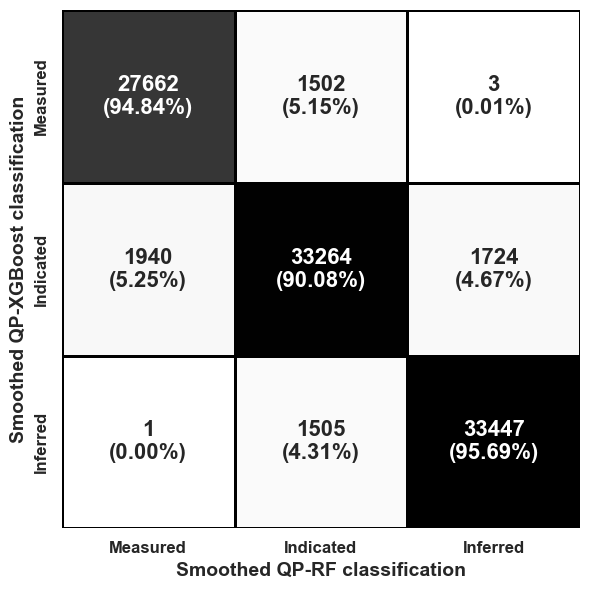

In [122]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df01["Categoria_suavizada"], df02["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed QP-XGBoost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
#plt.savefig("RF y XGBoost suavizado matriz.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

### VARIABLES

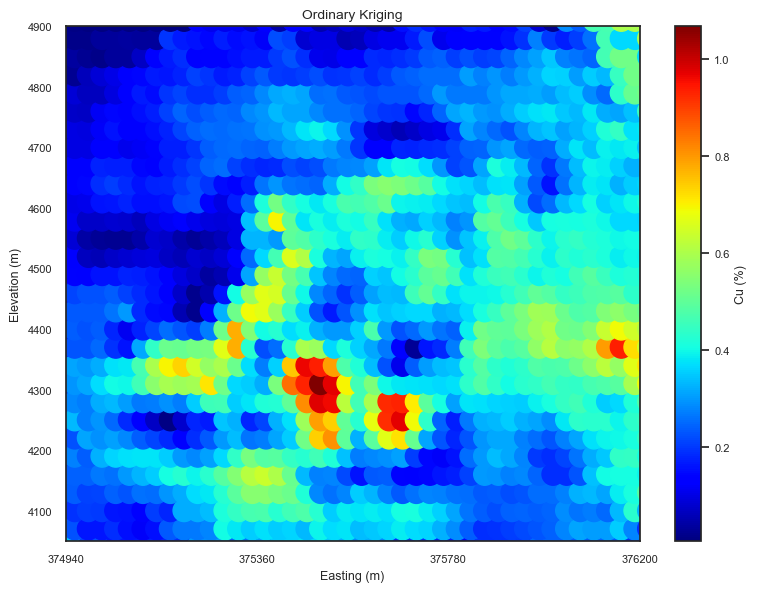

In [123]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
import numpy as np

# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'
rcParams['font.size'] = 9
rcParams['axes.titlesize'] = 10
rcParams['axes.labelsize'] = 9
rcParams['xtick.labelsize'] = 8
rcParams['ytick.labelsize'] = 8

# Filtro para el corte 8716800
corte = 8717380
mask = (df['Y'] == corte)

# Datos filtrados
X = df.loc[mask, 'X']
Z = df.loc[mask, 'Z']
OK = df.loc[mask, 'OK']

# Crear el gráfico de Ordinary Kriging
plt.figure(figsize=(8, 6))
sc1 = plt.scatter(X, Z, c=OK, cmap='jet', marker='o', s=250)
plt.title('Ordinary Kriging')
plt.xlabel('Easting (m)')
plt.ylabel('Elevation (m)')
plt.xlim(374940, 376200)
plt.ylim(4050, 4900)

# Definir los valores de los ticks en el eje X
xticks = np.linspace(374940, 376200, 4)  # 4 valores entre 374700 y 376500
plt.xticks(xticks)

# Agregar barra de color
plt.colorbar(sc1, label='Cu (%)')

# Mostrar el gráfico
plt.tight_layout()
plt.show()

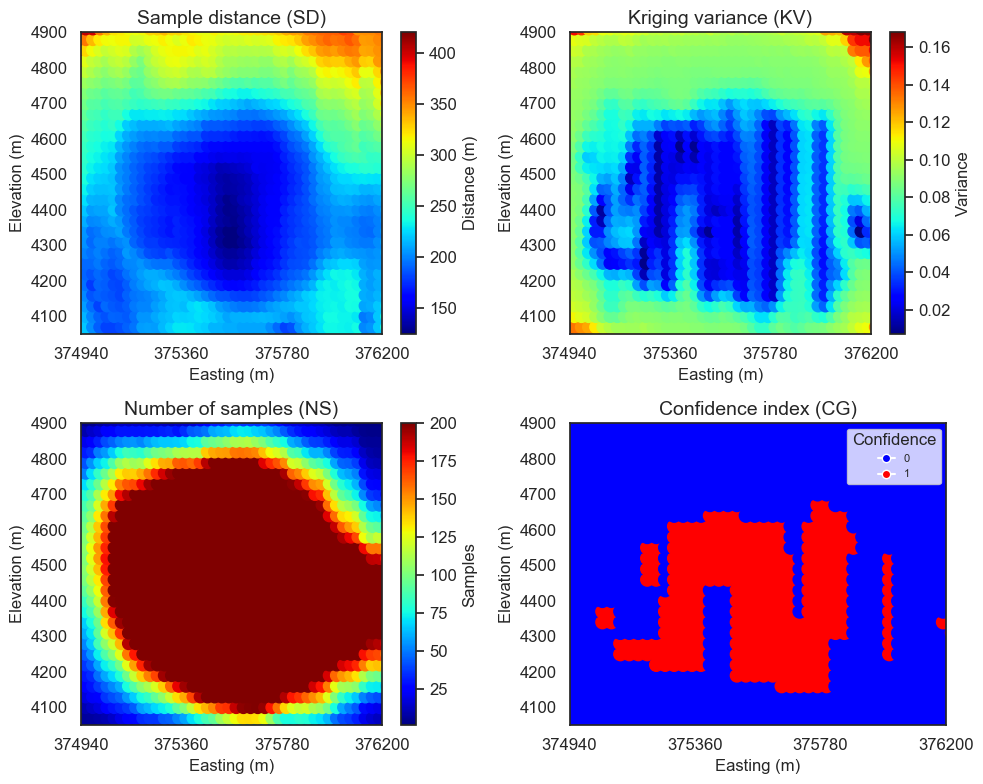

In [124]:
import matplotlib.pyplot as plt
from matplotlib import rcParams
import numpy as np
from matplotlib.colors import ListedColormap

# Configuración de estilo y tamaño de fuente
rcParams['font.family'] = 'sans-serif'
rcParams['font.size'] = 12
rcParams['axes.titlesize'] = 14
rcParams['axes.labelsize'] = 12
rcParams['xtick.labelsize'] = 12
rcParams['ytick.labelsize'] = 12

# Filtro para el corte 8716800
corte = 8717380
mask = (df['Y'] == corte)

# Datos filtrados
X = df.loc[mask, 'X']
Z = df.loc[mask, 'Z']
OK_average_sample_distance = df.loc[mask, 'OK_average_sample_distance']
OK_krig_var = df.loc[mask, 'OK_krig_var']
OK_n_samples = df.loc[mask, 'OK_n_samples']
confianza = df.loc[mask, 'confianza']

# Crear la figura y los subgráficos (2x2)
fig, axs = plt.subplots(2, 2, figsize=(10, 8))

# Limitar los rangos de los ejes X y Y
xlim = (374940, 376200)
ylim = (4050, 4900)
# Definir los valores de los ticks en el eje X
xticks = np.linspace(xlim[0], xlim[1], 4)  # 4 valores entre 374700 y 376500

# Gráfico 1: OK_average_sample_distance
sc3 = axs[0, 0].scatter(X, Z, c=OK_average_sample_distance, cmap='jet', marker='o', s=75)
axs[0, 0].set_title('Sample distance (SD)')
axs[0, 0].set_xlabel('Easting (m)')
axs[0, 0].set_ylabel('Elevation (m)')
axs[0, 0].set_xlim(xlim)
axs[0, 0].set_ylim(ylim)
axs[0, 0].set_xticks(xticks)  # Establecer los ticks del eje X
fig.colorbar(sc3, ax=axs[0, 0], label='Distance (m)')

# Gráfico 2: OK_krig_var
sc4 = axs[0, 1].scatter(X, Z, c=OK_krig_var, cmap='jet', marker='o', s=75)
axs[0, 1].set_title('Kriging variance (KV)')
axs[0, 1].set_xlabel('Easting (m)')
axs[0, 1].set_ylabel('Elevation (m)')
axs[0, 1].set_xlim(xlim)
axs[0, 1].set_ylim(ylim)
axs[0, 1].set_xticks(xticks)  # Establecer los ticks del eje X
fig.colorbar(sc4, ax=axs[0, 1], label='Variance')

# Gráfico 3: OK_n_samples
sc5 = axs[1, 0].scatter(X, Z, c=OK_n_samples, cmap='jet', marker='o', s=75)
axs[1, 0].set_title('Number of samples (NS)')
axs[1, 0].set_xlabel('Easting (m)')
axs[1, 0].set_ylabel('Elevation (m)')
axs[1, 0].set_xlim(xlim)
axs[1, 0].set_ylim(ylim)
axs[1, 0].set_xticks(xticks)  # Establecer los ticks del eje X
fig.colorbar(sc5, ax=axs[1, 0], label='Samples')

# Gráfico 4: Confianza
cmap_confianza = ListedColormap(['blue', 'red'])
sc6 = axs[1, 1].scatter(X, Z, c=confianza, cmap=cmap_confianza, marker='o', s=88)
axs[1, 1].set_title('Confidence index (CG)')
axs[1, 1].set_xlabel('Easting (m)')
axs[1, 1].set_ylabel('Elevation (m)')
axs[1, 1].set_xlim(xlim)
axs[1, 1].set_ylim(ylim)
axs[1, 1].set_xticks(xticks)  # Establecer los ticks del eje X

# Eliminar la barra de colores en el gráfico de "Confidence index"
#fig.colorbar(sc6, ax=axs[1, 1], label='Confidence')

# Agregar leyenda categórica para el gráfico de "Confidence index"
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=6, label='0'),
           plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='red', markersize=6, label='1')]
axs[1, 1].legend(handles=handles, title='Confidence', fontsize=8, loc='upper right', title_fontsize=12, handlelength=1.5)

# Ajustar el diseño para eliminar espacios en blanco
plt.subplots_adjust(left=0.1, right=0.9, top=0.95, bottom=0.05)

# Ajustar el layout final
plt.tight_layout()
#plt.savefig('2d modelo confidence.jpg', dpi=800)
# Mostrar los gráficos
plt.show()

### Clustering con K-PROTOTYPE

#### CLUSTERING

In [125]:
import pandas as pd
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import train_test_split
from kmodes.kprototypes import KPrototypes

# Seleccionar las variables deseadas
variables_deseadas = ["OK_average_sample_distance", "OK_krig_var", "OK_n_samples"]

# Crear un nuevo DataFrame con las variables deseadas
nuevo_df1 = df[variables_deseadas].copy()

# Aplicar PowerTransformer a las variables
pt = PowerTransformer()
X_transformed = pt.fit_transform(nuevo_df1)

# Crear un nuevo DataFrame con los datos transformados
nuevo_df = pd.DataFrame(X_transformed, columns=variables_deseadas)

# Añadir la columna 'calidad' al nuevo DataFrame y asegurarse de que es categórica
nuevo_df["calidad"] = df["confianza_geo"].values
nuevo_df["calidad"] = nuevo_df["calidad"].astype('category')  # Asegurar que es categórica

# Mostrar las primeras filas del nuevo DataFrame
print(nuevo_df.head())

   OK_average_sample_distance  OK_krig_var  OK_n_samples calidad
0                       -0.57         2.54         -1.86    baja
1                       -0.60         2.54         -1.86    baja
2                       -0.54         2.54         -1.86    baja
3                       -0.50         2.54         -1.86    baja
4                       -0.62         2.54         -1.86    baja


In [126]:
nuevo_df.describe().T

,count,mean,std,min,25%,50%,75%,max
OK_average_sample_distance,101048.00,-0.00,1.00,-2.97,-0.61,0.01,0.63,2.91
OK_krig_var,101048.00,0.00,1.00,-2.33,-0.80,0.25,0.56,2.54
OK_n_samples,101048.00,0.00,1.00,-1.86,-0.91,0.14,1.05,1.05


In [127]:
kproto = KPrototypes(n_clusters=3, init='Huang', n_jobs = 4, random_state=17276365)
clusters_kproto = kproto.fit_predict(nuevo_df, categorical=[3])

In [128]:
df["Categoria"] = clusters_kproto

df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0


In [129]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


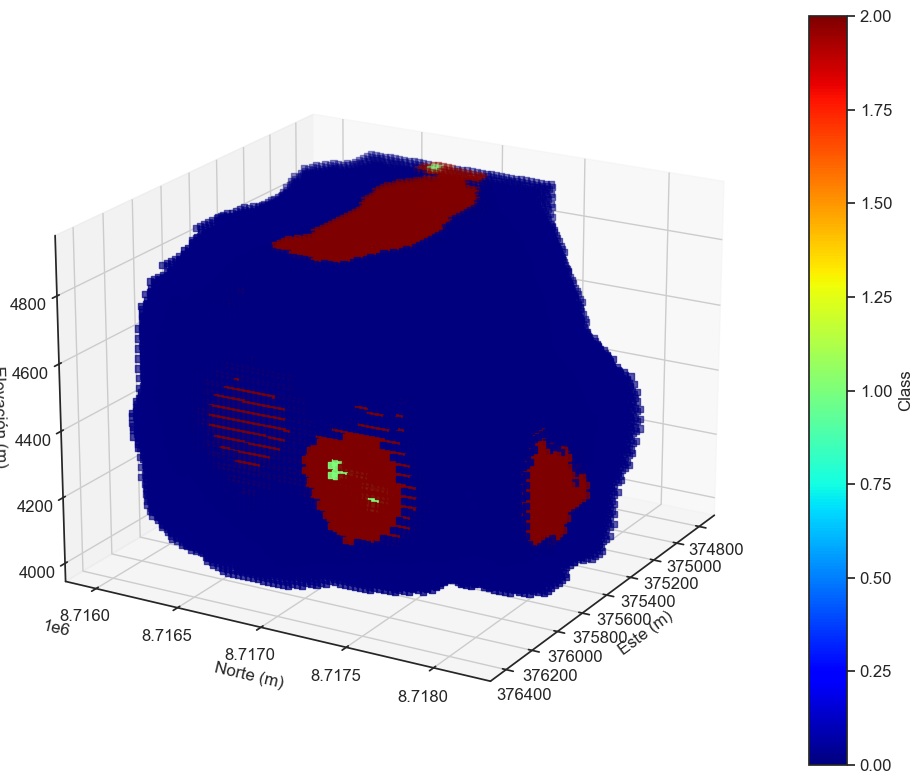

In [130]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df['X'], df['Y'], df['Z'], c=df['Categoria'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoria.jpg", dpi=600)

plt.show()

In [131]:
# Exportar el DataFrame resultante a un archivo CSV
output_path = "Kfinal.csv"
df.to_csv(output_path, index=False)

In [384]:
df = pd.read_csv("Kfinal.csv", sep=",")

In [385]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


In [386]:
bd=pd.read_csv('sondajesA.csv')

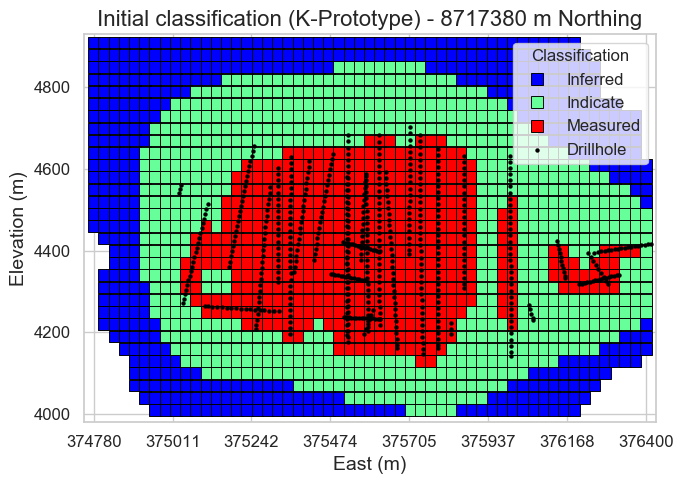

In [387]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicate"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df['Categoria_label'] = df['Categoria'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df_corte_y = df[df['Y'] == corte_y]

# Verificar si hay datos para el corte
if df_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 70  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df_corte_y["X"], 
        y=df_corte_y["Z"], 
        hue=df_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

    # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'Initial classification (K-Prototype) - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("KP_Inicial.jpg", dpi=800)
    plt.show()


In [388]:
df["Categoria"].value_counts()


Categoria
2    39974
0    36187
1    24887
Name: count, dtype: int64

In [389]:
df1 = df.copy()

In [390]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


### XGboost

In [391]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Configuración de datos
X = df1[['X', 'Y', 'Z']]  # Variables independientes
y = df1['Categoria']      # Variable dependiente (Categoría)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos con StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Configuración del modelo XGBoost
xgb_model = XGBClassifier(
    objective='multi:softmax',    # Clasificación multicategoría
    num_class=3,                 # Tres categorías: Medido, Indicado, Inferido
    random_state=42,             # Semilla aleatoria para reproducibilidad
    use_label_encoder=False,     # No usar codificador de etiquetas obsoleto
    eval_metric='mlogloss',      # Métrica de pérdida logarítmica multicategoría
    max_depth=7,                 # Mayor profundidad para capturar patrones
    learning_rate=0.1,          # Tasa de aprendizaje ajustada
    n_estimators=200,            # Número de árboles para mejorar el ajuste
    min_child_weight=5,          # Permitir más divisiones en nodos
    subsample=0.7,               # Submuestreo para cada árbol
    colsample_bytree=0.7,        # Submuestreo de características por árbol
    gamma=1                    # Regularización para evitar sobreajuste
)
# Entrenar el modelo con los datos de entrenamiento
xgb_model.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred_test = xgb_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"Exactitud en el conjunto de prueba: {test_accuracy:.2f}")

# Predicciones suavizadas en el conjunto original
X_original = df1[['X', 'Y', 'Z']]
X_original = scaler.transform(X_original)  # Normalizar el conjunto original
df1['Categoria_suavizada'] = xgb_model.predict(X_original)

# Mostrar las primeras filas del DataFrame con predicciones suavizadas
print(df1.head())


Exactitud en el conjunto de prueba: 0.92
    OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
0 0.05          -0.08                      199.18         0.17          1.00   
1 0.05          -0.08                      197.46         0.17          1.00   
2 0.05          -0.08                      200.27         0.17          1.00   
3 0.05          -0.08                      202.67         0.17          1.00   
4 0.05          -0.08                      196.45         0.17          1.00   

          X          Y       Z  calidad_code  cov  confianza confianza_geo  \
0 375890.00 8715970.00 4010.00             0 7.88          0          baja   
1 375920.00 8715970.00 4010.00             0 7.88          0          baja   
2 375950.00 8715970.00 4010.00             0 7.88          0          baja   
3 375860.00 8716000.00 4010.00             0 7.88          0          baja   
4 375890.00 8716000.00 4010.00             0 7.88          0          baja   

   Catego

In [392]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [393]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


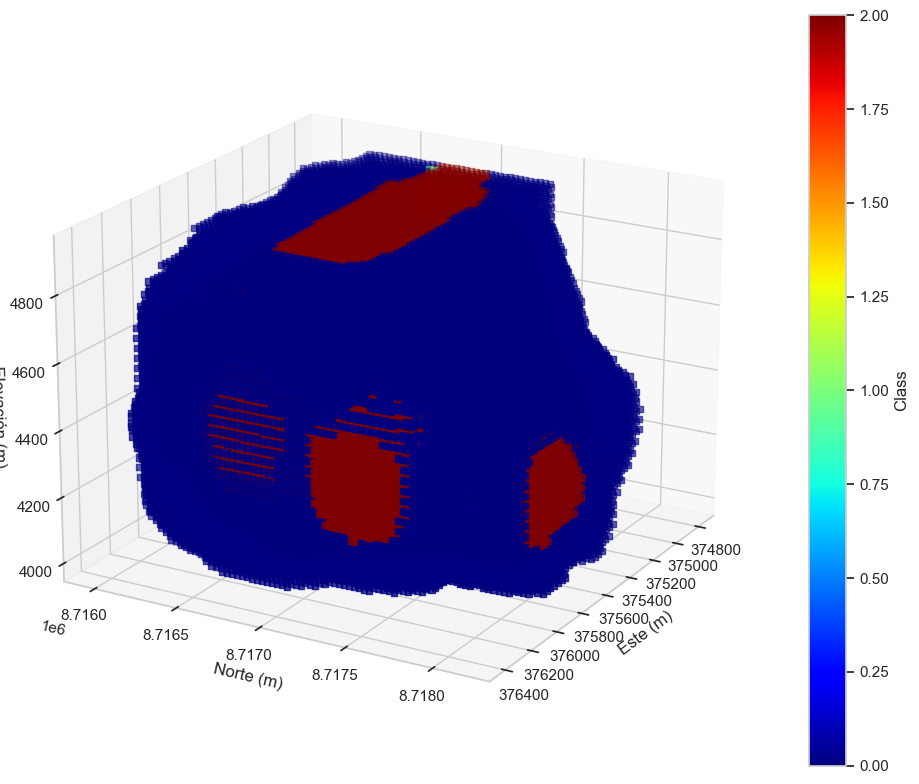

In [394]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df1['X'], df1['Y'], df1['Z'], c=df1['Categoria_suavizada'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoriaS_AMM.jpg", dpi=600)

plt.show()

In [395]:
bd=pd.read_csv('sondajesA.csv')

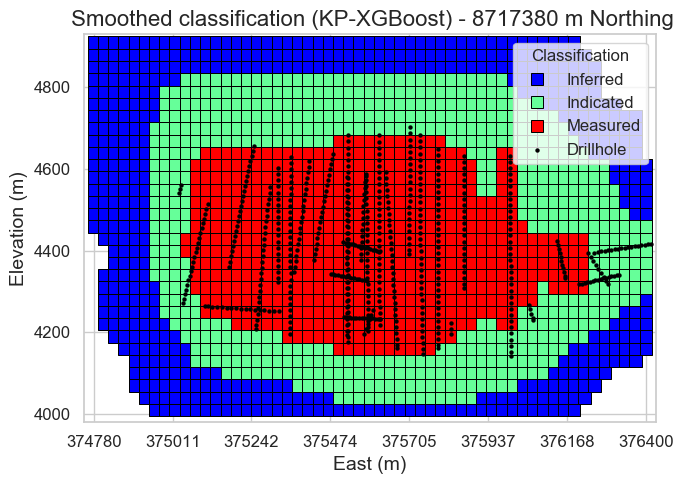

In [396]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicated"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df1['Categoria_label'] = df1['Categoria_suavizada'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df1_corte_y = df01[df01['Y'] == corte_y]

# Verificar si hay datos para el corte
if df1_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 80  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df1_corte_y["X"], 
        y=df1_corte_y["Z"], 
        hue=df1_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

   # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f' Smoothed classification (KP-XGBoost) - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("KPXGboost suavizado.jpg", dpi=800)
    plt.show()


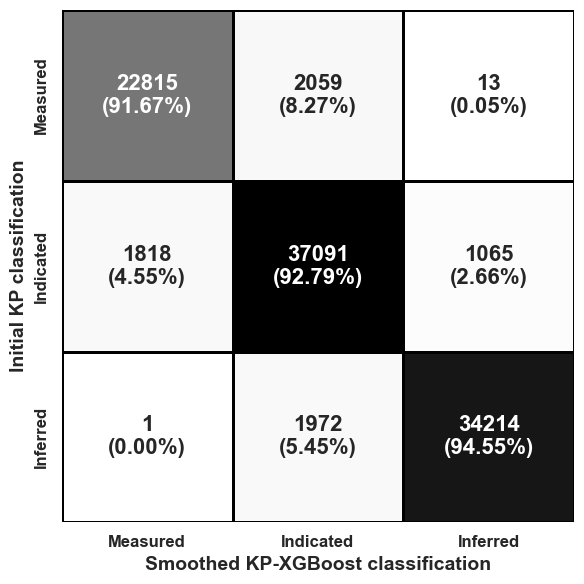

In [397]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df1["Categoria"], df1["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KP-XGBoost classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("XGboost KP suavizado vs Initial.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

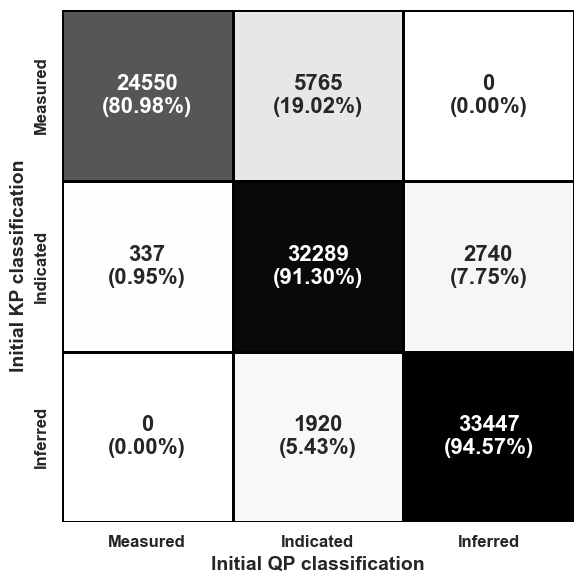

In [398]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df00["Categoria"], df1["Categoria"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Initial QP classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("INITIAL QP suavizado vs Initial.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [147]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df1["Categoria_suavizada"].value_counts()

# Mostrar los resultados
print(categoria_counts)

Categoria_suavizada
2    41122
0    35292
1    24634
Name: count, dtype: int64


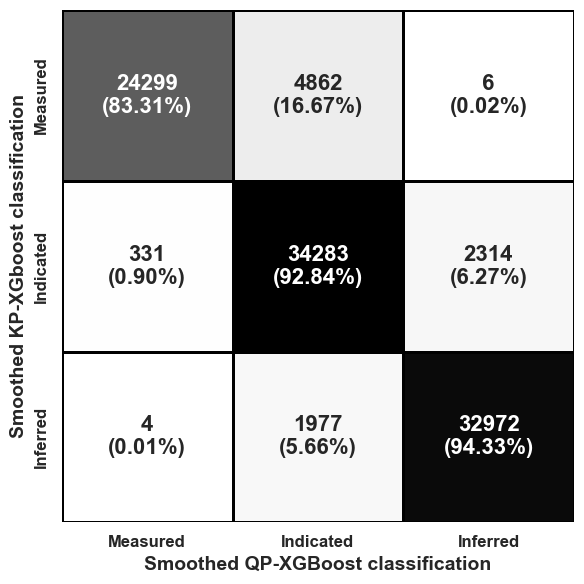

In [399]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df01["Categoria_suavizada"], df1["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-XGBoost classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-XGboost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("INITIAL QP-KPXgboost suavizado vs Initial.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

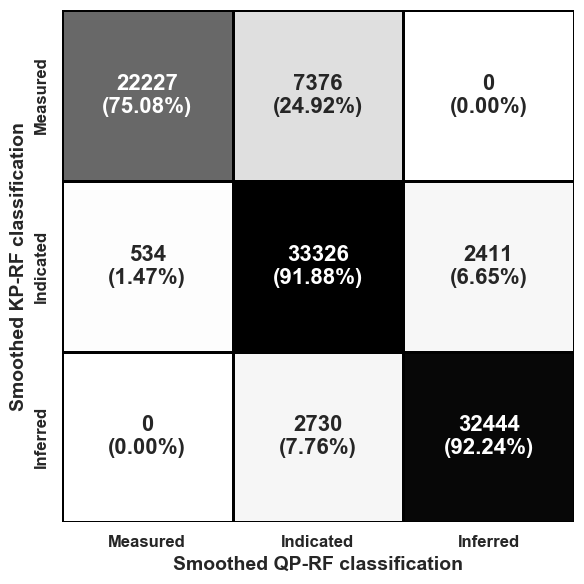

In [401]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df02["Categoria_suavizada"], df2["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-RF classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("INITIAL QP-KPRF suavizado vs Initial.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [150]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Tomar una muestra de 10,000 registros de df01 para optimizar tiempo de cómputo
df_sample = df1.iloc[:10000]

# Asegurar que la columna 'Categoria' y 'Categoria_suavizada' no tengan valores nulos
df_sample = df_sample[df_sample["Categoria"].notnull() & df_sample["Categoria_suavizada"].notnull()]

# Normalizar las coordenadas espaciales
scaler = StandardScaler()
X_sample_scaled = scaler.fit_transform(df_sample[["X", "Y", "Z"]])

# Aplicar PCA para reducir dimensiones a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sample_scaled)

# Calcular el Silhouette Score antes del suavizado
silhouette_before = silhouette_score(X_pca, df_sample["Categoria"])

# Calcular el Silhouette Score después del suavizado
silhouette_after = silhouette_score(X_pca, df_sample["Categoria_suavizada"])

# Crear una tabla de comparación
silhouette_comparison = pd.DataFrame({
    "Método": ["Antes del Suavizado", "Después del Suavizado"],
    "Silhouette Score": [silhouette_before, silhouette_after]
})

# Mostrar la tabla
print(silhouette_comparison)

                  Método  Silhouette Score
0    Antes del Suavizado             -0.10
1  Después del Suavizado             -0.11


In [151]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluar el modelo en el conjunto de prueba
y_pred = xgb_model.predict(X_test)

# Calcular la precisión
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba: {accuracy:.2f}")

# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=["Inferidos", "Medidos", "Indicados"]))

# Matriz de confusión
print("Matriz de confusión:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

Precisión en el conjunto de prueba: 0.92
Reporte de clasificación:
              precision    recall  f1-score   support

   Inferidos       0.96      0.94      0.95      7248
     Medidos       0.91      0.91      0.91      4993
   Indicados       0.89      0.91      0.90      7969

    accuracy                           0.92     20210
   macro avg       0.92      0.92      0.92     20210
weighted avg       0.92      0.92      0.92     20210

Matriz de confusión:
[[6802    1  445]
 [   8 4532  453]
 [ 254  424 7291]]


In [152]:
df1.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,0.19,1.34,0.19,1.04,1.06
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.39,5.55,0.39,0.87,0.87
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.05,0.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.64,0.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,0.00,0.88,0.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,0.00,1.23,0.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,1.00,950.16,1.00,2.00,2.00


In [153]:
df1.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,0.19,1.34,0.19,1.04,1.06
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.39,5.55,0.39,0.87,0.87
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.05,0.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.64,0.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,0.00,0.88,0.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,0.00,1.23,0.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,1.00,950.16,1.00,2.00,2.00


In [154]:
df1[df1["Categoria_suavizada"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,24634.00,0.43,0.22,0.00,0.28,0.40,0.54,2.03
OK_Lagrangian,24634.00,-0.00,0.00,-0.01,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,24634.00,169.57,25.27,116.75,150.12,169.83,188.41,256.92
OK_krig_var,24634.00,0.03,0.01,0.00,0.02,0.03,0.04,0.09
OK_n_samples,24634.00,198.85,10.43,17.00,200.00,200.00,200.00,200.00
X,24634.00,375612.55,301.90,374810.00,375380.00,375620.00,375830.00,376310.00
Y,24634.00,8717004.45,350.76,8716180.00,8716720.00,8716990.00,8717260.00,8718010.00
Z,24634.00,4478.06,162.57,4070.00,4340.00,4460.00,4610.00,4910.00
calidad_code,24634.00,0.70,0.46,0.00,0.00,1.00,1.00,1.00
cov,24634.00,0.90,7.58,0.05,0.31,0.45,0.66,663.62


In [155]:
df1[df1["Categoria_suavizada"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,41122.00,0.31,0.13,0.00,0.24,0.32,0.39,1.15
OK_Lagrangian,41122.00,-0.00,0.00,-0.02,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,41122.00,234.93,27.49,109.55,215.14,231.53,252.51,355.95
OK_krig_var,41122.00,0.07,0.02,0.00,0.07,0.08,0.09,0.11
OK_n_samples,41122.00,134.49,52.61,15.00,89.00,133.00,196.00,200.00
X,41122.00,375642.83,430.40,374780.00,375290.00,375680.00,376010.00,376400.00
Y,41122.00,8717012.32,558.91,8715970.00,8716540.00,8716990.00,8717470.00,8718160.00
Z,41122.00,4440.58,244.15,4040.00,4220.00,4430.00,4640.00,4910.00
calidad_code,41122.00,0.05,0.22,0.00,0.00,0.00,0.00,1.00
cov,41122.00,1.18,2.34,0.07,0.71,0.87,1.13,314.19


In [156]:
df1[df1["Categoria_suavizada"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,35292.00,0.29,0.12,0.00,0.21,0.29,0.36,1.06
OK_Lagrangian,35292.00,-0.03,0.02,-0.08,-0.03,-0.02,-0.01,-0.00
OK_average_sample_distance,35292.00,279.27,55.17,104.39,238.42,273.95,315.62,442.94
OK_krig_var,35292.00,0.11,0.02,0.03,0.09,0.10,0.12,0.17
OK_n_samples,35292.00,24.71,19.70,1.00,9.00,20.00,37.00,138.00
X,35292.00,375572.18,516.52,374780.00,375110.00,375500.00,376100.00,376400.00
Y,35292.00,8716962.70,710.32,8715970.00,8716270.00,8716930.00,8717620.00,8718160.00
Z,35292.00,4417.11,297.00,4010.00,4130.00,4400.00,4700.00,4910.00
calidad_code,35292.00,0.00,0.01,0.00,0.00,0.00,0.00,1.00
cov,35292.00,1.85,6.43,0.38,0.89,1.13,1.56,950.16


### Calcular tonelaje para cada bloque: 30x30x30= 27 000 m3
#27 000 m3 * 2.3 =62 100 t por cada bloque
### en medidos (1): 24634 bloques *62 100 t = 1529771400; ley=0.43
### en indicados (2): 41122 bloques * 62 100 t= 2553676200; ley=0.31
### en inferidos (0): 35292 bloques* 62 100 t=2191633200; ley=0.29

In [157]:
metal_medido = 1529771400 * (0.43/100) * 0.9
metal_indicado = 2553676200 * (0.31/100) * 0.9
metal_inferido = 2191633200 * (0.29/100) * 0.9

In [158]:
metal_medido

5920215.318

In [159]:
metal_indicado

7124756.598

In [160]:
metal_inferido

5720162.652

In [161]:
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


In [162]:
print(df['Categoria'].unique())

[0 2 1]


In [163]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [164]:
df_0 = df1[df1['Categoria_suavizada']==1]
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
6097,0.41,-0.00,129.46,0.02,17.00,375140.00,8716540.00,4070.00,1,0.38,0,baja,1,Measured,1
6146,0.41,-0.00,150.54,0.03,20.00,375140.00,8716570.00,4070.00,1,0.45,0,baja,1,Measured,1
6195,0.41,-0.01,157.74,0.05,20.00,375140.00,8716600.00,4070.00,0,0.55,0,baja,2,Measured,1
9062,0.46,-0.00,142.96,0.03,21.00,375140.00,8716510.00,4100.00,1,0.38,0,baja,1,Measured,1
9111,0.48,-0.00,146.59,0.02,24.00,375140.00,8716540.00,4100.00,1,0.26,1,alta,1,Measured,1


In [165]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [166]:
# Contar la cantidad de filas por cada valor único en 'Categoria_s_original'
conteo_por_categoria = df1.groupby('Categoria_suavizada').size()

# Mostrar el resultado
print(conteo_por_categoria)

Categoria_suavizada
0    35292
1    24634
2    41122
dtype: int64


In [167]:
# Calcular el promedio de la variable 'ko' por cada valor único en 'Categoria_s_original'
promedio_por_categoria = df1.groupby('Categoria_suavizada')['OK'].mean()

# Mostrar el resultado
print(promedio_por_categoria)

Categoria_suavizada
0   0.29
1   0.43
2   0.31
Name: OK, dtype: float64


In [168]:
df1["OK"].describe().T

count   101048.00
mean         0.33
std          0.16
min          0.00
25%          0.23
50%          0.32
75%          0.41
max          2.03
Name: OK, dtype: float64

In [169]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [170]:
df1["cov"].median()

0.8807624160775598

In [171]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [172]:
# Crear una nueva columna 'Categoria_n' basada en la columna 'Categoria'
df1['Categoria_n'] = df1['Categoria'].replace({'Inferido': 0, 'Medido': 1, 'Indicado': 2})

# Mostrar las primeras filas para verificar el resultado
df1[['Categoria', 'Categoria_n']].head()


,Categoria,Categoria_n
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [173]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0


In [174]:
# Crear tres nuevos DataFrames según los valores de Categoria_s_original
df_medido = df1[df1['Categoria_n'] == 1].copy()
df_inferido = df1[df1['Categoria_n'] == 0].copy()
df_indicado = df1[df1['Categoria_n'] == 2].copy()

In [175]:
df_medido2 = df1[df1['Categoria_suavizada'] == 1].copy()
df_inferido2 = df1[df1['Categoria_suavizada'] == 0].copy()
df_indicado2 = df1[df1['Categoria_suavizada'] == 2].copy()

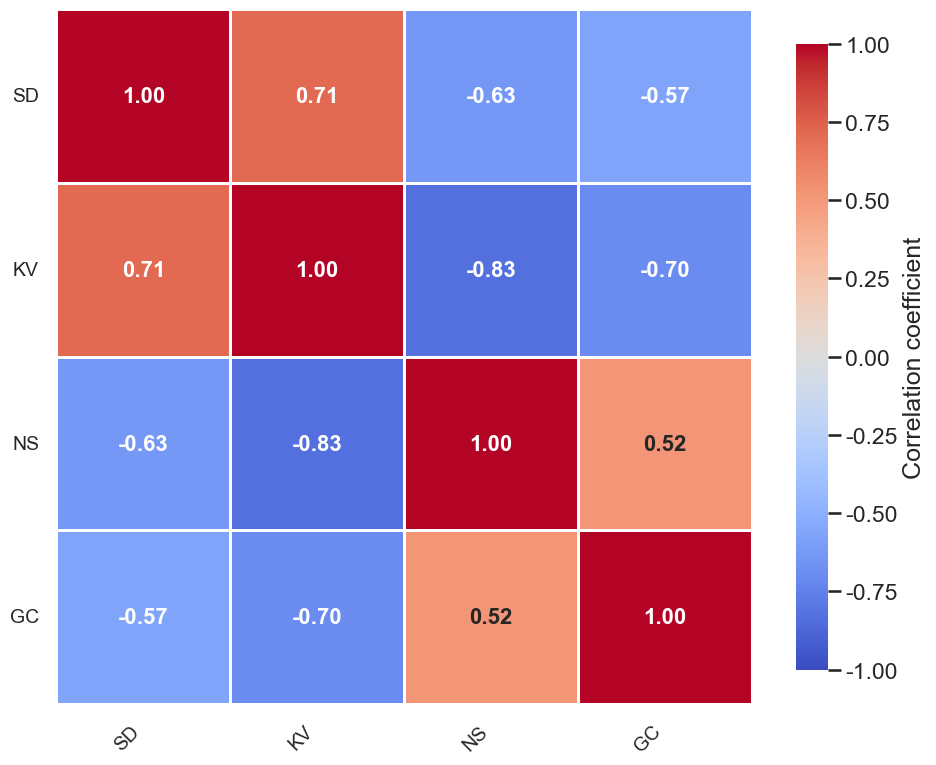

In [176]:
# Importar librerías necesarias
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Seleccionar las variables de interés
variables = ["OK_average_sample_distance", "OK_krig_var", "OK_n_samples", "confianza"]

# Calcular la matriz de correlación de Pearson
correlation_matrix = df1[variables].corr()

# Renombrar las columnas y filas para mayor claridad
correlation_matrix = correlation_matrix.rename(
    index={
        'OK_average_sample_distance': 'SD', 
        'OK_krig_var': 'KV', 
        'OK_n_samples': 'NS', 
        'confianza': 'GC'
    }, 
    columns={
        'OK_average_sample_distance': 'SD', 
        'OK_krig_var': 'KV', 
        'OK_n_samples': 'NS', 
        'confianza': 'GC'
    }
)

# Crear el gráfico de la matriz de correlación
plt.figure(figsize=(10, 8))

# Configurar un estilo profesional
sns.set_theme(style="white", context="talk")
sns.heatmap(
    correlation_matrix, 
    annot=True, 
    cmap="coolwarm",  # Paleta profesional
    fmt=".2f", 
    linewidths=2, 
    vmax=1, 
    vmin=-1, 
    square=True,  # Asegurar celdas cuadradas
    annot_kws={"fontsize": 16, "fontweight": "bold"},  # Tamaño y peso de fuente en anotaciones
    cbar_kws={
        'shrink': 0.9, 
        'label': 'Correlation coefficient', 
        'orientation': 'vertical', 
        'format': '%.2f'
    }
)

# Ajustes finales
plt.xticks(fontsize=14, rotation=45, ha="right", fontweight="medium")
plt.yticks(fontsize=14, rotation=0, fontweight="medium")
plt.title("", fontsize=18, fontweight="bold")
plt.tight_layout()
plt.savefig('matrizcorrelationXGBOOST PROTOTYPE.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


In [177]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos11 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos11.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido[df_medido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos11.loc[index, 'Tonelaje'] = tonnage
    intervalos11.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos11['Tonelaje'] = (intervalos11['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos11)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1460281.50    0.45
1           0.20 1327884.30    0.47
2           0.30 1090413.90    0.52
3           0.40  773517.60    0.59
4           0.50  483075.90    0.68
5           0.60  279636.30    0.78
6           0.70  164254.50    0.87
7           0.80   97683.30    0.95
8           0.90   54834.30    1.04
9           1.00   29124.90    1.12


In [178]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos00 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos00.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido[df_inferido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos00.loc[index, 'Tonelaje'] = tonnage
    intervalos00.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos00['Tonelaje'] = (intervalos00['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos00)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2100284.10    0.30
1           0.20 1768794.30    0.33
2           0.30 1010863.80    0.39
3           0.40  342357.30    0.47
4           0.50   61603.20    0.59
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [179]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos22 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos22.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado[df_indicado['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos22.loc[index, 'Tonelaje'] = tonnage
    intervalos22.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos22['Tonelaje'] = (intervalos22['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos22)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2351664.90    0.33
1           0.20 2054826.90    0.35
2           0.30 1430970.30    0.39
3           0.40  533563.20    0.47
4           0.50  125379.90    0.59
5           0.60   43842.60    0.69
6           0.70   16332.30    0.78
7           0.80    4595.40    0.87
8           0.90    1242.00    0.95
9           1.00     186.30    1.04


In [180]:
intervalos00.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,531544.95,806750.00,621.00,5402.70,38719.35,843737.17,2100284.10
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [181]:
df_medido2 = df1[df1['Categoria_suavizada'] == 1].copy()
df_inferido2 = df1[df1['Categoria_suavizada'] == 0].copy()
df_indicado2 = df1[df1['Categoria_suavizada'] == 2].copy()

In [182]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos0 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos0.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido2[df_inferido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos0.loc[index, 'Tonelaje'] = tonnage
    intervalos0.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos0['Tonelaje'] = (intervalos0['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos0)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2048554.80    0.30
1           0.20 1719486.90    0.33
2           0.30  980372.70    0.39
3           0.40  335526.30    0.47
4           0.50   61168.50    0.60
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [183]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos1 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos1.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido2[df_medido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos1.loc[index, 'Tonelaje'] = tonnage
    intervalos1.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos1['Tonelaje'] = (intervalos1['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos1)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1450780.20    0.45
1           0.20 1325338.20    0.47
2           0.30 1096686.00    0.52
3           0.40  774511.20    0.59
4           0.50  477859.50    0.68
5           0.60  272619.00    0.78
6           0.70  158292.90    0.87
7           0.80   94019.40    0.96
8           0.90   53157.60    1.04
9           1.00   28317.60    1.13


In [184]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos2 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos2.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado2[df_indicado2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos2.loc[index, 'Tonelaje'] = tonnage
    intervalos2.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos2['Tonelaje'] = (intervalos2['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos2)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2412895.50    0.33
1           0.20 2106680.40    0.35
2           0.30 1455189.30    0.40
3           0.40  539400.60    0.48
4           0.50  131031.00    0.61
5           0.60   50859.90    0.71
6           0.70   22293.90    0.80
7           0.80    8259.30    0.89
8           0.90    2918.70    0.98
9           1.00     993.60    1.07


In [185]:
intervalos0.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,517665.60,785367.58,621.00,5402.70,38502.00,819161.10,2048554.80
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [186]:
intervalos1.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,573158.16,549642.74,28317.60,110087.77,375239.25,1016142.30,1450780.20
Cu (%),10.00,0.75,0.24,0.45,0.54,0.73,0.93,1.13


In [187]:
intervalos2.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,673052.22,952134.07,993.60,11767.95,90945.45,1226242.12,2412895.50
Cu (%),10.00,0.66,0.27,0.33,0.42,0.66,0.87,1.07


## RF

In [188]:
df2 = df.copy()

In [189]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Configuración de datos
X = df2[['X', 'Y', 'Z']]  # Variables independientes
y = df2['Categoria']      # Variable dependiente (Categoría)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos con StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Configuración del modelo Random Forest
rf_model = RandomForestClassifier(
    n_estimators=300,        # Número de árboles en el bosque
    max_depth=11,             # Máxima profundidad de los árboles
    random_state=42,         # Semilla para reproducibilidad
    min_samples_split=10,     # Mínimo número de muestras para dividir un nodo
    min_samples_leaf=4,      # Mínimo número de muestras en una hoja
    max_features='sqrt',     # Máximo número de características por división
    bootstrap=True           # Submuestreo con reemplazo
)

# Entrenar el modelo con los datos de entrenamiento
rf_model.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred_test = rf_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"Exactitud en el conjunto de prueba: {test_accuracy:.2f}")

# Predicciones suavizadas en el conjunto original
X_original = df2[['X', 'Y', 'Z']]
X_original = scaler.transform(X_original)  # Normalizar el conjunto original
df2['Categoria_suavizada'] = rf_model.predict(X_original)

# Mostrar las primeras filas del DataFrame con predicciones suavizadas
print(df2.head())



Exactitud en el conjunto de prueba: 0.89
    OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
0 0.05          -0.08                      199.18         0.17          1.00   
1 0.05          -0.08                      197.46         0.17          1.00   
2 0.05          -0.08                      200.27         0.17          1.00   
3 0.05          -0.08                      202.67         0.17          1.00   
4 0.05          -0.08                      196.45         0.17          1.00   

          X          Y       Z  calidad_code  cov  confianza confianza_geo  \
0 375890.00 8715970.00 4010.00             0 7.88          0          baja   
1 375920.00 8715970.00 4010.00             0 7.88          0          baja   
2 375950.00 8715970.00 4010.00             0 7.88          0          baja   
3 375860.00 8716000.00 4010.00             0 7.88          0          baja   
4 375890.00 8716000.00 4010.00             0 7.88          0          baja   

   Catego

In [190]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [191]:
df2.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
calidad_code,101048.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
cov,101048.00,1.34,5.55,0.05,0.64,0.88,1.23,950.16


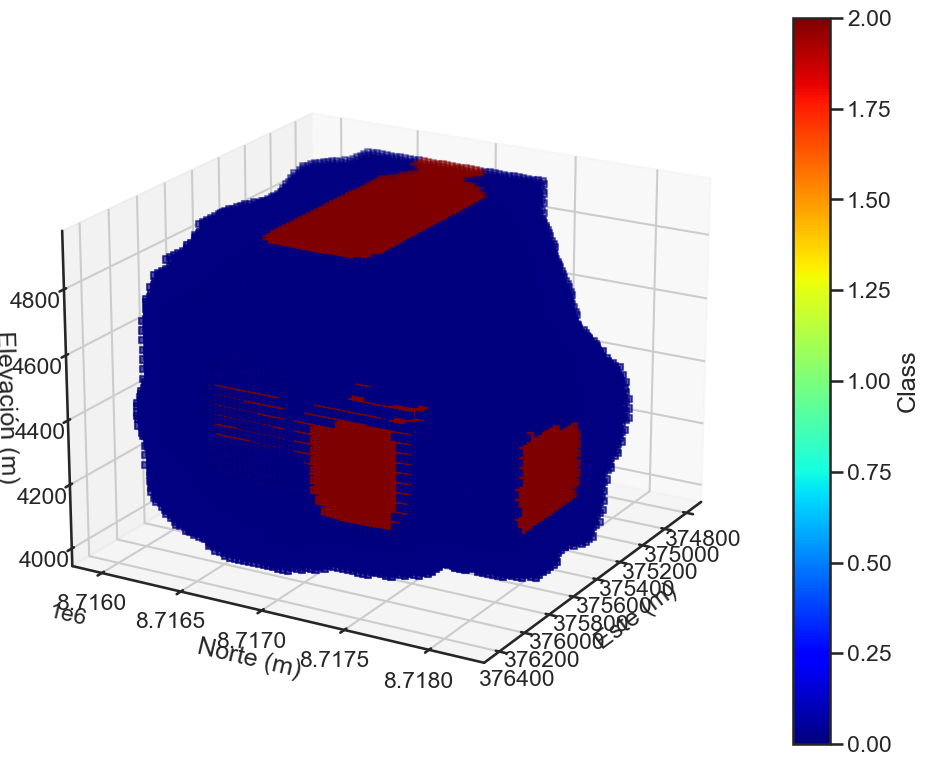

In [192]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df2['X'], df2['Y'], df2['Z'], c=df2['Categoria_suavizada'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoriaS_AMM.jpg", dpi=600)

plt.show()

In [193]:
bd=pd.read_csv('sondajesA.csv')

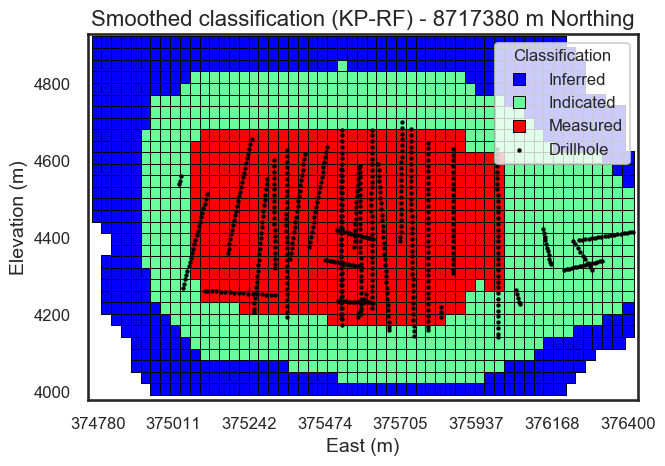

In [194]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicated"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df2['Categoria_label'] = df2['Categoria_suavizada'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df2_corte_y = df2[df2['Y'] == corte_y]

# Verificar si hay datos para el corte
if df2_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 80  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df2_corte_y["X"], 
        y=df2_corte_y["Z"], 
        hue=df2_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

   # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'Smoothed classification (KP-RF) - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("KP-RFFsuavizado.jpg", dpi=800)
    plt.show()


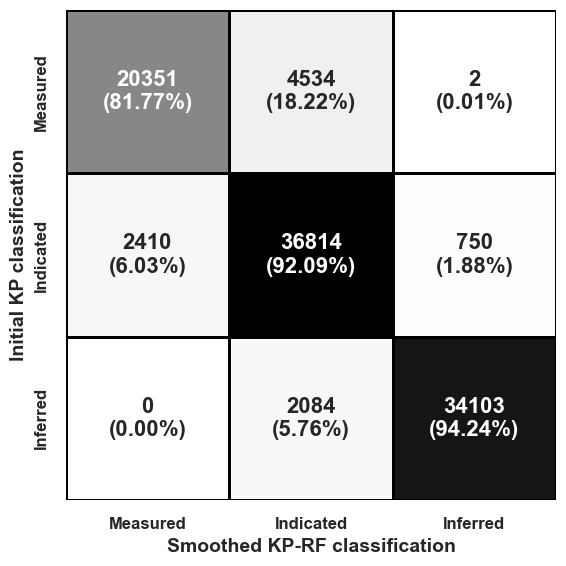

In [195]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df2["Categoria"], df2["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KP-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("QP_RF suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()


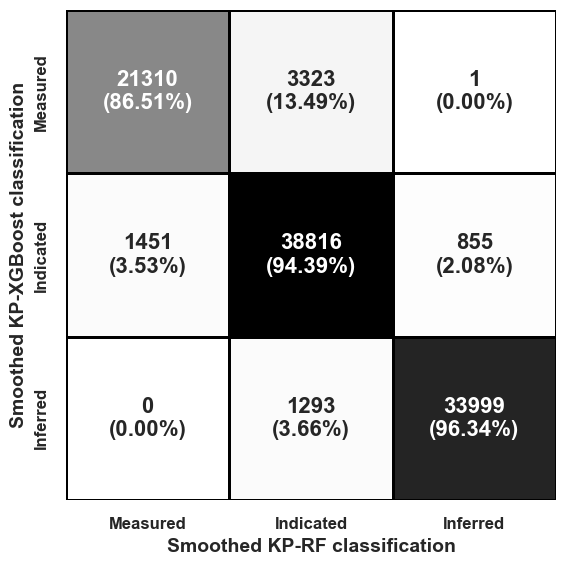

In [196]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df1["Categoria_suavizada"], df2["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KP-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-XGBoost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("XGBOOSTT_RF suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [197]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df2["Categoria_suavizada"].value_counts()

# Mostrar los resultados
print(categoria_counts)

Categoria_suavizada
2    43432
0    34855
1    22761
Name: count, dtype: int64


In [198]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Tomar una muestra de 10,000 registros de df01 para optimizar tiempo de cómputo
df_sample = df2.iloc[:10000]

# Asegurar que la columna 'Categoria' y 'Categoria_suavizada' no tengan valores nulos
df_sample = df_sample[df_sample["Categoria"].notnull() & df_sample["Categoria_suavizada"].notnull()]

# Normalizar las coordenadas espaciales
scaler = StandardScaler()
X_sample_scaled = scaler.fit_transform(df_sample[["X", "Y", "Z"]])

# Aplicar PCA para reducir dimensiones a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sample_scaled)

# Calcular el Silhouette Score antes del suavizado
silhouette_before = silhouette_score(X_pca, df_sample["Categoria"])

# Calcular el Silhouette Score después del suavizado
silhouette_after = silhouette_score(X_pca, df_sample["Categoria_suavizada"])

# Crear una tabla de comparación
silhouette_comparison = pd.DataFrame({
    "Método": ["Antes del Suavizado", "Después del Suavizado"],
    "Silhouette Score": [silhouette_before, silhouette_after]
})

# Mostrar la tabla
print(silhouette_comparison)

                  Método  Silhouette Score
0    Antes del Suavizado             -0.10
1  Después del Suavizado              0.00


In [199]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluar el modelo en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Calcular la precisión
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba: {accuracy:.2f}")

# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=["Inferidos", "Medidos", "Indicados"]))

# Matriz de confusión
print("Matriz de confusión:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

Precisión en el conjunto de prueba: 0.89
Reporte de clasificación:
              precision    recall  f1-score   support

   Inferidos       0.97      0.93      0.95      7248
     Medidos       0.89      0.81      0.85      4993
   Indicados       0.83      0.91      0.87      7969

    accuracy                           0.89     20210
   macro avg       0.90      0.88      0.89     20210
weighted avg       0.89      0.89      0.89     20210

Matriz de confusión:
[[6749    0  499]
 [   1 4045  947]
 [ 225  514 7230]]


In [200]:
df2.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,0.19,1.34,0.19,1.04,1.08
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.39,5.55,0.39,0.87,0.88
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.05,0.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.64,0.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,0.00,0.88,0.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,0.00,1.23,0.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,1.00,950.16,1.00,2.00,2.00


In [201]:
df2[df2["Categoria_suavizada"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,22761.00,0.44,0.22,0.00,0.29,0.41,0.55,2.03
OK_Lagrangian,22761.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,22761.00,169.06,26.64,116.75,148.43,167.85,187.85,267.43
OK_krig_var,22761.00,0.03,0.01,0.00,0.02,0.03,0.04,0.09
OK_n_samples,22761.00,199.72,3.24,117.00,200.00,200.00,200.00,200.00
X,22761.00,375584.71,281.68,375050.00,375350.00,375590.00,375800.00,376130.00
Y,22761.00,8716982.91,328.62,8716390.00,8716720.00,8716960.00,8717230.00,8717800.00
Z,22761.00,4480.07,159.61,4190.00,4340.00,4460.00,4610.00,4790.00
calidad_code,22761.00,0.69,0.46,0.00,0.00,1.00,1.00,1.00
cov,22761.00,0.76,4.95,0.05,0.30,0.44,0.66,471.04


In [202]:
df2[df2["Categoria_suavizada"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,43432.00,0.31,0.13,0.00,0.24,0.32,0.39,1.15
OK_Lagrangian,43432.00,-0.00,0.00,-0.03,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,43432.00,232.10,29.30,104.39,211.88,229.55,251.19,358.27
OK_krig_var,43432.00,0.07,0.02,0.00,0.06,0.08,0.09,0.11
OK_n_samples,43432.00,135.79,53.79,12.00,88.00,136.00,200.00,200.00
X,43432.00,375659.55,432.70,374780.00,375320.00,375710.00,376040.00,376400.00
Y,43432.00,8717025.45,558.63,8715970.00,8716540.00,8716990.00,8717500.00,8718160.00
Z,43432.00,4441.89,243.57,4010.00,4220.00,4430.00,4640.00,4910.00
calidad_code,43432.00,0.08,0.28,0.00,0.00,0.00,0.00,1.00
cov,43432.00,1.24,4.99,0.07,0.70,0.86,1.12,663.62


In [203]:
df2[df2["Categoria_suavizada"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,34855.00,0.29,0.12,0.00,0.21,0.29,0.36,1.06
OK_Lagrangian,34855.00,-0.03,0.02,-0.08,-0.03,-0.02,-0.01,-0.00
OK_average_sample_distance,34855.00,280.17,54.88,117.95,239.33,275.24,316.16,442.94
OK_krig_var,34855.00,0.11,0.02,0.05,0.09,0.10,0.12,0.17
OK_n_samples,34855.00,24.61,20.00,1.00,8.00,20.00,36.00,138.00
X,34855.00,375567.01,515.16,374780.00,375080.00,375500.00,376100.00,376400.00
Y,34855.00,8716959.37,711.31,8715970.00,8716270.00,8716930.00,8717620.00,8718160.00
Z,34855.00,4415.89,296.11,4010.00,4130.00,4400.00,4700.00,4910.00
calidad_code,34855.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
cov,34855.00,1.85,6.47,0.38,0.90,1.13,1.56,950.16


### Calcular tonelaje para cada bloque: 30x30x30= 27 000 m3
#27 000 m3 * 2.3 =62 100 t por cada bloque
### en medidos (1): 22761 bloques *62 100 t = 1413458100; ley=0.44
### en indicados (2): 43432 bloques * 62 100 t= 2697127200; ley=0.31
### en inferidos (0): 34855 bloques* 62 100 t=2164495500; ley=0.29

In [204]:
metal_medido = 1413458100 * (0.44/100) * 0.9
metal_indicado = 2697127200 * (0.31/100) * 0.9
metal_inferido = 2164495500 * (0.29/100) * 0.9

In [205]:
metal_medido

5597294.076

In [206]:
metal_indicado

7524984.887999999

In [207]:
metal_inferido

5649333.255

In [208]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [209]:
print(df2['Categoria'].unique())

[0 2 1]


In [210]:
print(df2.columns)


Index(['OK', 'OK_Lagrangian', 'OK_average_sample_distance', 'OK_krig_var',
       'OK_n_samples', 'X', 'Y', 'Z', 'calidad_code', 'cov', 'confianza',
       'confianza_geo', 'Categoria', 'Categoria_label', 'Categoria_suavizada'],
      dtype='object')


In [211]:
print(df2[['OK_krig_var', 'OK_average_sample_distance', 'OK_n_samples', 'OK']].dtypes)


OK_krig_var                   float64
OK_average_sample_distance    float64
OK_n_samples                  float64
OK                            float64
dtype: object


In [212]:
print(df2['Categoria'].unique())



[0 2 1]


In [213]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [214]:
df_0 = df2[df2['Categoria_suavizada']==1]
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
19996,0.38,-0.00,191.99,0.04,200.00,375500.00,8717170.00,4190.00,0,0.55,0,baja,1,Measured,1
19997,0.23,-0.00,186.53,0.02,200.00,375530.00,8717170.00,4190.00,1,0.58,1,alta,1,Measured,1
19998,0.11,0.00,187.01,0.02,200.00,375560.00,8717170.00,4190.00,1,1.46,1,alta,1,Measured,1
19999,0.07,-0.00,187.16,0.03,200.00,375590.00,8717170.00,4190.00,1,2.38,1,alta,1,Measured,1
20000,0.13,-0.00,185.78,0.04,200.00,375620.00,8717170.00,4190.00,0,1.66,0,baja,1,Measured,1


In [215]:
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
19996,0.38,-0.00,191.99,0.04,200.00,375500.00,8717170.00,4190.00,0,0.55,0,baja,1,Measured,1
19997,0.23,-0.00,186.53,0.02,200.00,375530.00,8717170.00,4190.00,1,0.58,1,alta,1,Measured,1
19998,0.11,0.00,187.01,0.02,200.00,375560.00,8717170.00,4190.00,1,1.46,1,alta,1,Measured,1
19999,0.07,-0.00,187.16,0.03,200.00,375590.00,8717170.00,4190.00,1,2.38,1,alta,1,Measured,1
20000,0.13,-0.00,185.78,0.04,200.00,375620.00,8717170.00,4190.00,0,1.66,0,baja,1,Measured,1


In [216]:
# Contar la cantidad de filas por cada valor único en 'Categoria_s_original'
conteo_por_categoria = df2.groupby('Categoria_suavizada').size()

# Mostrar el resultado
print(conteo_por_categoria)

Categoria_suavizada
0    34855
1    22761
2    43432
dtype: int64


In [217]:
# Calcular el promedio de la variable 'ko' por cada valor único en 'Categoria_s_original'
promedio_por_categoria = df2.groupby('Categoria_suavizada')['OK'].mean()

# Mostrar el resultado
print(promedio_por_categoria)

Categoria_suavizada
0   0.29
1   0.44
2   0.31
Name: OK, dtype: float64


In [218]:
df2["OK"].describe().T

count   101048.00
mean         0.33
std          0.16
min          0.00
25%          0.23
50%          0.32
75%          0.41
max          2.03
Name: OK, dtype: float64

In [219]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [220]:
df2["cov"].median()

0.8807624160775598

In [221]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [222]:
# Crear una nueva columna 'Categoria_n' basada en la columna 'Categoria'
df2['Categoria_n'] = df2['Categoria'].replace({'Inferido': 0, 'Medido': 1, 'Indicado': 2})

# Mostrar las primeras filas para verificar el resultado
df2[['Categoria', 'Categoria_n']].head()


,Categoria,Categoria_n
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [223]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0


In [224]:
# Crear tres nuevos DataFrames según los valores de Categoria_s_original
df_medido = df2[df2['Categoria_n'] == 1].copy()
df_inferido = df2[df2['Categoria_n'] == 0].copy()
df_indicado = df2[df2['Categoria_n'] == 2].copy()

In [225]:
df_medido2 = df2[df2['Categoria_suavizada'] == 1].copy()
df_inferido2 = df2[df2['Categoria_suavizada'] == 0].copy()
df_indicado2 = df2[df2['Categoria_suavizada'] == 2].copy()

In [226]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos11 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos11.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido[df_medido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos11.loc[index, 'Tonelaje'] = tonnage
    intervalos11.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos11['Tonelaje'] = (intervalos11['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos11)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1460281.50    0.45
1           0.20 1327884.30    0.47
2           0.30 1090413.90    0.52
3           0.40  773517.60    0.59
4           0.50  483075.90    0.68
5           0.60  279636.30    0.78
6           0.70  164254.50    0.87
7           0.80   97683.30    0.95
8           0.90   54834.30    1.04
9           1.00   29124.90    1.12


In [227]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos00 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos00.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido[df_inferido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos00.loc[index, 'Tonelaje'] = tonnage
    intervalos00.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos00['Tonelaje'] = (intervalos00['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos00)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2100284.10    0.30
1           0.20 1768794.30    0.33
2           0.30 1010863.80    0.39
3           0.40  342357.30    0.47
4           0.50   61603.20    0.59
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [228]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos22 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos22.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado[df_indicado['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos22.loc[index, 'Tonelaje'] = tonnage
    intervalos22.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos22['Tonelaje'] = (intervalos22['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos22)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2351664.90    0.33
1           0.20 2054826.90    0.35
2           0.30 1430970.30    0.39
3           0.40  533563.20    0.47
4           0.50  125379.90    0.59
5           0.60   43842.60    0.69
6           0.70   16332.30    0.78
7           0.80    4595.40    0.87
8           0.90    1242.00    0.95
9           1.00     186.30    1.04


In [229]:
intervalos00.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,531544.95,806750.00,621.00,5402.70,38719.35,843737.17,2100284.10
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [230]:
df_medido2 = df2[df2['Categoria_suavizada'] == 1].copy()
df_inferido2 = df2[df2['Categoria_suavizada'] == 0].copy()
df_indicado2 = df2[df2['Categoria_suavizada'] == 2].copy()

In [231]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos0 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos0.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido2[df_inferido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos0.loc[index, 'Tonelaje'] = tonnage
    intervalos0.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos0['Tonelaje'] = (intervalos0['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos0)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2023155.90    0.30
1           0.20 1700794.80    0.33
2           0.30  959320.80    0.39
3           0.40  327825.90    0.47
4           0.50   60547.50    0.60
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [232]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos1 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos1.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido2[df_medido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos1.loc[index, 'Tonelaje'] = tonnage
    intervalos1.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos1['Tonelaje'] = (intervalos1['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos1)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1358002.80    0.45
1           0.20 1244297.70    0.48
2           0.30 1033344.00    0.52
3           0.40  735574.50    0.59
4           0.50  460719.90    0.68
5           0.60  268582.50    0.78
6           0.70  158106.60    0.87
7           0.80   94640.40    0.96
8           0.90   53281.80    1.04
9           1.00   28441.80    1.12


In [233]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos2 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos2.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado2[df_indicado2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos2.loc[index, 'Tonelaje'] = tonnage
    intervalos2.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos2['Tonelaje'] = (intervalos2['Tonelaje'] * 30 * 30 * 30 * 2.3)/1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos2)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2531071.80    0.33
1           0.20 2206413.00    0.36
2           0.30 1539583.20    0.40
3           0.40  586037.70    0.48
4           0.50  148791.60    0.60
5           0.60   54896.40    0.70
6           0.70   22480.20    0.79
7           0.80    7638.30    0.89
8           0.90    2794.50    0.98
9           1.00     869.40    1.08


In [234]:
intervalos0.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,510319.17,775555.23,621.00,5402.70,38191.50,801447.07,2023155.90
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [235]:
intervalos1.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,543499.20,513095.83,28441.80,110506.95,364651.20,958901.62,1358002.80
Cu (%),10.00,0.75,0.24,0.45,0.54,0.73,0.93,1.12


In [236]:
intervalos2.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,710057.61,998456.93,869.40,11348.77,101844.00,1301196.82,2531071.80
Cu (%),10.00,0.66,0.27,0.33,0.42,0.65,0.87,1.08


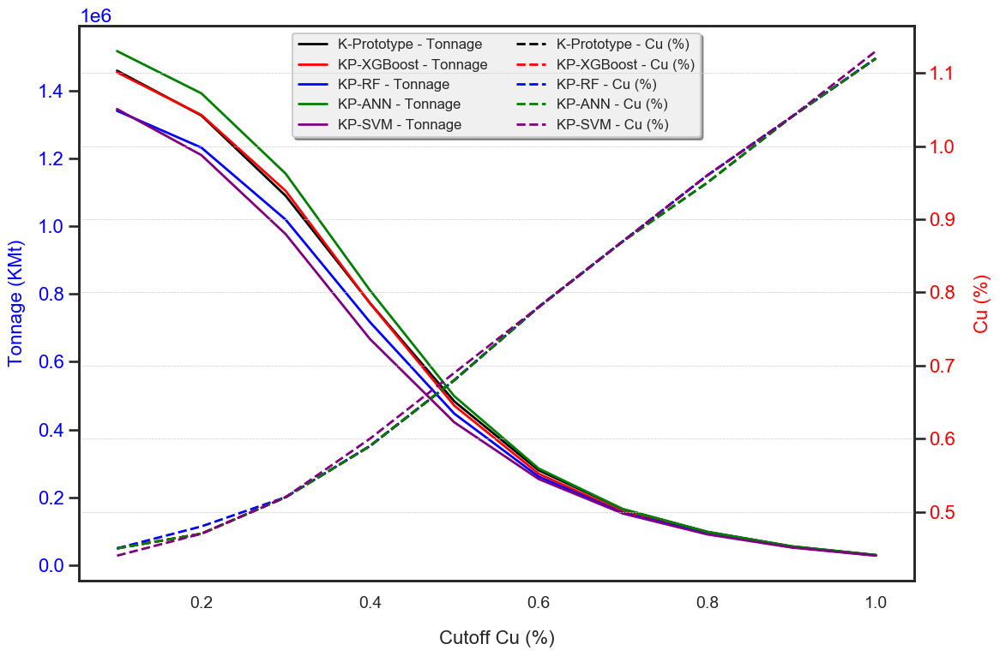

In [237]:
import matplotlib.pyplot as plt
import pandas as pd

# Data for Original, XGBoost, RF, and ANN models
data_original = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1460281.5, 1327884.3, 1090413.9, 773517.6, 483075.9, 279636.3, 164254.5, 97683.3, 54834.3, 29124.9],
    "Cu (%)": [0.45, 0.47, 0.52, 0.59, 0.68, 0.78, 0.87, 0.95, 1.04, 1.12],
}
data_xgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1455437.7, 1329623.1, 1105069.5, 773020.8, 470655.9, 269389.8, 157050.9, 93833.1, 52909.2, 28441.8],
    "Cu (%)": [0.45, 0.47, 0.52, 0.59, 0.68, 0.78, 0.87, 0.96, 1.04, 1.12],
}
data_rf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1341732.6, 1232995.5, 1020116.7, 717255.0, 446933.7, 260882.1, 153449.1, 92777.4, 52598.7, 28193.4],
    "Cu (%)": [0.45, 0.48, 0.52, 0.59, 0.68, 0.78, 0.87, 0.96, 1.04, 1.12],
}
data_ann = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1518220.8, 1393337.7, 1155929.4, 811274.4, 498414.6, 284914.8, 164999.7, 97621.2, 54772.2, 28938.6],
    "Cu (%)": [0.45, 0.47, 0.52, 0.59, 0.68, 0.78, 0.87, 0.95, 1.04, 1.12],
}

# Datos para SVM
data_svm = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1346886.9, 1210825.8, 977267.7, 667326.6, 421286.4, 253678.5, 151648.2, 90107.1, 51294.6, 27199.8],
    "Cu (%)": [0.44, 0.47, 0.52, 0.60, 0.69, 0.78, 0.87, 0.96, 1.04, 1.13],
}

# Convertir los datos a DataFrames
df_original = pd.DataFrame(data_original)
df_xgboost = pd.DataFrame(data_xgboost)
df_rf = pd.DataFrame(data_rf)
df_ann = pd.DataFrame(data_ann)
df_svm = pd.DataFrame(data_svm)  # Nuevo DataFrame para SVM

# Crear la figura
fig, ax1 = plt.subplots(figsize=(12, 8))

# Graficar el tonelaje para todos los modelos
ax1.plot(df_original["Cutoff Cu (%)"], df_original["Tonelaje"], color="black", linestyle="-", linewidth=2, label="K-Prototype - Tonnage")
ax1.plot(df_xgboost["Cutoff Cu (%)"], df_xgboost["Tonelaje"], color="red", linestyle="-", linewidth=2, label="KP-XGBoost - Tonnage")
ax1.plot(df_rf["Cutoff Cu (%)"], df_rf["Tonelaje"], color="blue", linestyle="-", linewidth=2, label="KP-RF - Tonnage")
ax1.plot(df_ann["Cutoff Cu (%)"], df_ann["Tonelaje"], color="green", linestyle="-", linewidth=2, label="KP-ANN - Tonnage")
ax1.plot(df_svm["Cutoff Cu (%)"], df_svm["Tonelaje"], color="purple", linestyle="-", linewidth=2, label="KP-SVM - Tonnage")  # Nueva curva SVM

ax1.set_xlabel("Cutoff Cu (%)", fontsize=16, labelpad=16)
ax1.set_ylabel("Tonnage (KMt)", color="blue", fontsize=16, labelpad=10)
ax1.tick_params(axis="y", labelcolor="blue", labelsize=16)
ax1.tick_params(axis="x", labelsize=14)

# Graficar el porcentaje de cobre en un eje Y secundario
ax2 = ax1.twinx()
ax2.plot(df_original["Cutoff Cu (%)"], df_original["Cu (%)"], color="black", linestyle="--", linewidth=2, label="K-Prototype - Cu (%)")
ax2.plot(df_xgboost["Cutoff Cu (%)"], df_xgboost["Cu (%)"], color="red", linestyle="--", linewidth=2, label="KP-XGBoost - Cu (%)")
ax2.plot(df_rf["Cutoff Cu (%)"], df_rf["Cu (%)"], color="blue", linestyle="--", linewidth=2, label="KP-RF - Cu (%)")
ax2.plot(df_ann["Cutoff Cu (%)"], df_ann["Cu (%)"], color="green", linestyle="--", linewidth=2, label="KP-ANN - Cu (%)")
ax2.plot(df_svm["Cutoff Cu (%)"], df_svm["Cu (%)"], color="purple", linestyle="--", linewidth=2, label="KP-SVM - Cu (%)")  # Nueva curva SVM

ax2.set_ylabel("Cu (%)", color="red", fontsize=16, labelpad=16)
ax2.tick_params(axis="y", labelcolor="red", labelsize=16)

# Configurar la leyenda
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
legend = ax1.legend(
    lines1 + lines2, 
    labels1 + labels2, 
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.0),  
    ncol=2, 
    fontsize=12, 
    frameon=True, 
    shadow=True
)
legend.get_frame().set_facecolor('#f0f0f0')  # Fondo gris claro
legend.get_frame().set_alpha(1)  # Transparencia

# Título y cuadrícula
plt.title("", fontsize=16, pad=20)
plt.grid(visible=True, linestyle="--", linewidth=0.5)

# Ajustar el diseño
plt.tight_layout()

# Guardar la figura
plt.savefig('medidosKPROTOTYPE.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


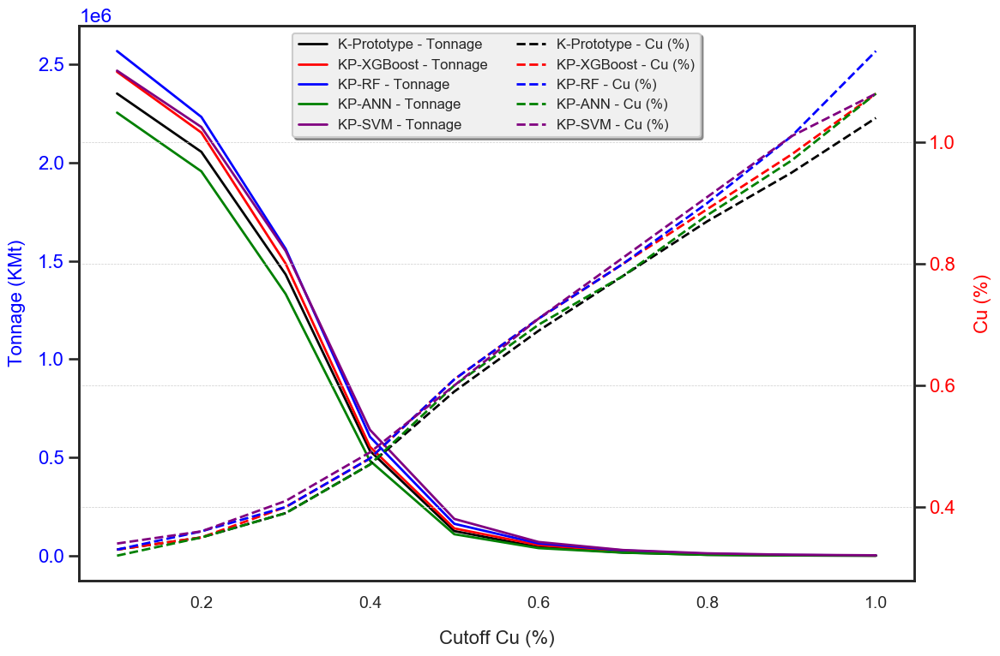

In [262]:
import matplotlib.pyplot as plt
import pandas as pd

# Data for Original, XGBoost, RF, and ANN models
data_original = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2351664.9, 2054826.9, 1430970.3,533563.2, 125379.9, 43842.6, 16332.3, 4595.4,1242, 186.3],
    "Cu (%)": [0.33, 0.35, 0.39, 0.47, 0.59, 0.69, 0.78, 0.87, 0.95, 1.04],
}
data_xgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2462078.7, 2152882.8,1486053, 554242.5, 139166.1, 54089.1,23535.9,8445.6, 3167.1, 869.4],
    "Cu (%)": [0.33, 0.35, 0.40, 0.48, 0.61, 0.71, 0.80, 0.89, 0.98, 1.08],
}
data_rf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2567648.7, 2232432.9,1561256.1, 604854, 162391.5, 62596.8, 27137.7, 9501.3,3477.6, 1117.8  ],
    "Cu (%)": [0.33, 0.36, 0.40, 0.48, 0.61, 0.71, 0.80, 0.90, 1.01, 1.15],
}
data_ann = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2254354.2,1955715.3, 1331610.3, 482889.6, 109420.2,38564.1,  15587.1,4657.5, 1304.1, 372.6  ],
    "Cu (%)": [0.32, 0.35, 0.39, 0.47, 0.60, 0.70, 0.78, 0.88, 0.97, 1.08],
}

# Datos para SVM
data_svm = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2467978.2, 2181262.5, 1550699.1,640437.3, 187293.6,  69800.4,28938.6,12171.6, 4781.7, 2111.4 ],
    "Cu (%)": [0.34, 0.36, 0.41, 0.49, 0.60, 0.71, 0.81, 0.91, 1.01, 1.08],
}

# Convertir los datos a DataFrames
df_original = pd.DataFrame(data_original)
df_xgboost = pd.DataFrame(data_xgboost)
df_rf = pd.DataFrame(data_rf)
df_ann = pd.DataFrame(data_ann)
df_svm = pd.DataFrame(data_svm)  # Nuevo DataFrame para SVM

# Crear la figura
fig, ax1 = plt.subplots(figsize=(12, 8))

# Graficar el tonelaje para todos los modelos
ax1.plot(df_original["Cutoff Cu (%)"], df_original["Tonelaje"], color="black", linestyle="-", linewidth=2, label="K-Prototype - Tonnage")
ax1.plot(df_xgboost["Cutoff Cu (%)"], df_xgboost["Tonelaje"], color="red", linestyle="-", linewidth=2, label="KP-XGBoost - Tonnage")
ax1.plot(df_rf["Cutoff Cu (%)"], df_rf["Tonelaje"], color="blue", linestyle="-", linewidth=2, label="KP-RF - Tonnage")
ax1.plot(df_ann["Cutoff Cu (%)"], df_ann["Tonelaje"], color="green", linestyle="-", linewidth=2, label="KP-ANN - Tonnage")
ax1.plot(df_svm["Cutoff Cu (%)"], df_svm["Tonelaje"], color="purple", linestyle="-", linewidth=2, label="KP-SVM - Tonnage")  # Nueva curva SVM

ax1.set_xlabel("Cutoff Cu (%)", fontsize=16, labelpad=16)
ax1.set_ylabel("Tonnage (KMt)", color="blue", fontsize=16, labelpad=10)
ax1.tick_params(axis="y", labelcolor="blue", labelsize=16)
ax1.tick_params(axis="x", labelsize=14)

# Graficar el porcentaje de cobre en un eje Y secundario
ax2 = ax1.twinx()
ax2.plot(df_original["Cutoff Cu (%)"], df_original["Cu (%)"], color="black", linestyle="--", linewidth=2, label="K-Prototype - Cu (%)")
ax2.plot(df_xgboost["Cutoff Cu (%)"], df_xgboost["Cu (%)"], color="red", linestyle="--", linewidth=2, label="KP-XGBoost - Cu (%)")
ax2.plot(df_rf["Cutoff Cu (%)"], df_rf["Cu (%)"], color="blue", linestyle="--", linewidth=2, label="KP-RF - Cu (%)")
ax2.plot(df_ann["Cutoff Cu (%)"], df_ann["Cu (%)"], color="green", linestyle="--", linewidth=2, label="KP-ANN - Cu (%)")
ax2.plot(df_svm["Cutoff Cu (%)"], df_svm["Cu (%)"], color="purple", linestyle="--", linewidth=2, label="KP-SVM - Cu (%)")  # Nueva curva SVM

ax2.set_ylabel("Cu (%)", color="red", fontsize=16, labelpad=16)
ax2.tick_params(axis="y", labelcolor="red", labelsize=16)

# Configurar la leyenda
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
legend = ax1.legend(
    lines1 + lines2, 
    labels1 + labels2, 
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.0),  
    ncol=2, 
    fontsize=12, 
    frameon=True, 
    shadow=True
)
legend.get_frame().set_facecolor('#f0f0f0')  # Fondo gris claro
legend.get_frame().set_alpha(1)  # Transparencia

# Título y cuadrícula
plt.title("", fontsize=16, pad=20)
plt.grid(visible=True, linestyle="--", linewidth=0.5)

# Ajustar el diseño
plt.tight_layout()

# Guardar la figura
plt.savefig('indicadosKPROTOTYPE.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


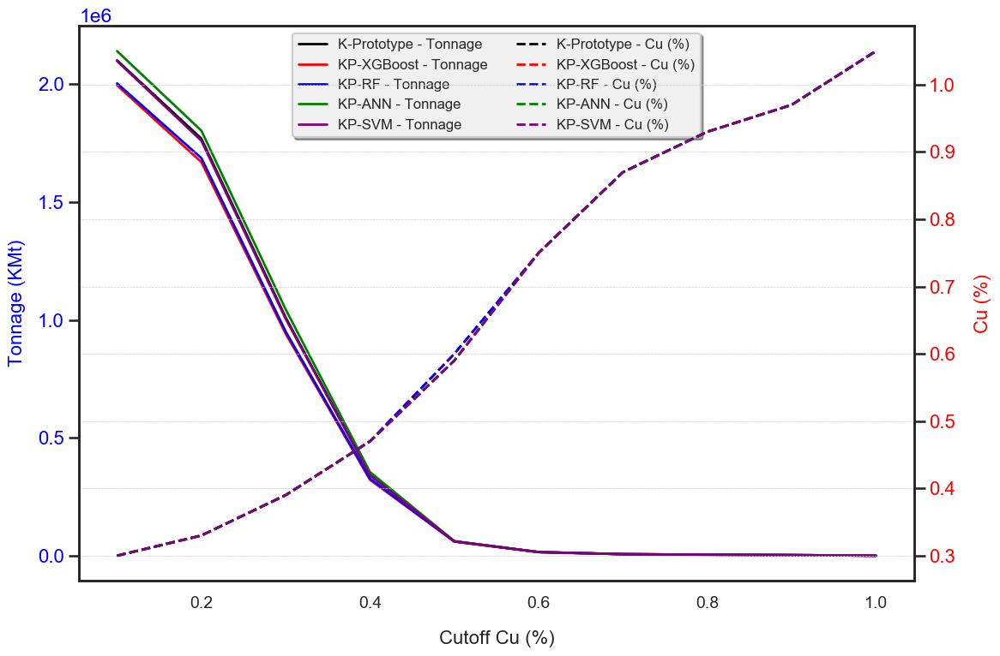

In [263]:
import matplotlib.pyplot as plt
import pandas as pd

# Data for Original, XGBoost, RF, and ANN models
data_original = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2100284.1, 1768794.3, 1010863.8, 342357.3,61603.2,15835.5,7079.4, 4843.8, 3167.1, 621  ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_xgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1994714.1,1668999.6, 941125.5, 322174.8,60237, 15835.5,7079.4, 4843.8,3167.1, 621 ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_rf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2002849.2,1686077.1, 950875.2, 327329.1,60733.8, 15835.5,7079.4, 4843.8, 3167.1, 621],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_ann = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2139655.5, 1802452.5,1044708.3, 355274.1, 62224.2,15835.5,  7079.4, 4843.8, 3167.1,  621 ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}

# Datos para SVM
data_svm = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2097365.4, 1759417.2, 1004281.2,341674.2, 61479, 15835.5,  7079.4, 4843.8,3167.1,621  ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}

# Convertir los datos a DataFrames
df_original = pd.DataFrame(data_original)
df_xgboost = pd.DataFrame(data_xgboost)
df_rf = pd.DataFrame(data_rf)
df_ann = pd.DataFrame(data_ann)
df_svm = pd.DataFrame(data_svm)  # Nuevo DataFrame para SVM

# Crear la figura
fig, ax1 = plt.subplots(figsize=(12, 8))

# Graficar el tonelaje para todos los modelos
ax1.plot(df_original["Cutoff Cu (%)"], df_original["Tonelaje"], color="black", linestyle="-", linewidth=2, label="K-Prototype - Tonnage")
ax1.plot(df_xgboost["Cutoff Cu (%)"], df_xgboost["Tonelaje"], color="red", linestyle="-", linewidth=2, label="KP-XGBoost - Tonnage")
ax1.plot(df_rf["Cutoff Cu (%)"], df_rf["Tonelaje"], color="blue", linestyle="-", linewidth=2, label="KP-RF - Tonnage")
ax1.plot(df_ann["Cutoff Cu (%)"], df_ann["Tonelaje"], color="green", linestyle="-", linewidth=2, label="KP-ANN - Tonnage")
ax1.plot(df_svm["Cutoff Cu (%)"], df_svm["Tonelaje"], color="purple", linestyle="-", linewidth=2, label="KP-SVM - Tonnage")  # Nueva curva SVM

ax1.set_xlabel("Cutoff Cu (%)", fontsize=16, labelpad=16)
ax1.set_ylabel("Tonnage (KMt)", color="blue", fontsize=16, labelpad=10)
ax1.tick_params(axis="y", labelcolor="blue", labelsize=16)
ax1.tick_params(axis="x", labelsize=14)

# Graficar el porcentaje de cobre en un eje Y secundario
ax2 = ax1.twinx()
ax2.plot(df_original["Cutoff Cu (%)"], df_original["Cu (%)"], color="black", linestyle="--", linewidth=2, label="K-Prototype - Cu (%)")
ax2.plot(df_xgboost["Cutoff Cu (%)"], df_xgboost["Cu (%)"], color="red", linestyle="--", linewidth=2, label="KP-XGBoost - Cu (%)")
ax2.plot(df_rf["Cutoff Cu (%)"], df_rf["Cu (%)"], color="blue", linestyle="--", linewidth=2, label="KP-RF - Cu (%)")
ax2.plot(df_ann["Cutoff Cu (%)"], df_ann["Cu (%)"], color="green", linestyle="--", linewidth=2, label="KP-ANN - Cu (%)")
ax2.plot(df_svm["Cutoff Cu (%)"], df_svm["Cu (%)"], color="purple", linestyle="--", linewidth=2, label="KP-SVM - Cu (%)")  # Nueva curva SVM

ax2.set_ylabel("Cu (%)", color="red", fontsize=16, labelpad=16)
ax2.tick_params(axis="y", labelcolor="red", labelsize=16)

# Configurar la leyenda
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
legend = ax1.legend(
    lines1 + lines2, 
    labels1 + labels2, 
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.0),  
    ncol=2, 
    fontsize=12, 
    frameon=True, 
    shadow=True
)
legend.get_frame().set_facecolor('#f0f0f0')  # Fondo gris claro
legend.get_frame().set_alpha(1)  # Transparencia

# Título y cuadrícula
plt.title("", fontsize=16, pad=20)
plt.grid(visible=True, linestyle="--", linewidth=0.5)

# Ajustar el diseño
plt.tight_layout()

# Guardar la figura
plt.savefig('inferidosKPROTOTYPE.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


### KMEANS

In [238]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from kmodes.kprototypes import KPrototypes
import kmodes.util 
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.preprocessing import PowerTransformer
import pandas as pd
import seaborn as sns
import plotly.express as px

plt.style.use("_classic_test_patch")

df = pd.read_csv("Bdfinal.csv", sep=",")
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples
0,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN


In [239]:
grid_x = np.linspace(374780,376430, num=55, endpoint=False) #Coord. de origen x, coord. de termino x, nª de celdas x.
grid_y = np.linspace(8715970,8718190, num=74, endpoint=False) #Coord. de origen y, coord. de termino y, nª de celdas y.
grid_z = np.linspace(4010,4940, num=31, endpoint=False) #Coord. de origen x, coord. de termino y, nª de celdas z.

zg, yg, xg = np.meshgrid(grid_z, grid_y, grid_x, indexing='ij')

z_g = zg.ravel()
x_g = xg.ravel()
y_g = yg.ravel()

d = {'X': x_g, 'Y': y_g, "Z": z_g}
df1 = pd.DataFrame(data=d) #Creación del dataframe 
       
df["X"] = df1["X"]
df["Y"] = df1["Y"]
df["Z"] = df1["Z"]

df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z
0,NaN,NaN,NaN,NaN,NaN,374780.00,8715970.00,4010.00
1,NaN,NaN,NaN,NaN,NaN,374810.00,8715970.00,4010.00
2,NaN,NaN,NaN,NaN,NaN,374840.00,8715970.00,4010.00
3,NaN,NaN,NaN,NaN,NaN,374870.00,8715970.00,4010.00
4,NaN,NaN,NaN,NaN,NaN,374900.00,8715970.00,4010.00


In [240]:
df.loc[df["OK"] < 0.00, "OK"] = -99
df.replace(-99, np.nan, inplace=True)
df= df.dropna()
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00


In [241]:
import pandas as pd
from sklearn.preprocessing import PowerTransformer
from sklearn.cluster import KMeans

# Crear una copia del DataFrame original
df_copy = df.copy()

# Seleccionar las variables deseadas (solo continuas)
variables_deseadas = ["OK_average_sample_distance", "OK_krig_var", "OK_n_samples"]

# Crear un nuevo DataFrame con las variables deseadas
nuevo_df1 = df_copy[variables_deseadas].copy()

# Aplicar PowerTransformer a las variables continuas
pt = PowerTransformer()
X_transformed = pt.fit_transform(nuevo_df1)

# Crear un nuevo DataFrame con los datos transformados
nuevo_df = pd.DataFrame(X_transformed, columns=variables_deseadas)

# Aplicar K-Means
kmeans = KMeans(n_clusters=3, init='k-means++', n_init=10, random_state=17276365)
clusters_kmeans = kmeans.fit_predict(nuevo_df)


# Agregar la asignación de clusters al DataFrame original
df_copy["Categoria"] = clusters_kmeans
# Mostrar las primeras filas del DataFrame con la nueva columna de clusters
df_copy.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,1
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,1
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,1
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,1
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,1


In [242]:
df_copy.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,1
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,1
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,1
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,1
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,1


In [243]:
#df_copy.to_csv("K-MEANS.csv", index=False, encoding="utf-8")


In [244]:
df_copy=pd.read_csv("K-MEANS.csv")

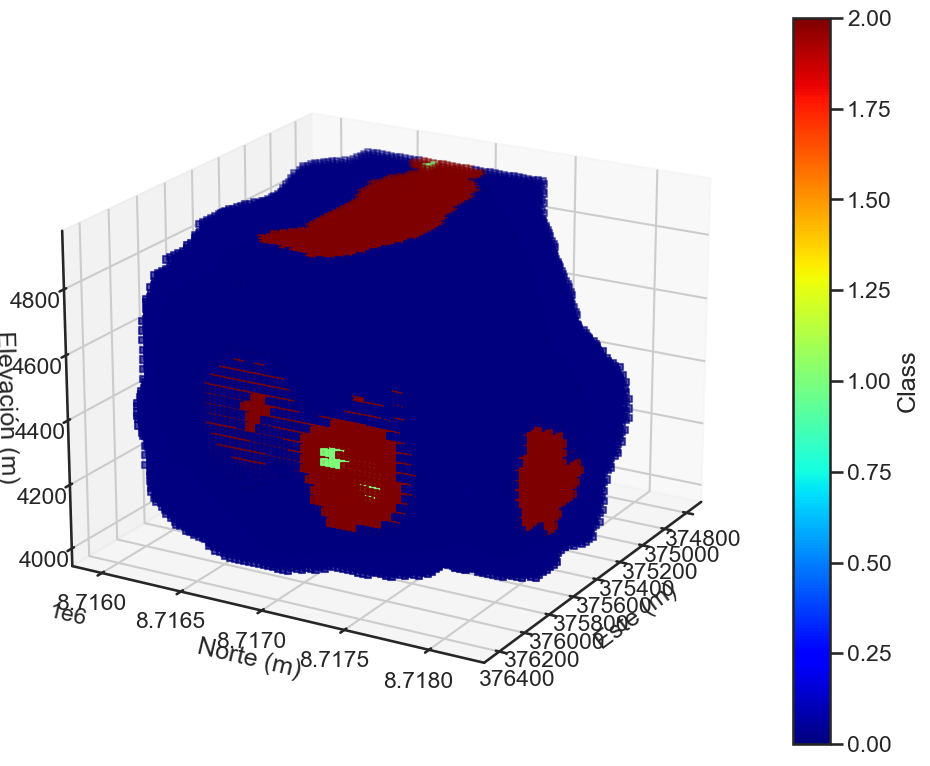

In [245]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df_copy['X'], df_copy['Y'], df_copy['Z'], c=df_copy['Categoria'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoria.jpg", dpi=600)

plt.show()

In [246]:
bd=pd.read_csv('sondajesA.csv')

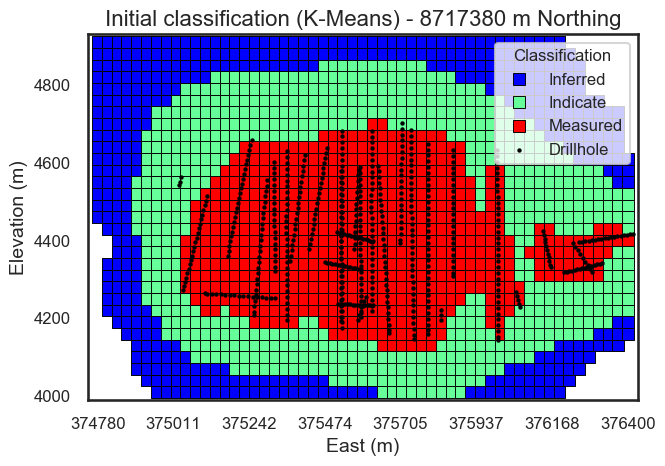

In [247]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicate"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df_copy['Categoria_label'] = df_copy['Categoria'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df_copy_corte_y = df_copy[df_copy['Y'] == corte_y]

# Verificar si hay datos para el corte
if df_copy_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 70  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df_copy_corte_y["X"], 
        y=df_copy_corte_y["Z"], 
        hue=df_copy_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

    # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3990, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'Initial classification (K-Means) - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("KM_Inicial.jpg", dpi=800)
    plt.show()


In [248]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df_copy["Categoria"].value_counts()

# Mostrar los resultados
print(categoria_counts)

Categoria
2    39321
0    32932
1    28795
Name: count, dtype: int64


In [249]:
df11 = df_copy.copy()

In [250]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred


### XGBoost

In [251]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score

# Configuración de datos
X = df11[['X', 'Y', 'Z']]  # Variables independientes
y = df11['Categoria']      # Variable dependiente (Categoría)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos con StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Configuración del modelo XGBoost
xgb_model = XGBClassifier(
    objective='multi:softmax',    # Clasificación multicategoría
    num_class=3,                 # Tres categorías: Medido, Indicado, Inferido
    random_state=42,             # Semilla aleatoria para reproducibilidad
    use_label_encoder=False,     # No usar codificador de etiquetas obsoleto
    eval_metric='mlogloss',      # Métrica de pérdida logarítmica multicategoría
    max_depth=7,                 # Mayor profundidad para capturar patrones
    learning_rate=0.1,          # Tasa de aprendizaje ajustada
    n_estimators=200,            # Número de árboles para mejorar el ajuste
    min_child_weight=5,          # Permitir más divisiones en nodos
    subsample=0.7,               # Submuestreo para cada árbol
    colsample_bytree=0.7,        # Submuestreo de características por árbol
    gamma=1.0                    # Regularización para evitar sobreajuste
)
# Entrenar el modelo con los datos de entrenamiento
xgb_model.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred_test = xgb_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"Exactitud en el conjunto de prueba: {test_accuracy:.2f}")

# Predicciones suavizadas en el conjunto original
X_original = df11[['X', 'Y', 'Z']]
X_original = scaler.transform(X_original)  # Normalizar el conjunto original
df11['Categoria_suavizada'] = xgb_model.predict(X_original)

# Mostrar las primeras filas del DataFrame con predicciones suavizadas
print(df11.head())

Exactitud en el conjunto de prueba: 0.92
    OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
0 0.05          -0.08                      199.18         0.17             1   
1 0.05          -0.08                      197.46         0.17             1   
2 0.05          -0.08                      200.27         0.17             1   
3 0.05          -0.08                      202.67         0.17             1   
4 0.05          -0.08                      196.45         0.17             1   

        X        Y     Z  Categoria Categoria_label  Categoria_suavizada  
0  375890  8715970  4010          0        Inferred                    0  
1  375920  8715970  4010          0        Inferred                    0  
2  375950  8715970  4010          0        Inferred                    0  
3  375860  8716000  4010          0        Inferred                    0  
4  375890  8716000  4010          0        Inferred                    0  


In [252]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [253]:
df11.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
Categoria,101048.00,1.06,0.84,0.00,0.00,1.00,2.00,2.00
Categoria_suavizada,101048.00,1.08,0.84,0.00,0.00,1.00,2.00,2.00


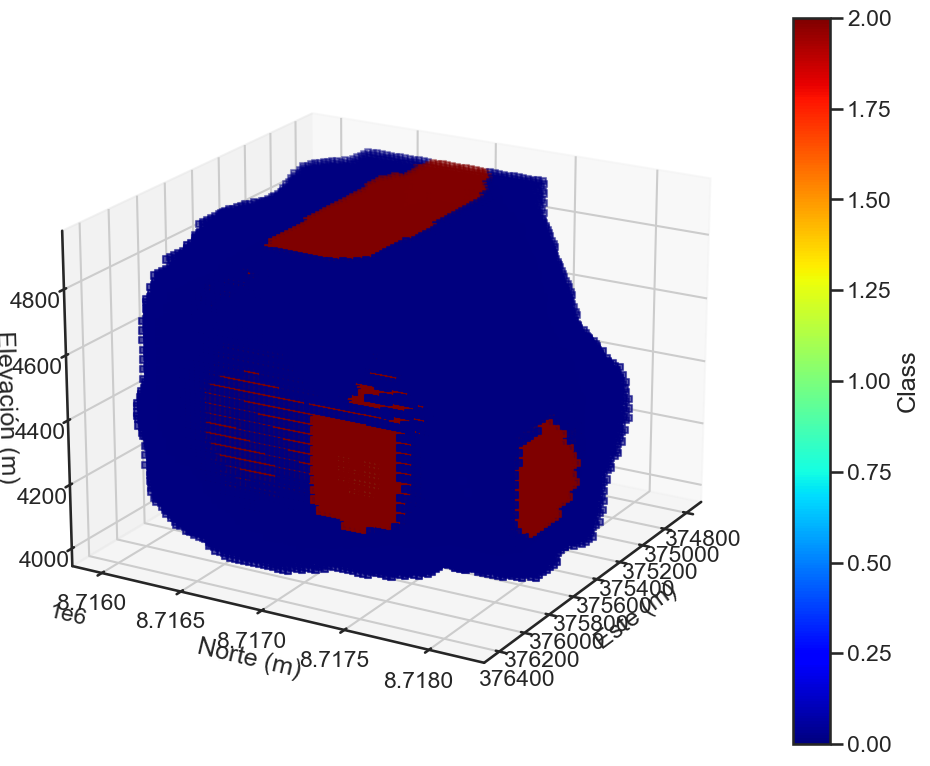

In [254]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df11['X'], df11['Y'], df11['Z'], c=df11['Categoria_suavizada'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoriaS_AMM.jpg", dpi=600)

plt.show()

In [255]:
bd=pd.read_csv('sondajesA.csv')

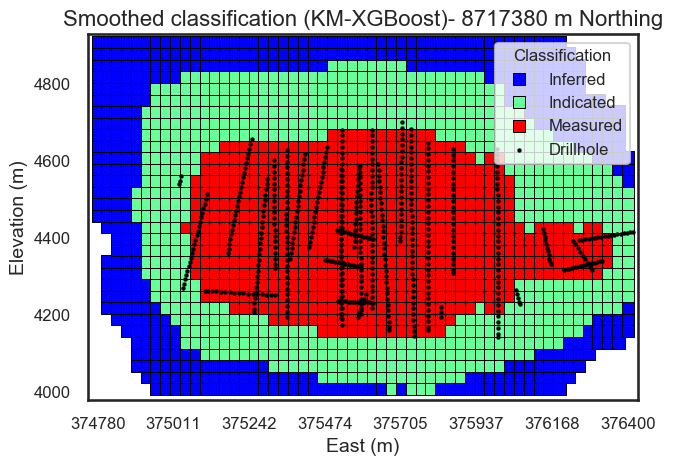

In [256]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicated"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df11['Categoria_label'] = df11['Categoria_suavizada'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df11_corte_y = df11[df11['Y'] == corte_y]

# Verificar si hay datos para el corte
if df11_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 80  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df11_corte_y["X"], 
        y=df11_corte_y["Z"], 
        hue=df11_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

   # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'Smoothed classification (KM-XGBoost)- {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("km_XGboost suavizado.jpg", dpi=800)
    plt.show()

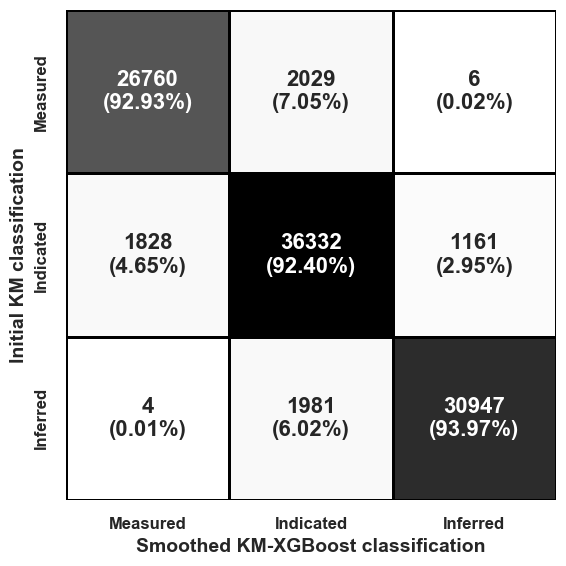

In [257]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df11["Categoria"], df11["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KM-XGBoost classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KM classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("QM_XGboost suavizado vs Initial QM.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()


In [258]:
df00.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


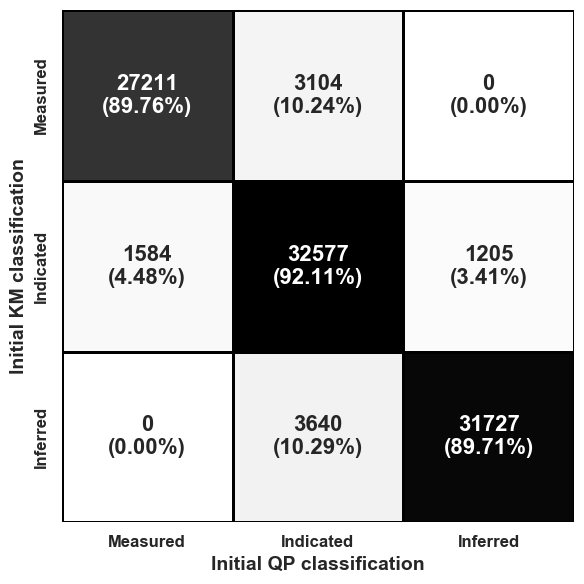

In [371]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df00["Categoria"], df11["Categoria"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Initial QP classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KM classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("QP_KM suavizado vs Initial QM.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()


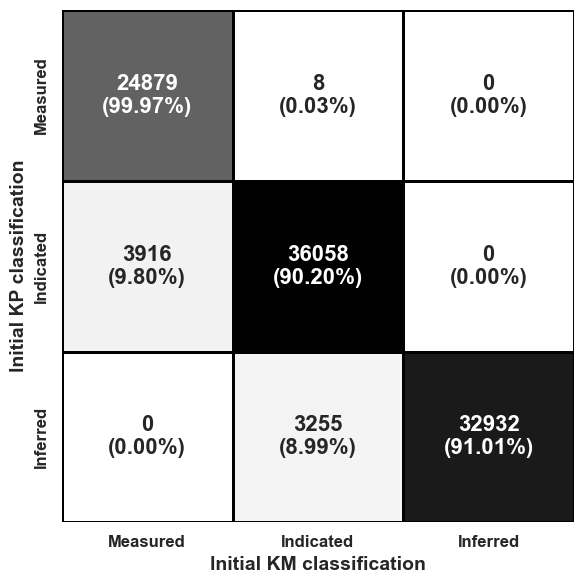

In [402]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df2["Categoria"], df11["Categoria"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Initial KM classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("KP_KM suavizado vs Initial KP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

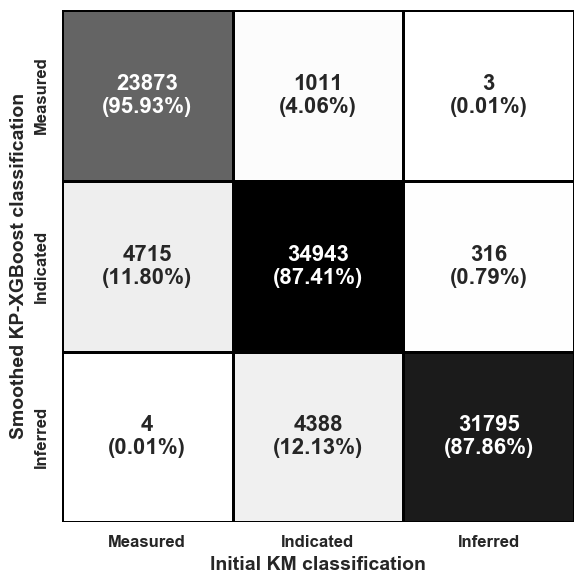

In [403]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df2["Categoria"], df11["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Initial KM classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-XGBoost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("SMOOTHED KM-KP suavizado vs Initial KP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

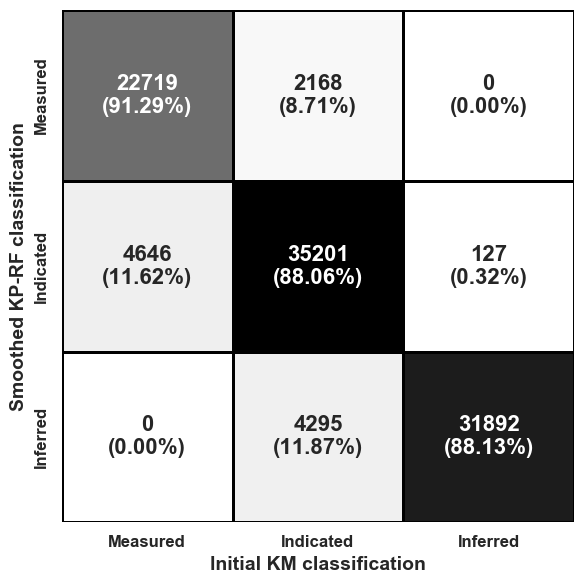

In [404]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df2["Categoria"], df22["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Initial KM classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-RF classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("SMOOTHED KM-KP RFF suavizado vs Initial KP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

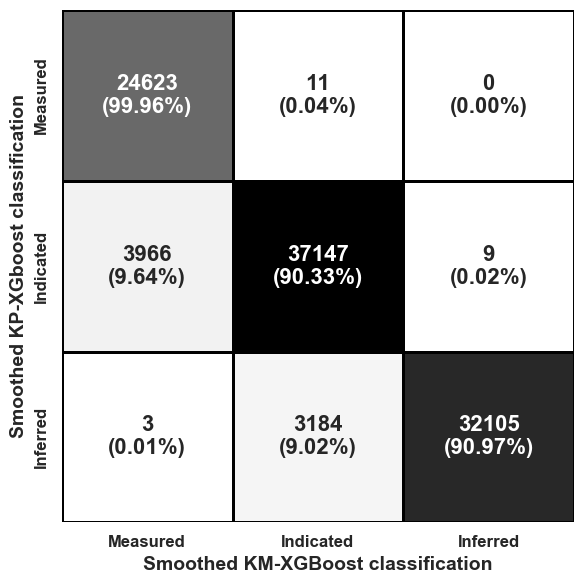

In [407]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df1["Categoria_suavizada"], df11["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KM-XGBoost classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-XGboost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("SMOOTHED KM-XGBOOTS RFF suavizado vs Initial KP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

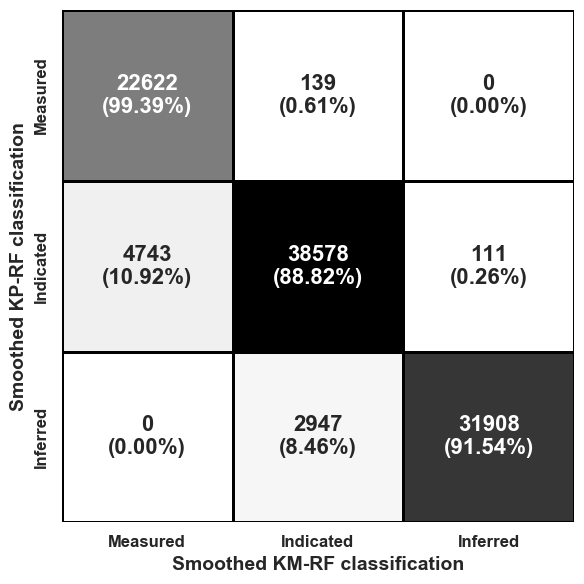

In [408]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df2["Categoria_suavizada"], df22["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KM-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KP-RF classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("SMOOTHED KM-RFFFF RFF suavizado vs Initial KP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

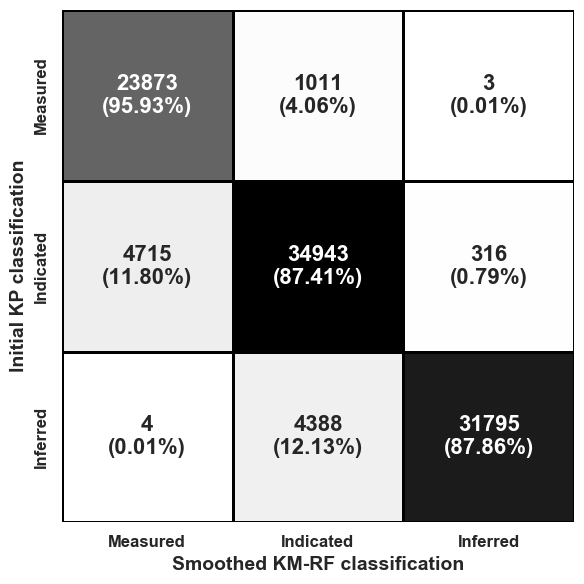

In [409]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df1["Categoria"], df11["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KM-RF classification", fontsize=14, fontweight="bold")
plt.ylabel("Initial KP classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("SMOOTHEDKP-KMM suavizado vs Initial KP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [261]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df11["Categoria_suavizada"].value_counts()

# Mostrar los resultados
print(categoria_counts)


Categoria_suavizada
2    40342
0    32114
1    28592
Name: count, dtype: int64


In [262]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Tomar una muestra de 10,000 registros de df01 para optimizar tiempo de cómputo
df_sample = df11.iloc[:10000]

# Asegurar que la columna 'Categoria' y 'Categoria_suavizada' no tengan valores nulos
df_sample = df_sample[df_sample["Categoria"].notnull() & df_sample["Categoria_suavizada"].notnull()]

# Normalizar las coordenadas espaciales
scaler = StandardScaler()
X_sample_scaled = scaler.fit_transform(df_sample[["X", "Y", "Z"]])

# Aplicar PCA para reducir dimensiones a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sample_scaled)

# Calcular el Silhouette Score antes del suavizado
silhouette_before = silhouette_score(X_pca, df_sample["Categoria"])

# Calcular el Silhouette Score después del suavizado
silhouette_after = silhouette_score(X_pca, df_sample["Categoria_suavizada"])

# Crear una tabla de comparación
silhouette_comparison = pd.DataFrame({
    "Método": ["Antes del Suavizado", "Después del Suavizado"],
    "Silhouette Score": [silhouette_before, silhouette_after]
})

# Mostrar la tabla
print(silhouette_comparison)

                  Método  Silhouette Score
0    Antes del Suavizado             -0.10
1  Después del Suavizado             -0.11


In [263]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluar el modelo en el conjunto de prueba
y_pred = xgb_model.predict(X_test)

# Calcular la precisión
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba: {accuracy:.2f}")

# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=["Inferidos", "Medidos", "Indicados"]))

# Matriz de confusión
print("Matriz de confusión:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

Precisión en el conjunto de prueba: 0.92
Reporte de clasificación:
              precision    recall  f1-score   support

   Inferidos       0.96      0.93      0.94      6579
     Medidos       0.93      0.92      0.93      5800
   Indicados       0.89      0.91      0.90      7831

    accuracy                           0.92     20210
   macro avg       0.93      0.92      0.92     20210
weighted avg       0.92      0.92      0.92     20210

Matriz de confusión:
[[6125    1  453]
 [   1 5360  439]
 [ 272  396 7163]]


In [264]:
df11.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,1.06,1.08
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.84,0.84
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,2.00,2.00


In [265]:
df11[df11["Categoria_suavizada"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,28592.00,0.41,0.21,0.00,0.27,0.39,0.53,2.03
OK_Lagrangian,28592.00,-0.00,0.00,-0.01,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,28592.00,175.17,27.79,116.75,153.74,175.53,196.45,265.06
OK_krig_var,28592.00,0.04,0.02,0.00,0.02,0.03,0.05,0.09
OK_n_samples,28592.00,198.12,11.68,20.00,200.00,200.00,200.00,200.00
X,28592.00,375625.08,312.32,374810.00,375380.00,375620.00,375860.00,376340.00
Y,28592.00,8717012.53,370.52,8715970.00,8716720.00,8716990.00,8717290.00,8718040.00
Z,28592.00,4470.99,169.33,4070.00,4340.00,4460.00,4610.00,4850.00
Categoria,28592.00,1.06,0.24,0.00,1.00,1.00,1.00,2.00
Categoria_suavizada,28592.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00


In [266]:
df11[df11["Categoria_suavizada"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,40342.00,0.31,0.12,0.00,0.24,0.32,0.38,1.14
OK_Lagrangian,40342.00,-0.00,0.00,-0.03,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,40342.00,238.44,28.29,104.39,218.39,235.35,256.56,355.95
OK_krig_var,40342.00,0.08,0.02,0.00,0.07,0.08,0.09,0.12
OK_n_samples,40342.00,122.33,53.32,13.00,76.00,117.00,172.00,200.00
X,40342.00,375636.51,440.44,374780.00,375260.00,375680.00,376010.00,376400.00
Y,40342.00,8717001.94,572.11,8715970.00,8716510.00,8716960.00,8717470.00,8718160.00
Z,40342.00,4439.19,251.47,4010.00,4220.00,4430.00,4640.00,4910.00
Categoria,40342.00,1.85,0.47,0.00,2.00,2.00,2.00,2.00
Categoria_suavizada,40342.00,2.00,0.00,2.00,2.00,2.00,2.00,2.00


In [267]:
df11[df11["Categoria_suavizada"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,32114.00,0.28,0.12,0.00,0.21,0.28,0.36,1.06
OK_Lagrangian,32114.00,-0.03,0.02,-0.08,-0.04,-0.02,-0.01,-0.00
OK_average_sample_distance,32114.00,282.32,55.74,115.90,240.73,277.66,319.54,442.94
OK_krig_var,32114.00,0.11,0.02,0.04,0.10,0.10,0.12,0.17
OK_n_samples,32114.00,21.85,17.42,1.00,8.00,17.00,32.00,122.00
X,32114.00,375565.71,519.32,374780.00,375080.00,375470.00,376100.00,376400.00
Y,32114.00,8716964.61,718.19,8715970.00,8716270.00,8716960.00,8717620.00,8718160.00
Z,32114.00,4418.21,298.21,4010.00,4130.00,4400.00,4700.00,4910.00
Categoria,32114.00,0.07,0.37,0.00,0.00,0.00,0.00,2.00
Categoria_suavizada,32114.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


### Calcular tonelaje para cada bloque: 30x30x30= 27 000 m3
#27 000 m3 * 2.3 =62 100 t por cada bloque
### en medidos (0): 28592 bloques *62 100 t = 1775563200; ley=0.41
### en indicados (2): 40342 bloques * 62 100 t= 2505238200; ley=0.31
### en inferidos (1): 32114 bloques* 62 100 t=1994279400; ley=0.28

In [268]:
metal_medido = 1775563200 * (0.41/100) * 0.9
metal_indicado = 2505238200* (0.31/100) * 0.9
metal_inferido = 1994279400 * (0.28/100) * 0.9

In [269]:
metal_medido

6551828.208

In [270]:
metal_indicado

6989614.578

In [271]:
metal_inferido

5025584.088000001

In [272]:
df_copy.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred


In [273]:
df_copy[df_copy["Categoria"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,28795.00,0.41,0.22,0.00,0.27,0.39,0.53,2.03
OK_Lagrangian,28795.00,-0.00,0.00,-0.02,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,28795.00,175.38,28.14,104.39,153.80,175.70,196.30,274.88
OK_krig_var,28795.00,0.03,0.01,0.00,0.02,0.03,0.04,0.08
OK_n_samples,28795.00,195.65,19.18,12.00,200.00,200.00,200.00,200.00
X,28795.00,375629.21,315.54,374810.00,375380.00,375620.00,375860.00,376400.00
Y,28795.00,8717011.77,379.98,8715970.00,8716720.00,8716990.00,8717290.00,8718130.00
Z,28795.00,4466.74,173.33,4040.00,4340.00,4460.00,4610.00,4910.00
Categoria,28795.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00


In [274]:
df_copy[df_copy["Categoria"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,39321.00,0.31,0.12,0.00,0.24,0.32,0.38,0.98
OK_Lagrangian,39321.00,-0.00,0.00,-0.03,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,39321.00,236.92,27.89,121.62,217.20,233.88,254.88,342.32
OK_krig_var,39321.00,0.08,0.01,0.01,0.07,0.08,0.09,0.11
OK_n_samples,39321.00,125.11,53.80,10.00,79.00,119.00,179.00,200.00
X,39321.00,375635.66,437.95,374780.00,375260.00,375680.00,376010.00,376400.00
Y,39321.00,8717003.01,565.94,8715970.00,8716510.00,8716960.00,8717470.00,8718160.00
Z,39321.00,4439.16,250.87,4010.00,4220.00,4430.00,4640.00,4910.00
Categoria,39321.00,2.00,0.00,2.00,2.00,2.00,2.00,2.00


In [275]:
df_copy[df_copy["Categoria"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,32932.00,0.29,0.12,0.00,0.21,0.29,0.36,1.06
OK_Lagrangian,32932.00,-0.03,0.02,-0.08,-0.04,-0.02,-0.01,-0.00
OK_average_sample_distance,32932.00,283.25,54.07,134.18,242.94,277.96,318.85,442.94
OK_krig_var,32932.00,0.11,0.02,0.07,0.10,0.10,0.12,0.17
OK_n_samples,32932.00,22.72,17.93,1.00,8.00,18.00,34.00,100.00
X,32932.00,375564.95,518.73,374780.00,375080.00,375470.00,376100.00,376400.00
Y,32932.00,8716964.86,717.26,8715970.00,8716270.00,8716960.00,8717620.00,8718160.00
Z,32932.00,4422.28,296.69,4010.00,4130.00,4400.00,4700.00,4910.00
Categoria,32932.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [276]:
print(df_copy['Categoria'].unique())

[0 2 1]


In [277]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [278]:
df_00 = df11[df11['Categoria_suavizada']==1]
df_00.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
6146,0.41,-0.00,150.54,0.03,20,375140,8716570,4070,1,Measured,1
9499,0.45,-0.01,236.87,0.09,27,375110,8716780,4100,0,Measured,1
9500,0.41,-0.01,233.51,0.09,34,375140,8716780,4100,0,Measured,1
9547,0.39,-0.01,250.57,0.09,29,375110,8716810,4100,0,Measured,1
9548,0.40,-0.01,243.62,0.09,36,375140,8716810,4100,0,Measured,1


In [279]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [280]:
# Contar la cantidad de filas por cada valor único en 'Categoria_s_original'
conteo_por_categoria = df11.groupby('Categoria_suavizada').size()

# Mostrar el resultado
print(conteo_por_categoria)

Categoria_suavizada
0    32114
1    28592
2    40342
dtype: int64


In [281]:
# Calcular el promedio de la variable 'ko' por cada valor único en 'Categoria_s_original'
promedio_por_categoria = df11.groupby('Categoria_suavizada')['OK'].mean()

# Mostrar el resultado
print(promedio_por_categoria)

Categoria_suavizada
0   0.28
1   0.41
2   0.31
Name: OK, dtype: float64


In [282]:
df11["OK"].describe().T

count   101048.00
mean         0.33
std          0.16
min          0.00
25%          0.23
50%          0.32
75%          0.41
max          2.03
Name: OK, dtype: float64

In [283]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [284]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [285]:
# Crear una nueva columna 'Categoria_n' basada en la columna 'Categoria'
df11['Categoria_n'] = df11['Categoria'].replace({'Inferido': 0, 'Medido': 1, 'Indicado': 2})

# Mostrar las primeras filas para verificar el resultado
df11[['Categoria', 'Categoria_n']].head()

,Categoria,Categoria_n
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [286]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0,0


In [287]:
# Crear tres nuevos DataFrames según los valores de Categoria_s_original
df_medido = df11[df11['Categoria_n'] == 1].copy()
df_inferido = df11[df11['Categoria_n'] == 0].copy()
df_indicado = df11[df11['Categoria_n'] == 2].copy()

In [288]:
df_medido2 = df11[df11['Categoria_suavizada'] == 1].copy()
df_inferido2 = df11[df11['Categoria_suavizada'] == 0].copy()
df_indicado2 = df11[df11['Categoria_suavizada'] == 2].copy()

In [289]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos11 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos11.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido[df_medido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos11.loc[index, 'Tonelaje'] = tonnage
    intervalos11.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos11['Tonelaje'] = (intervalos11['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos11)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1685704.50    0.43
1           0.20 1521636.30    0.46
2           0.30 1235355.30    0.51
3           0.40  854433.90    0.59
4           0.50  519031.80    0.68
5           0.60  295409.70    0.77
6           0.70  171271.80    0.87
7           0.80  100167.30    0.95
8           0.90   55641.60    1.04
9           1.00   29311.20    1.12


In [290]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos00 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos00.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido[df_inferido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos00.loc[index, 'Tonelaje'] = tonnage
    intervalos00.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos00['Tonelaje'] = (intervalos00['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos00)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1906283.70    0.30
1           0.20 1597087.80    0.33
2           0.30  901505.70    0.39
3           0.40  311742.00    0.47
4           0.50   59740.20    0.60
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [291]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos22 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos22.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado[df_indicado['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos22.loc[index, 'Tonelaje'] = tonnage
    intervalos22.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos22['Tonelaje'] = (intervalos22['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos22)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2320242.30    0.32
1           0.20 2032781.40    0.35
2           0.30 1395387.00    0.39
3           0.40  483262.20    0.46
4           0.50   91287.00    0.58
5           0.60   28069.20    0.68
6           0.70    9315.00    0.77
7           0.80    2111.40    0.86
8           0.90     434.70    0.92
9           1.00       0.00     NaN


In [292]:
intervalos00.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,480790.62,729292.66,621.00,5402.70,37787.85,754064.77,1906283.70
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [293]:
df_medido2 = df11[df11['Categoria_suavizada'] == 1].copy()
df_inferido2 = df11[df11['Categoria_suavizada'] == 0].copy()
df_indicado2 = df11[df11['Categoria_suavizada'] == 2].copy()

In [294]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos0 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos0.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido2[df_inferido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos0.loc[index, 'Tonelaje'] = tonnage
    intervalos0.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos0['Tonelaje'] = (intervalos0['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos0)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1859398.20    0.30
1           0.20 1552996.80    0.33
2           0.30  873560.70    0.39
3           0.40  305780.40    0.47
4           0.50   59181.30    0.60
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [295]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos1 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos1.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido2[df_medido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos1.loc[index, 'Tonelaje'] = tonnage
    intervalos1.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos1['Tonelaje'] = (intervalos1['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos1)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1681668.00    0.43
1           0.20 1526604.30    0.46
2           0.30 1244980.80    0.51
3           0.40  853564.50    0.58
4           0.50  514250.10    0.67
5           0.60  289696.50    0.77
6           0.70  167359.50    0.87
7           0.80   98055.90    0.95
8           0.90   54772.20    1.04
9           1.00   28814.40    1.12


In [296]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos2 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos2.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado2[df_indicado2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos2.loc[index, 'Tonelaje'] = tonnage
    intervalos2.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos2['Tonelaje'] = (intervalos2['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos2)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2371164.30    0.32
1           0.20 2071904.40    0.35
2           0.30 1413706.50    0.39
3           0.40  490093.20    0.47
4           0.50   96627.60    0.59
5           0.60   33782.40    0.70
6           0.70   13227.30    0.79
7           0.80    4222.80    0.89
8           0.90    1304.10    0.99
9           1.00     496.80    1.07


In [297]:
intervalos0.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,468246.42,710012.58,621.00,5402.70,37508.40,731615.62,1859398.20
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [298]:
intervalos1.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,645976.62,637185.76,28814.40,115381.80,401973.30,1147126.73,1681668.00
Cu (%),10.00,0.74,0.25,0.43,0.53,0.72,0.93,1.12


In [299]:
intervalos2.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,649652.94,939512.22,496.80,6473.92,65205.00,1182803.18,2371164.30
Cu (%),10.00,0.65,0.27,0.32,0.41,0.65,0.86,1.07


## RF

In [300]:
df22 = df_copy.copy()

In [301]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Configuración de datos
X = df22[['X', 'Y', 'Z']]  # Variables independientes
y = df22['Categoria']      # Variable dependiente (Categoría)

# Dividir los datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Normalizar los datos con StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Configuración del modelo Random Forest
# Configuración del modelo Random Forest
rf_model = RandomForestClassifier(
    n_estimators=300,        # Número de árboles en el bosque
    max_depth=12,             # Máxima profundidad de los árboles
    random_state=42,         # Semilla para reproducibilidad
    min_samples_split=15,     # Mínimo número de muestras para dividir un nodo
    min_samples_leaf=4,      # Mínimo número de muestras en una hoja
    max_features='sqrt',     # Máximo número de características por división
    bootstrap=True           # Submuestreo con reemplazo
)

# Entrenar el modelo con los datos de entrenamiento
rf_model.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred_test = rf_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_pred_test)
print(f"Exactitud en el conjunto de prueba: {test_accuracy:.2f}")

# Predicciones suavizadas en el conjunto original
X_original = df22[['X', 'Y', 'Z']]
X_original = scaler.transform(X_original)  # Normalizar el conjunto original
df22['Categoria_suavizada'] = rf_model.predict(X_original)

# Mostrar las primeras filas del DataFrame con predicciones suavizadas
print(df22.head())


Exactitud en el conjunto de prueba: 0.91
    OK  OK_Lagrangian  OK_average_sample_distance  OK_krig_var  OK_n_samples  \
0 0.05          -0.08                      199.18         0.17             1   
1 0.05          -0.08                      197.46         0.17             1   
2 0.05          -0.08                      200.27         0.17             1   
3 0.05          -0.08                      202.67         0.17             1   
4 0.05          -0.08                      196.45         0.17             1   

        X        Y     Z  Categoria Categoria_label  Categoria_suavizada  
0  375890  8715970  4010          0        Inferred                    0  
1  375920  8715970  4010          0        Inferred                    0  
2  375950  8715970  4010          0        Inferred                    0  
3  375860  8716000  4010          0        Inferred                    0  
4  375890  8716000  4010          0        Inferred                    0  


In [302]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [303]:
df22.describe().T

,count,mean,std,min,25%,50%,75%,max
OK,101048.00,0.33,0.16,0.00,0.23,0.32,0.41,2.03
OK_Lagrangian,101048.00,-0.01,0.02,-0.08,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,101048.00,234.48,57.05,104.39,197.24,229.43,266.28,442.94
OK_krig_var,101048.00,0.08,0.03,0.00,0.05,0.08,0.10,0.17
OK_n_samples,101048.00,111.84,77.42,1.00,34.00,108.00,200.00,200.00
X,101048.00,375610.77,437.86,374780.00,375260.00,375620.00,375980.00,376400.00
Y,101048.00,8716993.07,577.79,8715970.00,8716510.00,8716990.00,8717440.00,8718160.00
Z,101048.00,4441.52,249.08,4010.00,4250.00,4430.00,4640.00,4910.00
Categoria,101048.00,1.06,0.84,0.00,0.00,1.00,2.00,2.00
Categoria_suavizada,101048.00,1.10,0.85,0.00,0.00,1.00,2.00,2.00


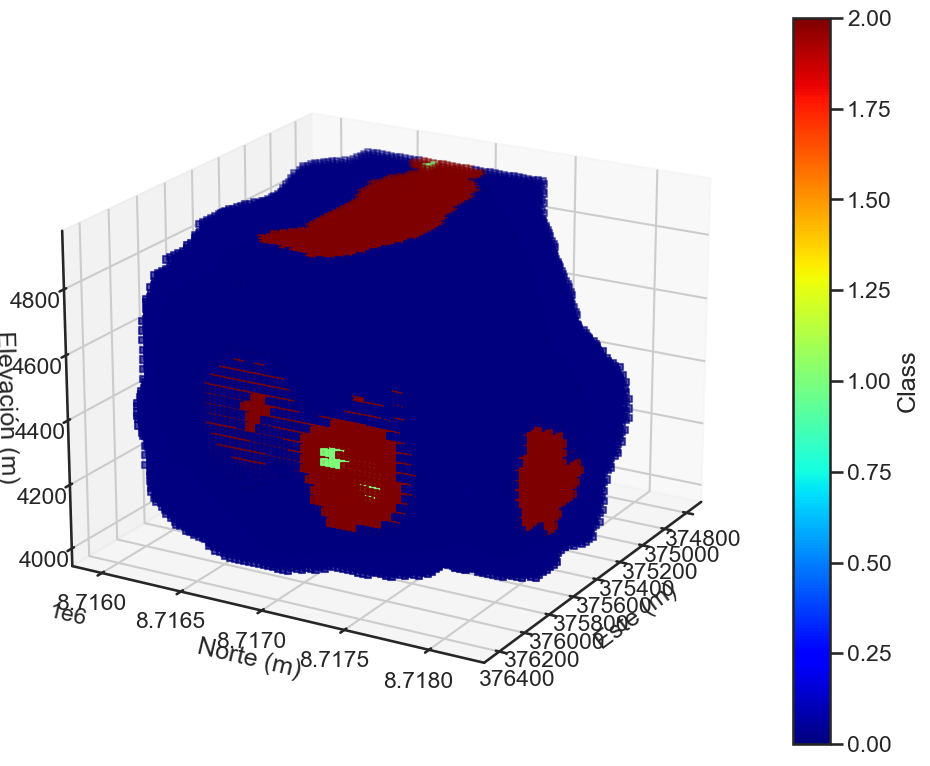

In [304]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Supongamos que tu DataFrame se llama df

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot 3D
scatter = ax.scatter(df22['X'], df22['Y'], df22['Z'], c=df22['Categoria'], cmap='jet', s=20, marker="s", vmin=0, vmax=2)

# Configuración del gráfico
ax.set_xlabel('Este (m)')
ax.set_ylabel('Norte (m)')
ax.set_zlabel('Elevación (m)')
#ax.set_title('Visualización 3D de Categoria_s_original')

# Agregar barra de color
cbar = fig.colorbar(scatter, ax=ax)
cbar.set_label('Class')
ax.view_init(elev=20, azim=30)
plt.tight_layout()
#plt.savefig("Image/bloques_3d_categoriaS_AMM.jpg", dpi=600)

plt.show()

In [305]:
bd=pd.read_csv('sondajesA.csv')

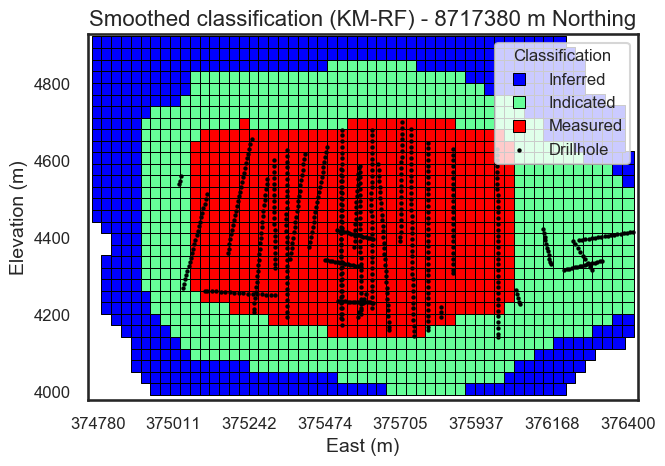

In [306]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear un diccionario para mapear los números a las etiquetas de texto
categoria_labels = {0: "Inferred", 1: "Measured", 2: "Indicated"}

# Mapear la columna "Categoria" para usar las etiquetas de texto
df22['Categoria_label'] = df22['Categoria_suavizada'].map(categoria_labels)

# Definir el corte de Y
corte_y = 8717380

# Filtrar los datos para el corte en Y
df22_corte_y = df22[df22['Y'] == corte_y]

# Verificar si hay datos para el corte
if df22_corte_y.empty:
    print(f"No hay datos para Y = {corte_y}")
else:
    # Tamaño de los puntos
    marker_size_clasificacion = 80  # Puntos para clasificación
    marker_size_sondajes = 10  # Puntos más grandes para mayor visibilidad

    # Paleta de colores personalizada
    palette1 = ["blue", "#66FF99", "red"]

    # Crear la figura
    plt.figure(figsize=(7, 5))

    # Graficar la clasificación
    sns.scatterplot(
        x=df22_corte_y["X"], 
        y=df22_corte_y["Z"], 
        hue=df22_corte_y["Categoria_label"], 
        palette=palette1, 
        s=marker_size_clasificacion, 
        marker="s", 
        edgecolor="black"
    )

    # Filtrar los sondajes para el mismo corte en Y
    bd_corte_y = bd[bd['Y'] == corte_y]
    
    # Añadir los sondajes con diseño más profesional (círculos negros con borde blanco)
    if not bd_corte_y.empty:
        plt.scatter(
            bd_corte_y["X"], 
            bd_corte_y["Z"], 
            color="black", 
            edgecolors="black",  # Borde blanco para mejor visibilidad
            linewidth=0.,  # Grosor del borde
            s=marker_size_sondajes, 
            label="Drillhole", 
            alpha=1.0  # Sin transparencia para máxima visibilidad
        )
    
    # Ajustar la leyenda con letras más pequeñas
    handles, labels = plt.gca().get_legend_handles_labels()
    if "Drillhole" not in labels:
        handles.append(plt.Line2D([0], [0], color="black", marker="o", markersize=6, linestyle="None", label="Drillhole"))
        labels.append("Drillhole")

    plt.legend(handles=handles, title="Classification", fontsize=12, title_fontsize=12, loc='upper right')

   # Definir los límites manualmente
    plt.xlim(374750, 376430)  # Límites del eje X
    plt.ylim(3980, 4930)  # Límites del eje Y

    # Definir el número de ticks en el eje X (8 valores distribuidos)
    x_ticks = np.linspace(374780, 376400, 8)
    plt.xticks(x_ticks.astype(int))

    # Títulos y etiquetas
    plt.title(f'Smoothed classification (KM-RF) - {corte_y} m Northing', fontsize=16)
    plt.xlabel("East (m)", fontsize=14)
    plt.ylabel("Elevation (m)", fontsize=14)
    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)

    # Mejor distribución de la figura
    plt.tight_layout()
    plt.savefig("KMRF_XGboost suavizado.jpg", dpi=800)
    plt.show()

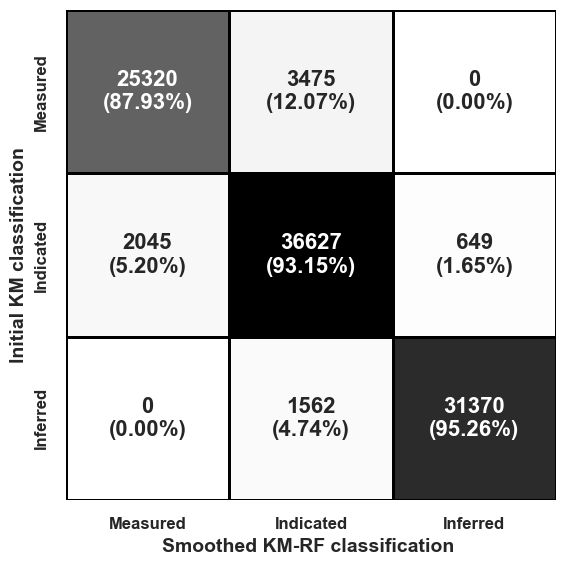

In [307]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df22["Categoria"], df22["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KM-RF classification ", fontsize=14, fontweight="bold")
plt.ylabel("Initial KM classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("KM-RF-KM suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()


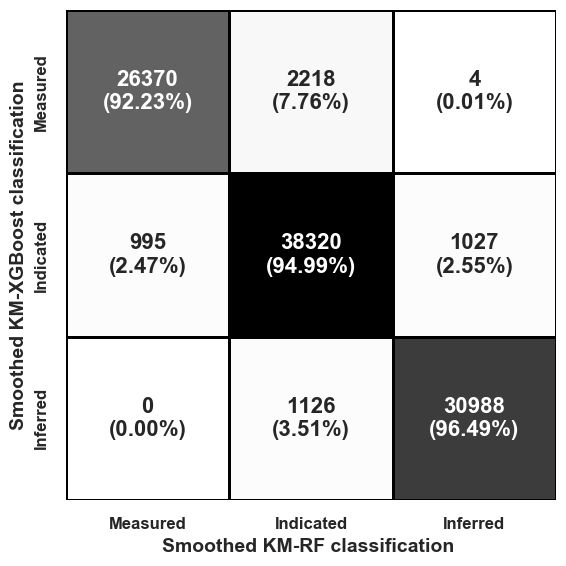

In [308]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df11["Categoria_suavizada"], df22["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed KM-RF classification ", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KM-XGBoost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("XGBOOST-RF-KM suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

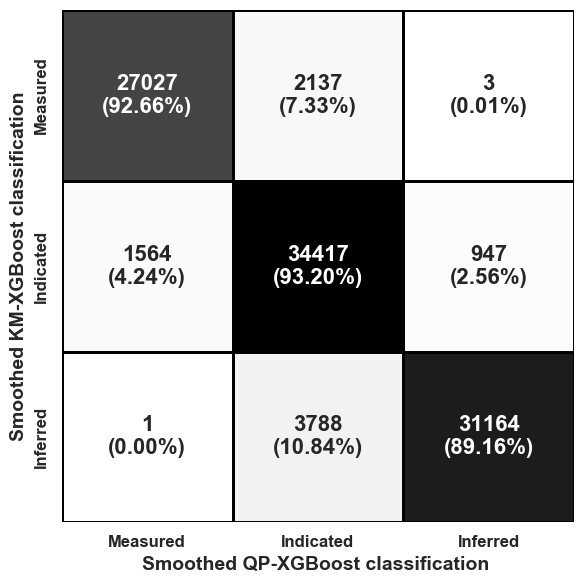

In [369]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df01["Categoria_suavizada"], df11["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-XGBoost classification ", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KM-XGBoost classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("XGBOOST vs inisital xgboost suavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [310]:
# Contar cuántos valores hay en cada categoría (0 = Medido, 1 = Indicado, 2 = Inferido)
categoria_counts = df22["Categoria_suavizada"].value_counts()

# Mostrar los resultados
print(categoria_counts)

Categoria_suavizada
2    41664
0    32019
1    27365
Name: count, dtype: int64


In [311]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Tomar una muestra de 10,000 registros de df01 para optimizar tiempo de cómputo
df_sample = df22.iloc[:10000]

# Asegurar que la columna 'Categoria' y 'Categoria_suavizada' no tengan valores nulos
df_sample = df_sample[df_sample["Categoria"].notnull() & df_sample["Categoria_suavizada"].notnull()]

# Normalizar las coordenadas espaciales
scaler = StandardScaler()
X_sample_scaled = scaler.fit_transform(df_sample[["X", "Y", "Z"]])

# Aplicar PCA para reducir dimensiones a 2D
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_sample_scaled)

# Calcular el Silhouette Score antes del suavizado
silhouette_before = silhouette_score(X_pca, df_sample["Categoria"])

# Calcular el Silhouette Score después del suavizado
silhouette_after = silhouette_score(X_pca, df_sample["Categoria_suavizada"])

# Crear una tabla de comparación
silhouette_comparison = pd.DataFrame({
    "Método": ["Antes del Suavizado", "Después del Suavizado"],
    "Silhouette Score": [silhouette_before, silhouette_after]
})

# Mostrar la tabla
print(silhouette_comparison)

                  Método  Silhouette Score
0    Antes del Suavizado             -0.10
1  Después del Suavizado              0.02


In [312]:
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Evaluar el modelo en el conjunto de prueba
y_pred = rf_model.predict(X_test)

# Calcular la precisión
accuracy = accuracy_score(y_test, y_pred)
print(f"Precisión en el conjunto de prueba: {accuracy:.2f}")

# Reporte de clasificación
print("Reporte de clasificación:")
print(classification_report(y_test, y_pred, target_names=["Inferidos", "Medidos", "Indicados"]))

# Matriz de confusión
print("Matriz de confusión:")
cm = confusion_matrix(y_test, y_pred)
print(cm)

Precisión en el conjunto de prueba: 0.91
Reporte de clasificación:
              precision    recall  f1-score   support

   Inferidos       0.97      0.94      0.95      6579
     Medidos       0.92      0.87      0.90      5800
   Indicados       0.86      0.92      0.89      7831

    accuracy                           0.91     20210
   macro avg       0.92      0.91      0.91     20210
weighted avg       0.91      0.91      0.91     20210

Matriz de confusión:
[[6156    0  423]
 [   0 5064  736]
 [ 211  428 7192]]


In [313]:
df22.describe()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_suavizada
count,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00,101048.00
mean,0.33,-0.01,234.48,0.08,111.84,375610.77,8716993.07,4441.52,1.06,1.10
std,0.16,0.02,57.05,0.03,77.42,437.86,577.79,249.08,0.84,0.85
min,0.00,-0.08,104.39,0.00,1.00,374780.00,8715970.00,4010.00,0.00,0.00
25%,0.23,-0.01,197.24,0.05,34.00,375260.00,8716510.00,4250.00,0.00,0.00
50%,0.32,-0.00,229.43,0.08,108.00,375620.00,8716990.00,4430.00,1.00,1.00
75%,0.41,-0.00,266.28,0.10,200.00,375980.00,8717440.00,4640.00,2.00,2.00
max,2.03,0.00,442.94,0.17,200.00,376400.00,8718160.00,4910.00,2.00,2.00


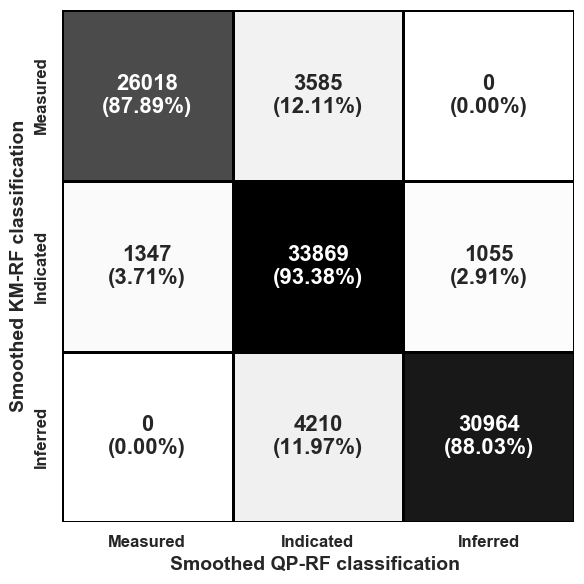

In [370]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

# Definir el orden correcto de las categorías
categoria_labels = [1, 2, 0]  # Medido, Indicado, Inferido

# Calcular la matriz de confusión con el nuevo orden
conf_matrix = confusion_matrix(df02["Categoria_suavizada"], df22["Categoria_suavizada"], labels=categoria_labels)

# Calcular los porcentajes
conf_matrix_percent = conf_matrix.astype('float') / conf_matrix.sum(axis=1)[:, np.newaxis] * 100

# Crear anotaciones combinadas con valores absolutos y porcentajes
annot = np.empty_like(conf_matrix).astype(str)
for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        annot[i, j] = f"{conf_matrix[i, j]}\n({conf_matrix_percent[i, j]:.2f}%)"

# Definir etiquetas en el orden correcto
categoria_labels_str = ["Measured", "Indicated", "Inferred"]

# Crear la figura
plt.figure(figsize=(7, 6))

# Dibujar el heatmap con mejoras en estilo
sns.heatmap(
    conf_matrix, 
    annot=annot, 
    fmt="", 
    cmap="Greys", 
    xticklabels=categoria_labels_str, 
    yticklabels=categoria_labels_str, 
    linewidths=1,  # Grosor de los bordes
    linecolor='black',  # Color del borde
    cbar=False,  # Eliminar la barra de colores
    square=True, 
    annot_kws={"size": 16, "weight": "bold"}  # Letras más grandes y en negrita
)

# Mejorar etiquetas y títulos
plt.xlabel("Smoothed QP-RF classification ", fontsize=14, fontweight="bold")
plt.ylabel("Smoothed KM-RF classification", fontsize=14, fontweight="bold")

# Mejorar los ticks de los ejes
plt.xticks(fontsize=12, fontweight="bold")
plt.yticks(fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("RF vs inisital RFsuavizado vs Initial QP.jpg", dpi=800)
# Mostrar la figura con el nuevo estilo
plt.show()

In [315]:
df22[df22["Categoria_suavizada"]==1].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,27365.00,0.42,0.21,0.00,0.28,0.39,0.53,2.03
OK_Lagrangian,27365.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00
OK_average_sample_distance,27365.00,174.67,28.38,116.75,152.68,174.21,196.03,271.88
OK_krig_var,27365.00,0.04,0.02,0.00,0.02,0.03,0.05,0.09
OK_n_samples,27365.00,199.14,5.67,94.00,200.00,200.00,200.00,200.00
X,27365.00,375615.44,302.52,375020.00,375380.00,375620.00,375860.00,376220.00
Y,27365.00,8716994.85,350.27,8716330.00,8716720.00,8716960.00,8717260.00,8717860.00
Z,27365.00,4473.50,168.70,4160.00,4340.00,4460.00,4610.00,4820.00
Categoria,27365.00,1.07,0.26,1.00,1.00,1.00,1.00,2.00
Categoria_suavizada,27365.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00


In [316]:
df22[df22["Categoria_suavizada"]==2].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,41664.00,0.31,0.12,0.00,0.24,0.32,0.38,1.15
OK_Lagrangian,41664.00,-0.00,0.00,-0.03,-0.01,-0.00,-0.00,0.00
OK_average_sample_distance,41664.00,236.25,29.15,104.39,216.01,233.69,255.09,358.27
OK_krig_var,41664.00,0.08,0.02,0.00,0.07,0.08,0.09,0.11
OK_n_samples,41664.00,123.59,54.06,11.00,77.00,118.00,176.00,200.00
X,41664.00,375646.60,441.76,374780.00,375260.00,375680.00,376010.00,376400.00
Y,41664.00,8717014.26,575.59,8715970.00,8716510.00,8716990.00,8717500.00,8718160.00
Z,41664.00,4438.01,250.69,4010.00,4220.00,4430.00,4640.00,4910.00
Categoria,41664.00,1.84,0.46,0.00,2.00,2.00,2.00,2.00
Categoria_suavizada,41664.00,2.00,0.00,2.00,2.00,2.00,2.00,2.00


In [317]:
df22[df22["Categoria_suavizada"]==0].describe().T

,count,mean,std,min,25%,50%,75%,max
OK,32019.00,0.29,0.12,0.00,0.21,0.28,0.36,1.06
OK_Lagrangian,32019.00,-0.03,0.02,-0.08,-0.04,-0.02,-0.01,-0.00
OK_average_sample_distance,32019.00,283.30,55.05,130.88,242.24,278.70,319.95,442.94
OK_krig_var,32019.00,0.11,0.02,0.06,0.10,0.10,0.12,0.17
OK_n_samples,32019.00,21.94,17.64,1.00,8.00,17.00,32.00,130.00
X,32019.00,375560.18,518.32,374780.00,375080.00,375470.00,376100.00,376400.00
Y,32019.00,8716963.98,718.46,8715970.00,8716270.00,8716930.00,8717620.00,8718160.00
Z,32019.00,4418.76,297.15,4010.00,4130.00,4400.00,4700.00,4910.00
Categoria,32019.00,0.04,0.28,0.00,0.00,0.00,0.00,2.00
Categoria_suavizada,32019.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


### Calcular tonelaje para cada bloque: 30x30x30= 27 000 m3
#27 000 m3 * 2.3 =62 100 t por cada bloque
### en medidos (0): 26978 bloques *62 100 t = 1699366500; ley=0.42
### en indicados (2): 42717 bloques * 62 100 t= 2587334400; ley=0.31
### en inferidos (1): 31353 bloques* 62 100 t=1988379900; ley=0.29

In [318]:
metal_medido = 1699366500 * (0.42/100) * 0.9
metal_indicado = 2587334400 * (0.31/100) * 0.9
metal_inferido = 1988379900 * (0.29/100) * 0.9

In [319]:
metal_medido

6423605.37

In [320]:
metal_indicado

7218662.976

In [321]:
metal_inferido

5189671.539

In [322]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [323]:
print(df22['Categoria'].unique())

[0 2 1]


In [324]:
print(df22.columns)


Index(['OK', 'OK_Lagrangian', 'OK_average_sample_distance', 'OK_krig_var',
       'OK_n_samples', 'X', 'Y', 'Z', 'Categoria', 'Categoria_label',
       'Categoria_suavizada'],
      dtype='object')


In [325]:
print(df22[['OK_krig_var', 'OK_average_sample_distance', 'OK_n_samples', 'OK']].dtypes)


OK_krig_var                   float64
OK_average_sample_distance    float64
OK_n_samples                    int64
OK                            float64
dtype: object


In [326]:
print(df22['Categoria'].unique())


[0 2 1]


In [327]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [328]:
df_0 = df22[df22['Categoria_suavizada']==1]
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
16637,0.26,-0.00,213.80,0.05,200,375500,8717200,4160,1,Measured,1
16638,0.17,-0.00,205.35,0.02,200,375530,8717200,4160,1,Measured,1
16639,0.19,-0.00,203.98,0.03,200,375560,8717200,4160,1,Measured,1
16640,0.24,-0.00,203.19,0.05,200,375590,8717200,4160,1,Measured,1
16641,0.30,-0.00,200.86,0.07,200,375620,8717200,4160,2,Measured,1


In [329]:
df_0.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
16637,0.26,-0.00,213.80,0.05,200,375500,8717200,4160,1,Measured,1
16638,0.17,-0.00,205.35,0.02,200,375530,8717200,4160,1,Measured,1
16639,0.19,-0.00,203.98,0.03,200,375560,8717200,4160,1,Measured,1
16640,0.24,-0.00,203.19,0.05,200,375590,8717200,4160,1,Measured,1
16641,0.30,-0.00,200.86,0.07,200,375620,8717200,4160,2,Measured,1


In [330]:
# Contar la cantidad de filas por cada valor único en 'Categoria_s_original'
conteo_por_categoria = df22.groupby('Categoria_suavizada').size()

# Mostrar el resultado
print(conteo_por_categoria)

Categoria_suavizada
0    32019
1    27365
2    41664
dtype: int64


In [331]:
# Calcular el promedio de la variable 'ko' por cada valor único en 'Categoria_s_original'
promedio_por_categoria = df22.groupby('Categoria_suavizada')['OK'].mean()

# Mostrar el resultado
print(promedio_por_categoria)

Categoria_suavizada
0   0.29
1   0.42
2   0.31
Name: OK, dtype: float64


In [332]:
df22["OK"].describe().T

count   101048.00
mean         0.33
std          0.16
min          0.00
25%          0.23
50%          0.32
75%          0.41
max          2.03
Name: OK, dtype: float64

In [333]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [334]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0


In [335]:
# Crear una nueva columna 'Categoria_n' basada en la columna 'Categoria'
df22['Categoria_n'] = df22['Categoria'].replace({'Inferido': 0, 'Medido': 1, 'Indicado': 2})

# Mostrar las primeras filas para verificar el resultado
df22[['Categoria', 'Categoria_n']].head()


,Categoria,Categoria_n
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0


In [336]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0,0


In [337]:
# Crear tres nuevos DataFrames según los valores de Categoria_s_original
df_medido = df22[df22['Categoria_n'] == 1].copy()
df_inferido = df22[df22['Categoria_n'] == 0].copy()
df_indicado = df22[df22['Categoria_n'] == 2].copy()

In [338]:
df_medido2 = df22[df22['Categoria_suavizada'] == 1].copy()
df_inferido2 = df22[df22['Categoria_suavizada'] == 0].copy()
df_indicado2 = df22[df22['Categoria_suavizada'] == 2].copy()

In [339]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos11 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos11.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido[df_medido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos11.loc[index, 'Tonelaje'] = tonnage
    intervalos11.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos11['Tonelaje'] = (intervalos11['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos11)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1685704.50    0.43
1           0.20 1521636.30    0.46
2           0.30 1235355.30    0.51
3           0.40  854433.90    0.59
4           0.50  519031.80    0.68
5           0.60  295409.70    0.77
6           0.70  171271.80    0.87
7           0.80  100167.30    0.95
8           0.90   55641.60    1.04
9           1.00   29311.20    1.12


In [340]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos00 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos00.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido[df_inferido['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos00.loc[index, 'Tonelaje'] = tonnage
    intervalos00.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos00['Tonelaje'] = (intervalos00['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos00)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1906283.70    0.30
1           0.20 1597087.80    0.33
2           0.30  901505.70    0.39
3           0.40  311742.00    0.47
4           0.50   59740.20    0.60
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [341]:
import pandas as pd

# Supongamos que ya tienes el DataFrame "df_medido"

# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos22 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos22.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado[df_indicado['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos22.loc[index, 'Tonelaje'] = tonnage
    intervalos22.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos22['Tonelaje'] = (intervalos22['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos22)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2320242.30    0.32
1           0.20 2032781.40    0.35
2           0.30 1395387.00    0.39
3           0.40  483262.20    0.46
4           0.50   91287.00    0.58
5           0.60   28069.20    0.68
6           0.70    9315.00    0.77
7           0.80    2111.40    0.86
8           0.90     434.70    0.92
9           1.00       0.00     NaN


In [342]:
intervalos00.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,480790.62,729292.66,621.00,5402.70,37787.85,754064.77,1906283.70
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [343]:
df_medido2 = df22[df22['Categoria_suavizada'] == 1].copy()
df_inferido2 = df22[df22['Categoria_suavizada'] == 0].copy()
df_indicado2 = df22[df22['Categoria_suavizada'] == 2].copy()

In [344]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos0 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos0.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_inferido2[df_inferido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos0.loc[index, 'Tonelaje'] = tonnage
    intervalos0.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos0['Tonelaje'] = (intervalos0['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos0)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1854057.60    0.30
1           0.20 1553928.30    0.33
2           0.30  871697.70    0.39
3           0.40  303606.90    0.47
4           0.50   59553.90    0.60
5           0.60   15835.50    0.75
6           0.70    7079.40    0.87
7           0.80    4843.80    0.93
8           0.90    3167.10    0.97
9           1.00     621.00    1.05


In [345]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos1 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos1.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_medido2[df_medido2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos1.loc[index, 'Tonelaje'] = tonnage
    intervalos1.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos1['Tonelaje'] = (intervalos1['Tonelaje'] * 30 * 30 * 30 * 2.3) / 1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos1)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 1616338.80    0.44
1           0.20 1466367.30    0.47
2           0.30 1197784.80    0.51
3           0.40  828724.50    0.59
4           0.50  502823.70    0.68
5           0.60  287709.30    0.77
6           0.70  167173.20    0.87
7           0.80   97683.30    0.95
8           0.90   54275.40    1.04
9           1.00   28628.10    1.12


In [346]:
# Crear un nuevo DataFrame con intervalos y calcular tonelaje y promedio de "ko" para cada intervalo
intervalos2 = pd.DataFrame({'Cutoff Cu (%)': [i / 10 for i in range(1, 11)],
                           'Tonelaje': 0,
                           'Cu (%)': 0.0})

# Iterar sobre los intervalos y calcular tonelaje y promedio de "ko"
for index, row in intervalos2.iterrows():
    cutoff_valor = row['Cutoff Cu (%)']
    
    # Filtrar el DataFrame original para obtener solo las filas con "ko" mayor al valor de corte
    subset_df = df_indicado2[df_indicado2['OK'] > cutoff_valor]
    
    # Calcular la frecuencia y el promedio de "ko" para el intervalo actual
    tonnage = len(subset_df)
    average_ko = subset_df['OK'].mean()

    # Actualizar el DataFrame de intervalos con los resultados
    intervalos2.loc[index, 'Tonelaje'] = tonnage
    intervalos2.loc[index, 'Cu (%)'] = average_ko

# Convertir tonelaje a las unidades deseadas
intervalos2['Tonelaje'] = (intervalos2['Tonelaje'] * 30 * 30 *30 * 2.3)/1000

# Muestra el nuevo DataFrame con la frecuencia y el valor promedio de cada intervalo
print(intervalos2)

   Cutoff Cu (%)   Tonelaje  Cu (%)
0           0.10 2441834.10    0.32
1           0.20 2131209.90    0.35
2           0.30 1462765.50    0.39
3           0.40  517106.70    0.47
4           0.50  107681.40    0.59
5           0.60   35769.60    0.70
6           0.70   13413.60    0.80
7           0.80    4595.40    0.90
8           0.90    1800.90    0.99
9           1.00     683.10    1.09


In [347]:
intervalos0.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,467439.12,708922.88,621.00,5402.70,37694.70,729675.00,1854057.60
Cu (%),10.00,0.67,0.28,0.30,0.41,0.67,0.92,1.05


In [348]:
intervalos1.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,624750.84,610826.71,28628.10,115055.77,395266.50,1105519.73,1616338.80
Cu (%),10.00,0.74,0.25,0.44,0.53,0.73,0.93,1.12


In [349]:
intervalos2.describe().T

,count,mean,std,min,25%,50%,75%,max
Cutoff Cu (%),10.00,0.55,0.30,0.10,0.33,0.55,0.78,1.00
Tonelaje,10.00,671686.02,966847.69,683.10,6799.95,71725.50,1226350.80,2441834.10
Cu (%),10.00,0.66,0.28,0.32,0.41,0.65,0.87,1.09


In [350]:
df11["Categoria_suavizada"].describe().T

count   101048.00
mean         1.08
std          0.84
min          0.00
25%          0.00
50%          1.00
75%          2.00
max          2.00
Name: Categoria_suavizada, dtype: float64

In [351]:
df22["Categoria_suavizada"].describe().T

count   101048.00
mean         1.10
std          0.85
min          0.00
25%          0.00
50%          1.00
75%          2.00
max          2.00
Name: Categoria_suavizada, dtype: float64

In [410]:
df00.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


In [411]:
df01.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0


In [412]:
df02.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
37,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
38,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
39,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
91,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
92,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0


In [413]:
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred


In [414]:
df=pd.read_csv("Kfinal.csv")

In [415]:
df.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0


In [416]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


In [417]:
df2.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0,0


In [418]:
df_copy.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred


In [419]:
df11.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0,0


In [420]:
df22.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,Categoria,Categoria_label,Categoria_suavizada,Categoria_n
0,0.05,-0.08,199.18,0.17,1,375890,8715970,4010,0,Inferred,0,0
1,0.05,-0.08,197.46,0.17,1,375920,8715970,4010,0,Inferred,0,0
2,0.05,-0.08,200.27,0.17,1,375950,8715970,4010,0,Inferred,0,0
3,0.05,-0.08,202.67,0.17,1,375860,8716000,4010,0,Inferred,0,0
4,0.05,-0.08,196.45,0.17,1,375890,8716000,4010,0,Inferred,0,0


In [421]:
df1.head()

,OK,OK_Lagrangian,OK_average_sample_distance,OK_krig_var,OK_n_samples,X,Y,Z,calidad_code,cov,confianza,confianza_geo,Categoria,Categoria_label,Categoria_suavizada
0,0.05,-0.08,199.18,0.17,1.00,375890.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
1,0.05,-0.08,197.46,0.17,1.00,375920.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
2,0.05,-0.08,200.27,0.17,1.00,375950.00,8715970.00,4010.00,0,7.88,0,baja,0,Inferred,0
3,0.05,-0.08,202.67,0.17,1.00,375860.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0
4,0.05,-0.08,196.45,0.17,1.00,375890.00,8716000.00,4010.00,0,7.88,0,baja,0,Inferred,0


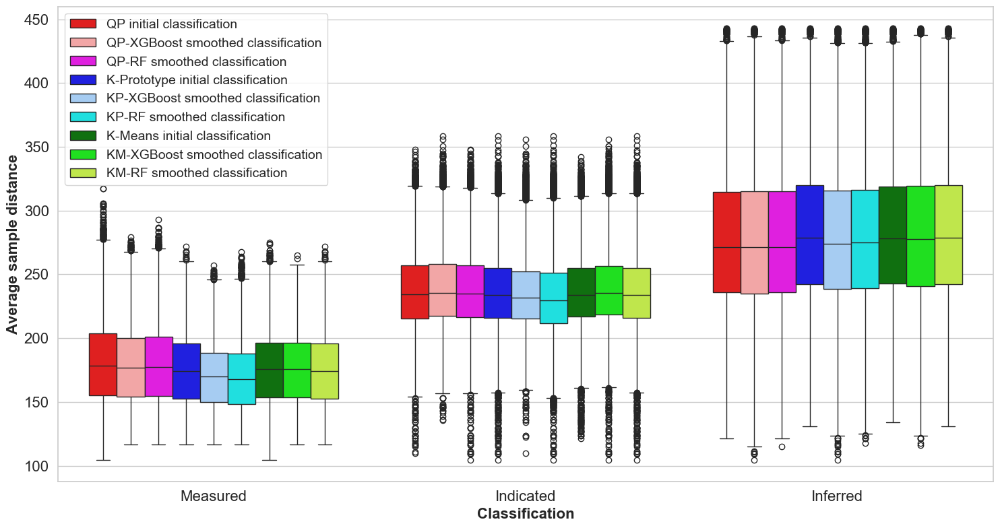

In [433]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Crear una lista con todas las bases de datos
bases_de_datos = [
    (df00, 'QP initial classification'),
    (df01, 'QP-XGBoost smoothed classification'),
    (df02, 'QP-RF smoothed classification'),
    (df, 'K-Prototype initial classification'),
    (df1, 'KP-XGBoost smoothed classification'),
    (df2, 'KP-RF smoothed classification'),
    (df_copy, 'K-Means initial classification'),
    (df11, 'KM-XGBoost smoothed classification'),
    (df22, 'KM-RF smoothed classification')
]

# Preparar un DataFrame combinado para boxplots
datos_combinados = []
for df, nombre in bases_de_datos:
    columna_categoria = 'Categoria_suavizada' if 'Categoria_suavizada' in df.columns else 'Categoria'
    if columna_categoria in df.columns and 'OK_average_sample_distance' in df.columns:
        temp_df = df[[columna_categoria, 'OK_average_sample_distance']].copy()
        temp_df['Base'] = nombre
        temp_df.rename(columns={columna_categoria: 'Categoria'}, inplace=True)
        datos_combinados.append(temp_df)

# Concatenar los datos en un único DataFrame
datos_combinados_df = pd.concat(datos_combinados, ignore_index=True)

# Mapear las categorías a nombres más descriptivos
datos_combinados_df['Categoria'] = datos_combinados_df['Categoria'].map({
    0: 'Inferred',
    1: 'Measured',
    2: 'Indicated'
})

# Ordenar las categorías en el eje x
datos_combinados_df['Categoria'] = pd.Categorical(
    datos_combinados_df['Categoria'], categories=['Measured', 'Indicated', 'Inferred'], ordered=True
)

# Configurar el estilo del gráfico
sns.set_theme(style="whitegrid")

# Crear el boxplot
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=datos_combinados_df,
    x='Categoria',
    y='OK_average_sample_distance',
    hue='Base',
    palette={
        'QP initial classification': 'red',
        'QP-XGBoost smoothed classification': '#FF9999',
        'QP-RF smoothed classification': '#FF00FF',
        'K-Prototype initial classification': 'blue',
        'KP-XGBoost smoothed classification': '#99CCFF',
        'KP-RF smoothed classification': '#00FFFF',
        'K-Means initial classification': 'green',
        'KM-XGBoost smoothed classification': '#00FF00',
        'KM-RF smoothed classification': '#CCFF33'
    }
)

# Configurar etiquetas y título del gráfico
plt.xlabel('Classification', fontsize=16, fontweight='bold')
plt.ylabel('Average sample distance', fontsize=16, fontweight='bold')
plt.title('', fontsize=18, fontweight='bold')
plt.legend(title='', fontsize=14, title_fontsize=14)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('Average sample distance.jpg', dpi=800)

# Mostrar el gráfico
plt.show()



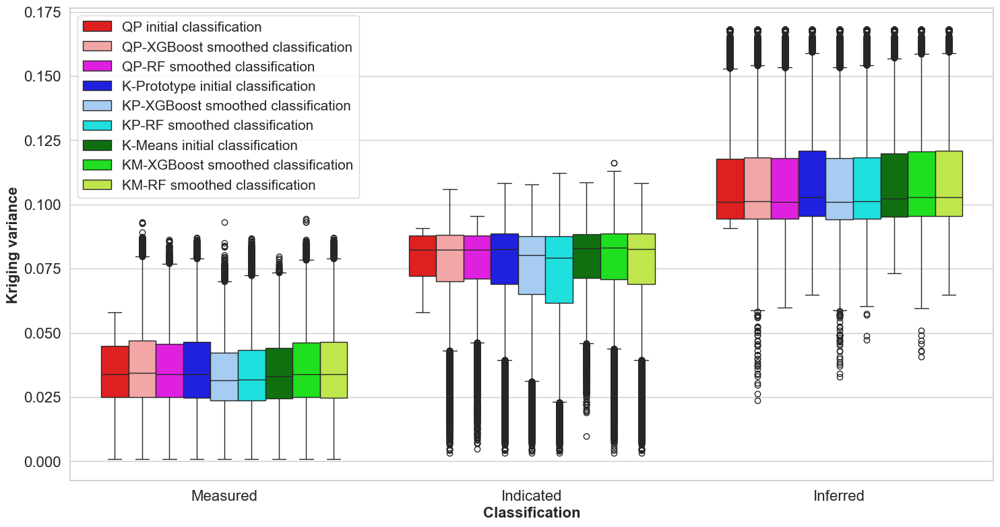

In [434]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Crear una lista con todas las bases de datos
bases_de_datos = [
    (df00, 'QP initial classification'),
    (df01, 'QP-XGBoost smoothed classification'),
    (df02, 'QP-RF smoothed classification'),
    (df, 'K-Prototype initial classification'),
    (df1, 'KP-XGBoost smoothed classification'),
    (df2, 'KP-RF smoothed classification'),
    (df_copy, 'K-Means initial classification'),
    (df11, 'KM-XGBoost smoothed classification'),
    (df22, 'KM-RF smoothed classification')
]

# Preparar un DataFrame combinado para boxplots
datos_combinados = []
for df, nombre in bases_de_datos:
    columna_categoria = 'Categoria_suavizada' if 'Categoria_suavizada' in df.columns else 'Categoria'
    if columna_categoria in df.columns and 'OK_krig_var' in df.columns:
        temp_df = df[[columna_categoria, 'OK_krig_var']].copy()
        temp_df['Base'] = nombre
        temp_df.rename(columns={columna_categoria: 'Categoria'}, inplace=True)
        datos_combinados.append(temp_df)

# Concatenar los datos en un único DataFrame
datos_combinados_df = pd.concat(datos_combinados, ignore_index=True)

# Mapear las categorías a nombres más descriptivos
datos_combinados_df['Categoria'] = datos_combinados_df['Categoria'].map({
    0: 'Inferred',
    1: 'Measured',
    2: 'Indicated'
})

# Ordenar las categorías en el eje x
datos_combinados_df['Categoria'] = pd.Categorical(
    datos_combinados_df['Categoria'], categories=['Measured', 'Indicated', 'Inferred'], ordered=True
)

# Configurar el estilo del gráfico
sns.set_theme(style="whitegrid")

# Crear el boxplot
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=datos_combinados_df,
    x='Categoria',
    y='OK_krig_var',
    hue='Base',
    palette={
        'QP initial classification': 'red',
        'QP-XGBoost smoothed classification': '#FF9999',
        'QP-RF smoothed classification': '#FF00FF',
        'K-Prototype initial classification': 'blue',
        'KP-XGBoost smoothed classification': '#99CCFF',
        'KP-RF smoothed classification': '#00FFFF',
        'K-Means initial classification': 'green',
        'KM-XGBoost smoothed classification': '#00FF00',
        'KM-RF smoothed classification': '#CCFF33'
    }
)

# Configurar etiquetas y título del gráfico
plt.xlabel('Classification', fontsize=16, fontweight='bold')
plt.ylabel('Kriging variance', fontsize=16, fontweight='bold')
plt.title('', fontsize=18, fontweight='bold')
plt.legend(title='', fontsize=15, title_fontsize=14)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('varianza kriging.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


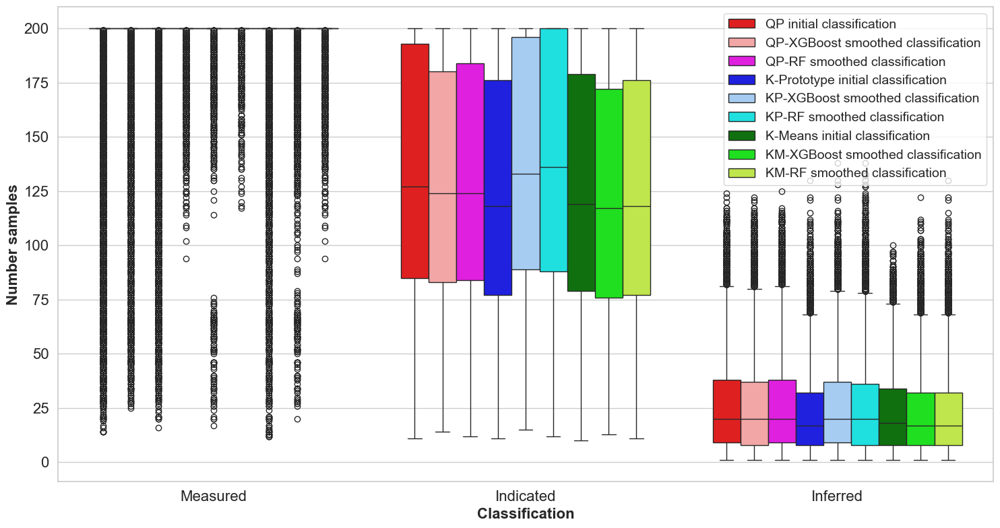

In [435]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Crear una lista con todas las bases de datos
bases_de_datos = [
    (df00, 'QP initial classification'),
    (df01, 'QP-XGBoost smoothed classification'),
    (df02, 'QP-RF smoothed classification'),
    (df, 'K-Prototype initial classification'),
    (df1, 'KP-XGBoost smoothed classification'),
    (df2, 'KP-RF smoothed classification'),
    (df_copy, 'K-Means initial classification'),
    (df11, 'KM-XGBoost smoothed classification'),
    (df22, 'KM-RF smoothed classification')
]

# Preparar un DataFrame combinado para boxplots
datos_combinados = []
for df, nombre in bases_de_datos:
    columna_categoria = 'Categoria_suavizada' if 'Categoria_suavizada' in df.columns else 'Categoria'
    if columna_categoria in df.columns and 'OK_n_samples' in df.columns:
        temp_df = df[[columna_categoria, 'OK_n_samples']].copy()
        temp_df['Base'] = nombre
        temp_df.rename(columns={columna_categoria: 'Categoria'}, inplace=True)
        datos_combinados.append(temp_df)

# Concatenar los datos en un único DataFrame
datos_combinados_df = pd.concat(datos_combinados, ignore_index=True)

# Mapear las categorías a nombres más descriptivos
datos_combinados_df['Categoria'] = datos_combinados_df['Categoria'].map({
    0: 'Inferred',
    1: 'Measured',
    2: 'Indicated'
})

# Ordenar las categorías en el eje x
datos_combinados_df['Categoria'] = pd.Categorical(
    datos_combinados_df['Categoria'], categories=['Measured', 'Indicated', 'Inferred'], ordered=True
)

# Configurar el estilo del gráfico
sns.set_theme(style="whitegrid")

# Crear el boxplot
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=datos_combinados_df,
    x='Categoria',
    y='OK_n_samples',
    hue='Base',
    palette={
        'QP initial classification': 'red',
        'QP-XGBoost smoothed classification': '#FF9999',
        'QP-RF smoothed classification': '#FF00FF',
        'K-Prototype initial classification': 'blue',
        'KP-XGBoost smoothed classification': '#99CCFF',
        'KP-RF smoothed classification': '#00FFFF',
        'K-Means initial classification': 'green',
        'KM-XGBoost smoothed classification': '#00FF00',
        'KM-RF smoothed classification': '#CCFF33'
    }
)

# Configurar etiquetas y título del gráfico
plt.xlabel('Classification', fontsize=16, fontweight='bold')
plt.ylabel('Number samples', fontsize=16, fontweight='bold')
plt.title('', fontsize=18, fontweight='bold')
plt.legend(title='', fontsize=14, title_fontsize=14)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('n muestras.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


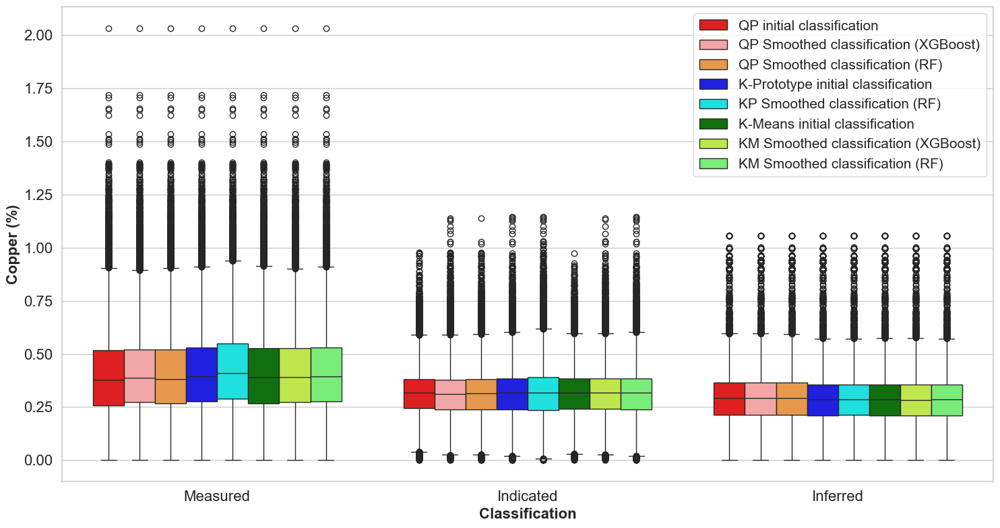

In [367]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Crear una lista con todas las bases de datos
bases_de_datos = [
    (df00, 'QP initial classification'),
    (df01, 'QP Smoothed classification (XGBoost)'),
    (df02, 'QP Smoothed classification (RF)'),
    (df, 'K-Prototype initial classification'),
    (df1, 'KP Smoothed classification (XGBoost)'),
    (df2, 'KP Smoothed classification (RF)'),
    (df_copy, 'K-Means initial classification'),
    (df11, 'KM Smoothed classification (XGBoost)'),
    (df22, 'KM Smoothed classification (RF)')
]

# Preparar un DataFrame combinado para boxplots
datos_combinados = []
for df, nombre in bases_de_datos:
    columna_categoria = 'Categoria_suavizada' if 'Categoria_suavizada' in df.columns else 'Categoria'
    if columna_categoria in df.columns and 'OK' in df.columns:
        temp_df = df[[columna_categoria, 'OK']].copy()
        temp_df['Base'] = nombre
        temp_df.rename(columns={columna_categoria: 'Categoria'}, inplace=True)
        datos_combinados.append(temp_df)

# Concatenar los datos en un único DataFrame
datos_combinados_df = pd.concat(datos_combinados, ignore_index=True)

# Mapear las categorías a nombres más descriptivos
datos_combinados_df['Categoria'] = datos_combinados_df['Categoria'].map({
    0: 'Inferred',
    1: 'Measured',
    2: 'Indicated'
})

# Ordenar las categorías en el eje x
datos_combinados_df['Categoria'] = pd.Categorical(
    datos_combinados_df['Categoria'], categories=['Measured', 'Indicated', 'Inferred'], ordered=True
)

# Configurar el estilo del gráfico
sns.set_theme(style="whitegrid")

# Crear el boxplot
plt.figure(figsize=(15, 8))
sns.boxplot(
    data=datos_combinados_df,
    x='Categoria',
    y='OK',
    hue='Base',
    palette={
        'QP initial classification': 'red',
        'K-Prototype initial classification': 'blue',
        'K-Means initial classification': 'green',
        'QP Smoothed classification (XGBoost)': '#FF9999',
        'KP Smoothed classification (XGBoost)': '#99CCFF',
        'KM Smoothed classification (XGBoost)': '#CCFF33',
        'QP Smoothed classification (RF)': '#FF9933',
        'KP Smoothed classification (RF)': '#00FFFF',
        'KM Smoothed classification (RF)': '#66FF66'
    }
)

# Configurar etiquetas y título del gráfico
plt.xlabel('Classification', fontsize=16, fontweight='bold')
plt.ylabel('Copper (%)', fontsize=16, fontweight='bold')
plt.title('', fontsize=18, fontweight='bold')
plt.legend(title='', fontsize=15, title_fontsize=14)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.tight_layout()
plt.savefig('OK.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


In [368]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Generar una matriz de confusión normalizada para cada modelo híbrido
modelos = {
    "QP XGBoost": (df00["Categoria"], df01["Categoria_suavizada"]),
    "QP RF": (df00["Categoria"], df02["Categoria_suavizada"]),
    "K-Prototype XGBoost": (df["Categoria"], df1["Categoria_suavizada"]),
    "K-Prototype RF": (df["Categoria"], df2["Categoria_suavizada"]),
    "K-Means XGBoost": (df_copy["Categoria"], df11["Categoria_suavizada"]),
    "K-Means RF": (df_copy["Categoria"], df22["Categoria_suavizada"]),
}

for modelo, (y_true, y_pred) in modelos.items():
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Inferido", "Medido", "Indicado"])
    disp.plot(cmap="Blues", values_format=".2f")
    plt.title(f"Matriz de Confusión Normalizada: {modelo}")
    plt.show()


KeyError: 'Categoria_suavizada'

In [ ]:
import pandas as pd

# Calcular precisión por categoría para cada modelo
resultados = []
for modelo, (y_true, y_pred) in modelos.items():
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    for i, categoria in enumerate(["Inferido", "Medido", "Indicado"]):
        resultados.append({"Modelo": modelo, "Categoría": categoria, "Precisión": cm[i, i]})

# Crear un DataFrame con los resultados
df_resultados = pd.DataFrame(resultados)

# Graficar un boxplot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_resultados, x="Categoría", y="Precisión", hue="Modelo", palette="Set2")
plt.title("Precisión por Categoría para Cada Modelo Híbrido", fontsize=14, fontweight="bold")
plt.xlabel("Categoría", fontsize=12)
plt.ylabel("Precisión", fontsize=12)
plt.legend(title="Modelo", fontsize=10)
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar los modelos de interés (K-Prototype y K-Means)
modelos_filtrados = {
    "K-Prototype XGBoost": (df["Categoria"], df1["Categoria_suavizada"]),
    "K-Prototype RF": (df["Categoria"], df2["Categoria_suavizada"]),
    "K-Means XGBoost": (df_copy["Categoria"], df11["Categoria_suavizada"]),
    "K-Means RF": (df_copy["Categoria"], df22["Categoria_suavizada"]),
}

# Calcular los volúmenes relativos por modelo
volumenes = []
for modelo, (y_true, y_pred) in modelos_filtrados.items():
    categorias = ["Medido", "Indicado", "Inferido"]  # Cambiar el orden en el eje x
    for i, categoria in enumerate(categorias):
        volumen_original = (y_true == i).sum()
        volumen_suavizado = (y_pred == i).sum()
        # Reducir el impacto del cambio al dividir por un factor de escala (10 en este caso)
        cambio = (((volumen_suavizado - volumen_original) / volumen_original) * 100 / 10) if volumen_original > 0 else 0
        volumenes.append({"Modelo": modelo, "Categoría": categoria, "Cambio (%)": cambio})

# Crear un DataFrame con los volúmenes
df_volumenes = pd.DataFrame(volumenes)

# Configurar el estilo de Seaborn para un gráfico profesional
sns.set_theme(style="whitegrid")

# Graficar el cambio porcentual
plt.figure(figsize=(14, 10))
sns.barplot(
    data=df_volumenes,
    x="Categoría",
    y="Cambio (%)",
    hue="Modelo",
    palette={
        "K-Prototype XGBoost": "#003f5c",
        "K-Prototype RF": "#bc5090",
        "K-Means XGBoost": "#ffa600",
        "K-Means RF": "#58508d"
    },
    linewidth=1.5
)

# Añadir línea de referencia en 0%
plt.axhline(0, color="black", linestyle="--", linewidth=1.5)

# Mejorar la visualización de etiquetas y título del gráfico
plt.title("Cambio Porcentual Escalado en Volúmenes por Modelo", fontsize=20, fontweight="bold")
plt.xlabel("Categoría", fontsize=16, fontweight="bold")
plt.ylabel("Cambio Escalado (%)", fontsize=16, fontweight="bold")
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14)
plt.legend(title="Modelo", fontsize=14, title_fontsize=16, loc="upper right")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Ajustar márgenes y mostrar el gráfico
plt.tight_layout()
plt.show()



In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar los modelos de interés (K-Prototype y K-Means)
modelos_filtrados = {
    "K-Prototype XGBoost": (df["Categoria"], df1["Categoria_suavizada"]),
    "K-Prototype RF": (df["Categoria"], df2["Categoria_suavizada"]),
    "K-Means XGBoost": (df_copy["Categoria"], df11["Categoria_suavizada"]),
    "K-Means RF": (df_copy["Categoria"], df22["Categoria_suavizada"]),
}

# Calcular los volúmenes relativos por modelo
volumenes = []
for modelo, (y_true, y_pred) in modelos_filtrados.items():
    categorias = ["Medido", "Indicado", "Inferido"]  # Cambiar el orden en el eje x
    for i, categoria in enumerate(categorias):
        volumen_original = (y_true == i).sum()
        volumen_suavizado = (y_pred == i).sum()
        # Reducir el impacto del cambio al dividir por un factor de escala (10 en este caso)
        cambio = (((volumen_suavizado - volumen_original) / volumen_original) * 100 / 10) if volumen_original > 0 else 0
        volumenes.append({"Modelo": modelo, "Categoría": categoria, "Cambio (%)": cambio})

# Crear un DataFrame con los volúmenes
df_volumenes = pd.DataFrame(volumenes)

# Configurar el estilo de Seaborn para un gráfico profesional
sns.set_theme(style="whitegrid")

# Graficar el cambio porcentual
plt.figure(figsize=(14, 10))
ax = sns.barplot(
    data=df_volumenes,
    x="Categoría",
    y="Cambio (%)",
    hue="Modelo",
    palette={
        "K-Prototype XGBoost": "#003f5c",
        "K-Prototype RF": "#bc5090",
        "K-Means XGBoost": "#ffa600",
        "K-Means RF": "#58508d"
    },
    linewidth=1.5
)

# Añadir los valores numéricos en las barras
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
        textcoords='offset points'
    )

# Añadir línea de referencia en 0%
plt.axhline(0, color="black", linestyle="--", linewidth=1.5)

# Mejorar la visualización de etiquetas y título del gráfico
plt.title("", fontsize=20, fontweight="bold")
plt.xlabel("Categoría", fontsize=16, fontweight="bold")
plt.ylabel("Change (%)", fontsize=16, fontweight="bold")
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14)
plt.legend(title="Modelo", fontsize=14, title_fontsize=16, loc="best")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Ajustar márgenes y mostrar el gráfico
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar los modelos de interés (K-Prototype y K-Means)
modelos_filtrados = {
    "K-Prototype XGBoost": (df["Categoria"], df1["Categoria_suavizada"]),
    "K-Prototype RF": (df["Categoria"], df2["Categoria_suavizada"]),
    "K-Means XGBoost": (df_copy["Categoria"], df11["Categoria_suavizada"]),
    "K-Means RF": (df_copy["Categoria"], df22["Categoria_suavizada"]),
}

# Calcular los volúmenes relativos por modelo
volumenes = []
for modelo, (y_true, y_pred) in modelos_filtrados.items():
    categorias = ["Medido", "Indicado", "Inferido"]  # Cambiar el orden en el eje x
    for i, categoria in enumerate(categorias):
        volumen_original = (y_true == i).sum()
        volumen_suavizado = (y_pred == i).sum()
        # Asegurar que el cambio porcentual sea positivo
        cambio = (abs(volumen_suavizado - volumen_original) / volumen_original * 100 / 10) if volumen_original > 0 else 0
        volumenes.append({"Modelo": modelo, "Categoría": categoria, "Cambio (%)": cambio})

# Crear un DataFrame con los volúmenes
df_volumenes = pd.DataFrame(volumenes)

# Configurar el estilo de Seaborn para un gráfico profesional
sns.set_theme(style="whitegrid")

# Graficar el cambio porcentual
plt.figure(figsize=(14, 10))
ax = sns.barplot(
    data=df_volumenes,
    x="Categoría",
    y="Cambio (%)",
    hue="Modelo",
    palette={
        "K-Prototype XGBoost": "#003f5c",
        "K-Prototype RF": "#bc5090",
        "K-Means XGBoost": "#ffa600",
        "K-Means RF": "#58508d"
    },
    linewidth=1.5
)

# Añadir los valores numéricos en las barras
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center', va='center', fontsize=12, color='black', xytext=(0, 5),
        textcoords='offset points'
    )

# Añadir línea de referencia en 0%
plt.axhline(0, color="black", linestyle="--", linewidth=1.5)

# Mejorar la visualización de etiquetas y título del gráfico
plt.title("Cambio Porcentual Absoluto en Volúmenes por Modelo", fontsize=20, fontweight="bold")
plt.xlabel("Categoría", fontsize=16, fontweight="bold")
plt.ylabel("Change (%)", fontsize=16, fontweight="bold")
plt.xticks(fontsize=14, fontweight="bold")
plt.yticks(fontsize=14)
plt.legend(title="Modelo", fontsize=14, title_fontsize=16, loc="best")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Ajustar márgenes y mostrar el gráfico
plt.tight_layout()
plt.show()


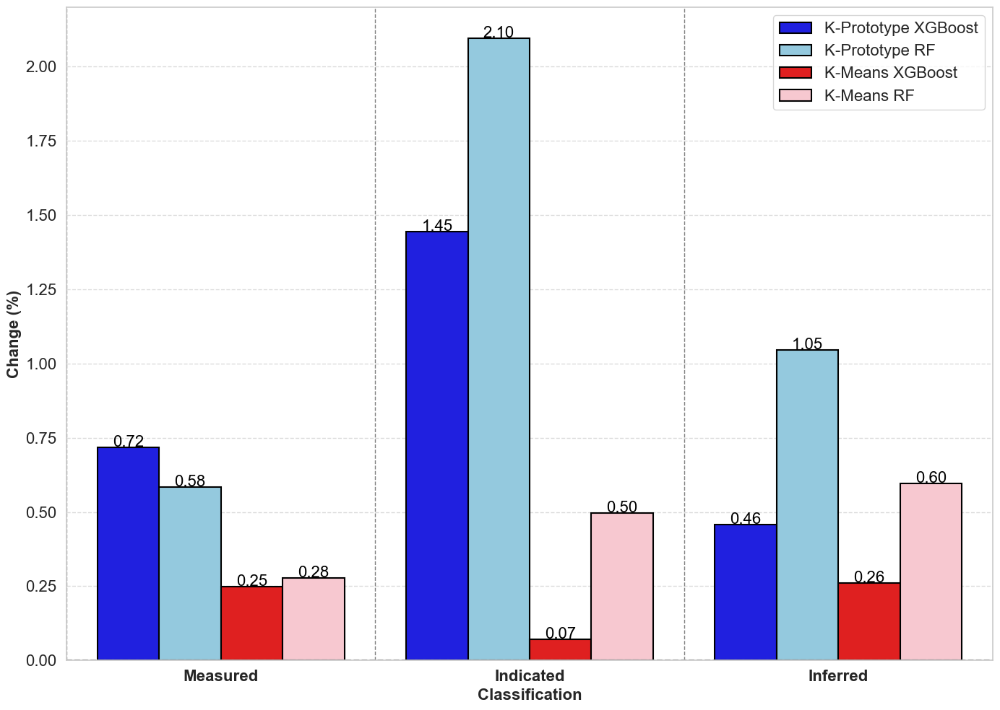

In [432]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Filtrar los modelos de interés (K-Prototype y K-Means)
modelos_filtrados = {
    "K-Prototype XGBoost": (df["Categoria"], df1["Categoria_suavizada"]),
    "K-Prototype RF": (df["Categoria"], df2["Categoria_suavizada"]),
    "K-Means XGBoost": (df_copy["Categoria"], df11["Categoria_suavizada"]),
    "K-Means RF": (df_copy["Categoria"], df22["Categoria_suavizada"]),
}

# Calcular los volúmenes relativos por modelo
volumenes = []
for modelo, (y_true, y_pred) in modelos_filtrados.items():
    categorias = ["Measured", "Indicated", "Inferred"]  # Cambiar el orden en el eje x
    for i, categoria in enumerate(categorias):
        volumen_original = (y_true == i).sum()
        volumen_suavizado = (y_pred == i).sum()
        # Asegurar que el cambio porcentual sea positivo
        cambio = (abs(volumen_suavizado - volumen_original) / volumen_original * 100 / 10) if volumen_original > 0 else None
        volumenes.append({"Modelo": modelo, "Categoría": categoria, "Cambio (%)": cambio})

# Crear un DataFrame con los volúmenes
df_volumenes = pd.DataFrame(volumenes).dropna()

# Configurar el estilo de Seaborn para un gráfico profesional
sns.set_theme(style="whitegrid")

# Graficar el cambio porcentual
plt.figure(figsize=(14, 10))
ax = sns.barplot(
    data=df_volumenes,
    x="Categoría",
    y="Cambio (%)",
    hue="Modelo",
    palette={
        "K-Prototype XGBoost": "blue",
        "K-Prototype RF": "skyblue",
        "K-Means XGBoost": "red",
        "K-Means RF": "pink"
    },
    edgecolor="black",  # Bordes en las barras
    linewidth=1.5
)

# Añadir los valores numéricos en las barras
for p in ax.patches:
    if p.get_height() > 0.01:  # Evitar mostrar valores cercanos a cero
        ax.annotate(
            f'{p.get_height():.2f}',
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center', fontsize=16, color='black', xytext=(0, 5),
            textcoords='offset points'
        )

# Añadir línea de referencia en 0%
plt.axhline(0, color="black", linestyle="--", linewidth=1.5)

# Añadir líneas verticales entre categorías
for x in [-0.5, 0.5, 1.5]:
    plt.axvline(x=x, color="gray", linestyle="--", linewidth=1)

# Mejorar la visualización de etiquetas y título del gráfico
plt.title("", fontsize=20, fontweight="bold")
plt.xlabel("Classification", fontsize=16, fontweight="bold")
plt.ylabel("Change (%)", fontsize=16, fontweight="bold")
plt.xticks(fontsize=16, fontweight="bold")
plt.yticks(fontsize=16)
plt.legend(title="", fontsize=16, title_fontsize=16, loc="best")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Ajustar márgenes y mostrar el gráfico
plt.tight_layout()
plt.savefig("cambios porcentuales.jpg", dpi=800)
plt.show()


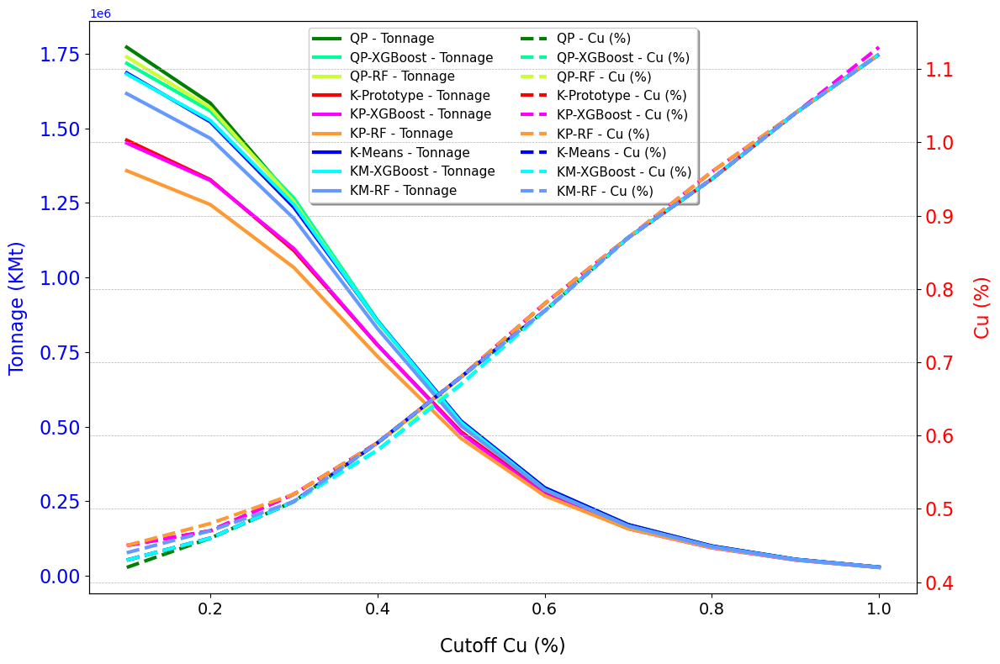

In [13]:
import matplotlib.pyplot as plt
import pandas as pd

# Data for Original, XGBoost, RF, and ANN models
data_QP = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1771961.4,1584419.4,1256531.4,852819.3,  518038.2,295099.2, 171954.9, 100229.4,55393.2, 29311.2],
    "Cu (%)": [0.42, 0.46, 0.51, 0.59, 0.68, 0.77, 0.87, 0.95, 1.04, 1.12],
}
data_QPxgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1717686, 1558151.1,1265846.4,856855.8,  514622.7,291000.6, 167111.1,97434.9,  54027,  28752.3   ],
    "Cu (%)": [0.43, 0.46, 0.51, 0.58, 0.67, 0.77, 0.87, 0.95, 1.04, 1.12],
}
data_QPrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1739296.8, 1569515.4, 1253612.7,850024.8, 518038.2,293422.5, 169408.8,98801.1,54648, 29124.9     ],
    "Cu (%)": [0.43, 0.46, 0.51, 0.59, 0.67, 0.77, 0.87, 0.95, 1.04, 1.12],
}
data_KP = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1460281.5,1327884.3, 1090413.9, 773517.6,483075.9, 279636.3, 164254.5, 97683.3, 54834.3,29124.9      ],
    "Cu (%)": [0.45, 0.47, 0.52, 0.59, 0.68, 0.78, 0.87, 0.95, 1.04, 1.12],
}

data_KPxgboost= {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1450780.2, 1325338.2,1096686,  774511.2, 477859.5, 272619,  158292.9,  94019.4, 53157.6, 28317.6  ],
    "Cu (%)": [0.45, 0.47, 0.52, 0.59, 0.68, 0.78, 0.87, 0.96, 1.04, 1.13],
}
data_KPrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1358002.8,1244297.7,1033344, 735574.5, 460719.9,268582.5,   158106.6, 94640.4, 53281.8, 28441.8   ],
    "Cu (%)": [0.45, 0.48, 0.52, 0.59, 0.68, 0.78, 0.87, 0.96, 1.04, 1.12],
}
data_KM = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [ 1685704.5, 1521636.3, 1235355.3,854433.9,519031.8, 295409.7,  171271.8,100167.3,55641.6,29311.2 ],
    "Cu (%)": [0.43, 0.46, 0.51, 0.59, 0.68, 0.77, 0.87, 0.95, 1.04, 1.12],
}
data_KMxgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1681668, 1526604.3, 1244980.8, 853564.5,514250.1,289696.5, 167359.5,  98055.9, 54772.2, 28814.4 ],
    "Cu (%)": [0.43, 0.46, 0.51, 0.58, 0.67, 0.77, 0.87, 0.95, 1.04, 1.12],
}

# Datos para SVM
data_KMrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [ 1616338.8,1466367.3, 1197784.8,828724.5,502823.7, 287709.3,  167173.2,97683.3, 54275.4,  28628.1],
    "Cu (%)": [0.44, 0.47, 0.51, 0.59, 0.68, 0.77, 0.87, 0.95, 1.04, 1.12],
}

# Convertir los datos a DataFrames
df_QP = pd.DataFrame(data_QP)
df_QPxgboost = pd.DataFrame(data_QPxgboost)
df_QRrf = pd.DataFrame(data_QPrf)
df_KP = pd.DataFrame(data_KP)
df_KPxgboost = pd.DataFrame(data_KPxgboost)  # Nuevo DataFrame para SVM
df_KPrf = pd.DataFrame(data_KPrf)
df_KM = pd.DataFrame(data_KM)
df_KMxgboost = pd.DataFrame(data_KMxgboost)
df_KMrf = pd.DataFrame(data_KMrf)  # Nuevo DataFrame para SVM

# Crear la figura
fig, ax1 = plt.subplots(figsize=(12, 8))

# Graficar el tonelaje para todos los modelos
ax1.plot(df_QP["Cutoff Cu (%)"], df_QP["Tonelaje"], color="green", linestyle="-", linewidth=3, label="QP - Tonnage")
ax1.plot(df_QPxgboost["Cutoff Cu (%)"], df_QPxgboost["Tonelaje"], color="#00FF99", linestyle="-", linewidth=3, label="QP-XGBoost - Tonnage")
ax1.plot(df_QRrf["Cutoff Cu (%)"], df_QRrf["Tonelaje"], color="#CCFF33", linestyle="-", linewidth=3, label="QP-RF - Tonnage")
ax1.plot(df_KP["Cutoff Cu (%)"], df_KP["Tonelaje"], color="red", linestyle="-", linewidth=3, label="K-Prototype - Tonnage")
ax1.plot(df_KPxgboost["Cutoff Cu (%)"], df_KPxgboost["Tonelaje"], color="#FF00FF", linestyle="-", linewidth=3, label="KP-XGBoost - Tonnage")  # Nueva curva SVM
ax1.plot(df_KPrf["Cutoff Cu (%)"], df_KPrf["Tonelaje"], color="#FF9933", linestyle="-", linewidth=3, label="KP-RF - Tonnage")
ax1.plot(df_KM["Cutoff Cu (%)"], df_KM["Tonelaje"], color="blue", linestyle="-", linewidth=3, label="K-Means - Tonnage")
ax1.plot(df_KMxgboost["Cutoff Cu (%)"], df_KMxgboost["Tonelaje"], color="#00FFFF", linestyle="-", linewidth=3, label="KM-XGBoost - Tonnage")
ax1.plot(df_KMrf["Cutoff Cu (%)"], df_KMrf["Tonelaje"], color="#6699FF", linestyle="-", linewidth=3, label="KM-RF - Tonnage")  # Nueva curva SVM

ax1.set_xlabel("Cutoff Cu (%)", fontsize=16, labelpad=16)
ax1.set_ylabel("Tonnage (KMt)", color="blue", fontsize=16, labelpad=10)
ax1.tick_params(axis="y", labelcolor="blue", labelsize=16)
ax1.tick_params(axis="x", labelsize=14)

# Graficar el porcentaje de cobre en un eje Y secundario
ax2 = ax1.twinx()
ax2.plot(df_QP["Cutoff Cu (%)"], df_QP["Cu (%)"], color="green", linestyle="--", linewidth=3, label="QP - Cu (%)")
ax2.plot(df_QPxgboost["Cutoff Cu (%)"], df_QPxgboost["Cu (%)"], color="#00FF99", linestyle="--", linewidth=3, label="QP-XGBoost - Cu (%)")
ax2.plot(df_QRrf["Cutoff Cu (%)"], df_QRrf["Cu (%)"], color="#CCFF33", linestyle="--", linewidth=3, label="QP-RF - Cu (%)")
ax2.plot(df_KP["Cutoff Cu (%)"], df_KP["Cu (%)"], color="red", linestyle="--", linewidth=3, label="K-Prototype - Cu (%)")
ax2.plot(df_KPxgboost["Cutoff Cu (%)"], df_KPxgboost["Cu (%)"], color="#FF00FF", linestyle="--", linewidth=3, label="KP-XGBoost - Cu (%)")  # Nueva curva SVM
ax2.plot(df_KPrf["Cutoff Cu (%)"], df_KPrf["Cu (%)"], color="#FF9933", linestyle="--", linewidth=3, label="KP-RF - Cu (%)")
ax2.plot(df_KM["Cutoff Cu (%)"], df_KM["Cu (%)"], color="blue", linestyle="--", linewidth=3, label="K-Means - Cu (%)")
ax2.plot(df_KMxgboost["Cutoff Cu (%)"], df_KMxgboost["Cu (%)"], color="#00FFFF", linestyle="--", linewidth=3, label="KM-XGBoost - Cu (%)")
ax2.plot(df_KMrf["Cutoff Cu (%)"], df_KMrf["Cu (%)"], color="#6699FF", linestyle="--", linewidth=3, label="KM-RF - Cu (%)")  # Nueva curva SVM

ax2.set_ylabel("Cu (%)", color="red", fontsize=16, labelpad=16)
ax2.tick_params(axis="y", labelcolor="red", labelsize=16)

# Configurar la leyenda
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
legend = ax1.legend(
    lines1 + lines2, 
    labels1 + labels2, 
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.0),  
    ncol=2, 
    fontsize=11, 
    frameon=True, 
    shadow=True
)
legend.get_frame().set_facecolor('white')  # Fondo gris claro
legend.get_frame().set_alpha(1)  # Transparencia

# Título y cuadrícula
plt.title("", fontsize=16, pad=20)
plt.grid(visible=True, linestyle="--", linewidth=0.5)

# Ajustar el diseño
plt.tight_layout()

# Guardar la figura
plt.savefig('medidos.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


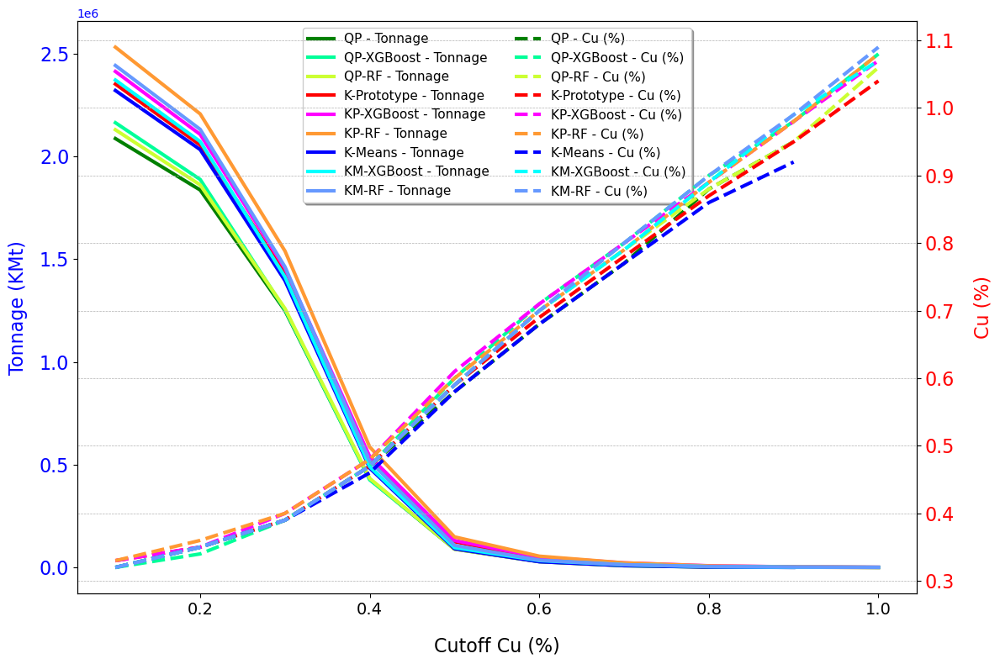

In [14]:
import matplotlib.pyplot as plt
import pandas as pd

# Data for Original, XGBoost, RF, and ANN models
data_QP = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90],
    "Tonelaje": [2086497.9,1836172.8, 1249576.2,  428800.5,89424, 28379.7,8631.9, 2049.3,683.1 ],
    "Cu (%)": [0.32, 0.35, 0.39, 0.47, 0.58, 0.68, 0.77, 0.88, 0.95],
}
data_QPxgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2163564,1887529.5,1253612.7,426378.6,92653.2, 32416.2,13475.7,  4843.8,2049.3,  558.9],
    "Cu (%)": [0.32, 0.34, 0.39, 0.47, 0.60, 0.71, 0.80, 0.90, 0.98, 1.08],
}
data_QPrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2129222.7, 1861012.8, 1259698.5,433023.3,89237.7,30056.4, 11178, 3477.6,1428.3,  186.3 ],
    "Cu (%)": [0.32, 0.35, 0.39, 0.47, 0.59, 0.70, 0.79, 0.88, 0.95, 1.06],
}
data_KP = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2351664.9, 2054826.9, 1430970.3,533563.2,125379.9,  43842.6, 16332.3,4595.4, 1242, 186.3  ],
    "Cu (%)": [0.33, 0.35, 0.39, 0.47, 0.59, 0.69, 0.78, 0.87, 0.95, 1.04],
}

data_KPxgboost= {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2412895.5, 2106680.4, 1455189.3, 539400.6, 131031, 50859.9, 22293.9, 8259.3,  2918.7, 993.6 ],
    "Cu (%)": [0.33, 0.35, 0.40, 0.48, 0.61, 0.71, 0.80, 0.89, 0.98, 1.07],
}
data_KPrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2531071.8,2206413, 1539583.2, 586037.7, 148791.6,  54896.4, 22480.2, 7638.3, 2794.5,869.4 ],
    "Cu (%)": [0.33, 0.36, 0.40, 0.48, 0.60, 0.70, 0.79, 0.89, 0.98, 1.08],
}
data_KM = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90],
    "Tonelaje": [ 2320242.3, 2032781.4, 1395387,483262.2, 91287,28069.2, 9315,  2111.4,  434.7 ],
    "Cu (%)": [0.32, 0.35, 0.39, 0.46, 0.58, 0.68, 0.77, 0.86, 0.92],
}
data_KMxgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2371164.3,  2071904.4, 1413706.5, 490093.2,96627.6, 33782.4, 13227.3, 4222.8,  1304.1, 496.8],
    "Cu (%)": [0.32, 0.35, 0.39, 0.47, 0.59, 0.70, 0.79, 0.89, 0.99, 1.07],
}

# Datos para SVM
data_KMrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [ 2441834.1,2131209.9,1462765.5, 517106.7,  107681.4, 35769.6, 13413.6, 4595.4,1800.9,  683.1],
    "Cu (%)": [0.32, 0.35, 0.39, 0.47, 0.59, 0.70, 0.80, 0.90, 0.99, 1.09],
}

# Convertir los datos a DataFrames
df_QP = pd.DataFrame(data_QP)
df_QPxgboost = pd.DataFrame(data_QPxgboost)
df_QRrf = pd.DataFrame(data_QPrf)
df_KP = pd.DataFrame(data_KP)
df_KPxgboost = pd.DataFrame(data_KPxgboost)  # Nuevo DataFrame para SVM
df_KPrf = pd.DataFrame(data_KPrf)
df_KM = pd.DataFrame(data_KM)
df_KMxgboost = pd.DataFrame(data_KMxgboost)
df_KMrf = pd.DataFrame(data_KMrf)  # Nuevo DataFrame para SVM

# Crear la figura
fig, ax1 = plt.subplots(figsize=(12, 8))

# Graficar el tonelaje para todos los modelos
ax1.plot(df_QP["Cutoff Cu (%)"], df_QP["Tonelaje"], color="green", linestyle="-", linewidth=3, label="QP - Tonnage")
ax1.plot(df_QPxgboost["Cutoff Cu (%)"], df_QPxgboost["Tonelaje"], color="#00FF99", linestyle="-", linewidth=3, label="QP-XGBoost - Tonnage")
ax1.plot(df_QRrf["Cutoff Cu (%)"], df_QRrf["Tonelaje"], color="#CCFF33", linestyle="-", linewidth=3, label="QP-RF - Tonnage")
ax1.plot(df_KP["Cutoff Cu (%)"], df_KP["Tonelaje"], color="red", linestyle="-", linewidth=3, label="K-Prototype - Tonnage")
ax1.plot(df_KPxgboost["Cutoff Cu (%)"], df_KPxgboost["Tonelaje"], color="#FF00FF", linestyle="-", linewidth=3, label="KP-XGBoost - Tonnage")  # Nueva curva SVM
ax1.plot(df_KPrf["Cutoff Cu (%)"], df_KPrf["Tonelaje"], color="#FF9933", linestyle="-", linewidth=3, label="KP-RF - Tonnage")
ax1.plot(df_KM["Cutoff Cu (%)"], df_KM["Tonelaje"], color="blue", linestyle="-", linewidth=3, label="K-Means - Tonnage")
ax1.plot(df_KMxgboost["Cutoff Cu (%)"], df_KMxgboost["Tonelaje"], color="#00FFFF", linestyle="-", linewidth=3, label="KM-XGBoost - Tonnage")
ax1.plot(df_KMrf["Cutoff Cu (%)"], df_KMrf["Tonelaje"], color="#6699FF", linestyle="-", linewidth=3, label="KM-RF - Tonnage")  # Nueva curva SVM

ax1.set_xlabel("Cutoff Cu (%)", fontsize=16, labelpad=16)
ax1.set_ylabel("Tonnage (KMt)", color="blue", fontsize=16, labelpad=10)
ax1.tick_params(axis="y", labelcolor="blue", labelsize=16)
ax1.tick_params(axis="x", labelsize=14)

# Graficar el porcentaje de cobre en un eje Y secundario
ax2 = ax1.twinx()
ax2.plot(df_QP["Cutoff Cu (%)"], df_QP["Cu (%)"], color="green", linestyle="--", linewidth=3, label="QP - Cu (%)")
ax2.plot(df_QPxgboost["Cutoff Cu (%)"], df_QPxgboost["Cu (%)"], color="#00FF99", linestyle="--", linewidth=3, label="QP-XGBoost - Cu (%)")
ax2.plot(df_QRrf["Cutoff Cu (%)"], df_QRrf["Cu (%)"], color="#CCFF33", linestyle="--", linewidth=3, label="QP-RF - Cu (%)")
ax2.plot(df_KP["Cutoff Cu (%)"], df_KP["Cu (%)"], color="red", linestyle="--", linewidth=3, label="K-Prototype - Cu (%)")
ax2.plot(df_KPxgboost["Cutoff Cu (%)"], df_KPxgboost["Cu (%)"], color="#FF00FF", linestyle="--", linewidth=3, label="KP-XGBoost - Cu (%)")  # Nueva curva SVM
ax2.plot(df_KPrf["Cutoff Cu (%)"], df_KPrf["Cu (%)"], color="#FF9933", linestyle="--", linewidth=3, label="KP-RF - Cu (%)")
ax2.plot(df_KM["Cutoff Cu (%)"], df_KM["Cu (%)"], color="blue", linestyle="--", linewidth=3, label="K-Means - Cu (%)")
ax2.plot(df_KMxgboost["Cutoff Cu (%)"], df_KMxgboost["Cu (%)"], color="#00FFFF", linestyle="--", linewidth=3, label="KM-XGBoost - Cu (%)")
ax2.plot(df_KMrf["Cutoff Cu (%)"], df_KMrf["Cu (%)"], color="#6699FF", linestyle="--", linewidth=3, label="KM-RF - Cu (%)")  # Nueva curva SVM

ax2.set_ylabel("Cu (%)", color="red", fontsize=16, labelpad=16)
ax2.tick_params(axis="y", labelcolor="red", labelsize=16)

# Configurar la leyenda
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
legend = ax1.legend(
    lines1 + lines2, 
    labels1 + labels2, 
    loc="upper center", 
    bbox_to_anchor=(0.5, 1.0),  
    ncol=2, 
    fontsize=11, 
    frameon=True, 
    shadow=True
)
legend.get_frame().set_facecolor('white')  # Fondo gris claro
legend.get_frame().set_alpha(1)  # Transparencia

# Título y cuadrícula
plt.title("", fontsize=16, pad=20)
plt.grid(visible=True, linestyle="--", linewidth=0.5)

# Ajustar el diseño
plt.tight_layout()

# Guardar la figura
plt.savefig('indicados.jpg', dpi=800)

# Mostrar el gráfico
plt.show()


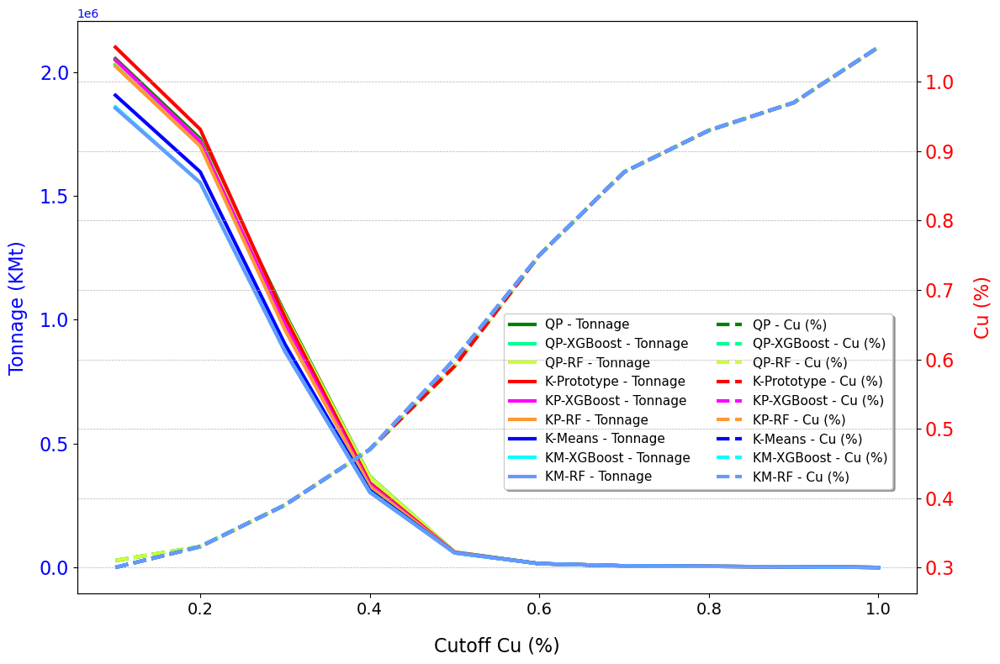

In [21]:
import matplotlib.pyplot as plt
import pandas as pd

# Data for Original, XGBoost, RF, and ANN models
data_QP = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.9, 1.00],
    "Tonelaje": [2053771.2, 1730913.3,1026140.4, 367818.3, 62596.8, 15835.5, 7079.4, 4843.8,3167.1, 621   ],
    "Cu (%)": [0.31, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_QPxgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2030980.5,1705824.9,1012788.9, 366203.7,62783.1,15897.6,  7079.4,  4843.8, 3167.1,621   ],
    "Cu (%)": [0.31, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_QPrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2043711, 1720977.3,1018936.8,  366390, 62783.1, 15835.5, 7079.4,4843.8, 3167.1,621   ],
    "Cu (%)": [0.31, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_KP = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2100284.1, 1768794.3,  1010863.8,342357.3,61603.2,  15835.5, 7079.4, 4843.8, 3167.1,  621 ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.59, 0.75, 0.87, 0.93, 0.97, 1.05],
}

data_KPxgboost= {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2048554.8,1719486.9,980372.7,335526.3,61168.5,  15835.5,  7079.4, 4843.8, 3167.1,  621 ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_KPrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [2023155.9,1700794.8,959320.8,  327825.9, 60547.5,15835.5,7079.4, 4843.8, 3167.1,621    ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_KM = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1],
    "Tonelaje": [ 1906283.7,1597087.8, 901505.7, 311742,  59740.2, 15835.5, 7079.4, 4843.8,3167.1,621   ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}
data_KMxgboost = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [1859398.2,1552996.8,873560.7, 305780.4,59181.3,15835.5,7079.4, 4843.8,  3167.1,  621   ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}

# Datos para SVM
data_KMrf = {
    "Cutoff Cu (%)": [0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00],
    "Tonelaje": [ 1854057.6,1553928.3,871697.7,303606.9, 59553.9, 15835.5,7079.4,    4843.8,3167.1, 621  ],
    "Cu (%)": [0.30, 0.33, 0.39, 0.47, 0.60, 0.75, 0.87, 0.93, 0.97, 1.05],
}

# Convertir los datos a DataFrames
df_QP = pd.DataFrame(data_QP)
df_QPxgboost = pd.DataFrame(data_QPxgboost)
df_QRrf = pd.DataFrame(data_QPrf)
df_KP = pd.DataFrame(data_KP)
df_KPxgboost = pd.DataFrame(data_KPxgboost)  # Nuevo DataFrame para SVM
df_KPrf = pd.DataFrame(data_KPrf)
df_KM = pd.DataFrame(data_KM)
df_KMxgboost = pd.DataFrame(data_KMxgboost)
df_KMrf = pd.DataFrame(data_KMrf)  # Nuevo DataFrame para SVM

# Crear la figura
fig, ax1 = plt.subplots(figsize=(12, 8))

# Graficar el tonelaje para todos los modelos
ax1.plot(df_QP["Cutoff Cu (%)"], df_QP["Tonelaje"], color="green", linestyle="-", linewidth=3, label="QP - Tonnage")
ax1.plot(df_QPxgboost["Cutoff Cu (%)"], df_QPxgboost["Tonelaje"], color="#00FF99", linestyle="-", linewidth=3, label="QP-XGBoost - Tonnage")
ax1.plot(df_QRrf["Cutoff Cu (%)"], df_QRrf["Tonelaje"], color="#CCFF33", linestyle="-", linewidth=3, label="QP-RF - Tonnage")
ax1.plot(df_KP["Cutoff Cu (%)"], df_KP["Tonelaje"], color="red", linestyle="-", linewidth=3, label="K-Prototype - Tonnage")
ax1.plot(df_KPxgboost["Cutoff Cu (%)"], df_KPxgboost["Tonelaje"], color="#FF00FF", linestyle="-", linewidth=3, label="KP-XGBoost - Tonnage")  # Nueva curva SVM
ax1.plot(df_KPrf["Cutoff Cu (%)"], df_KPrf["Tonelaje"], color="#FF9933", linestyle="-", linewidth=3, label="KP-RF - Tonnage")
ax1.plot(df_KM["Cutoff Cu (%)"], df_KM["Tonelaje"], color="blue", linestyle="-", linewidth=3, label="K-Means - Tonnage")
ax1.plot(df_KMxgboost["Cutoff Cu (%)"], df_KMxgboost["Tonelaje"], color="#00FFFF", linestyle="-", linewidth=3, label="KM-XGBoost - Tonnage")
ax1.plot(df_KMrf["Cutoff Cu (%)"], df_KMrf["Tonelaje"], color="#6699FF", linestyle="-", linewidth=3, label="KM-RF - Tonnage")  # Nueva curva SVM

ax1.set_xlabel("Cutoff Cu (%)", fontsize=16, labelpad=16)
ax1.set_ylabel("Tonnage (KMt)", color="blue", fontsize=16, labelpad=10)
ax1.tick_params(axis="y", labelcolor="blue", labelsize=16)
ax1.tick_params(axis="x", labelsize=14)

# Graficar el porcentaje de cobre en un eje Y secundario
ax2 = ax1.twinx()
ax2.plot(df_QP["Cutoff Cu (%)"], df_QP["Cu (%)"], color="green", linestyle="--", linewidth=3, label="QP - Cu (%)")
ax2.plot(df_QPxgboost["Cutoff Cu (%)"], df_QPxgboost["Cu (%)"], color="#00FF99", linestyle="--", linewidth=3, label="QP-XGBoost - Cu (%)")
ax2.plot(df_QRrf["Cutoff Cu (%)"], df_QRrf["Cu (%)"], color="#CCFF33", linestyle="--", linewidth=3, label="QP-RF - Cu (%)")
ax2.plot(df_KP["Cutoff Cu (%)"], df_KP["Cu (%)"], color="red", linestyle="--", linewidth=3, label="K-Prototype - Cu (%)")
ax2.plot(df_KPxgboost["Cutoff Cu (%)"], df_KPxgboost["Cu (%)"], color="#FF00FF", linestyle="--", linewidth=3, label="KP-XGBoost - Cu (%)")  # Nueva curva SVM
ax2.plot(df_KPrf["Cutoff Cu (%)"], df_KPrf["Cu (%)"], color="#FF9933", linestyle="--", linewidth=3, label="KP-RF - Cu (%)")
ax2.plot(df_KM["Cutoff Cu (%)"], df_KM["Cu (%)"], color="blue", linestyle="--", linewidth=3, label="K-Means - Cu (%)")
ax2.plot(df_KMxgboost["Cutoff Cu (%)"], df_KMxgboost["Cu (%)"], color="#00FFFF", linestyle="--", linewidth=3, label="KM-XGBoost - Cu (%)")
ax2.plot(df_KMrf["Cutoff Cu (%)"], df_KMrf["Cu (%)"], color="#6699FF", linestyle="--", linewidth=3, label="KM-RF - Cu (%)")  # Nueva curva SVM

ax2.set_ylabel("Cu (%)", color="red", fontsize=16, labelpad=16)
ax2.tick_params(axis="y", labelcolor="red", labelsize=16)

# Configurar la leyenda
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
legend = ax1.legend(
    lines1 + lines2, 
    labels1 + labels2, 
    loc="upper center", 
    bbox_to_anchor=(0.74, 0.5),  
    ncol=2, 
    fontsize=11, 
    frameon=True, 
    shadow=True
)
legend.get_frame().set_facecolor('white')  # Fondo gris claro
legend.get_frame().set_alpha(1)  # Transparencia

# Título y cuadrícula
plt.title("", fontsize=16, pad=20)
plt.grid(visible=True, linestyle="--", linewidth=0.5)

# Ajustar el diseño
plt.tight_layout()

# Guardar la figura
plt.savefig('inferidos.jpg', dpi=800)

# Mostrar el gráfico
plt.show()
